In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from scipy.stats import ttest_ind
from datetime import datetime
from statsmodels.tsa.stattools import adfuller
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from prophet import Prophet
from scipy.stats import mannwhitneyu
from scipy.stats import ttest_rel
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.formula.api import ols
import seaborn as sns

In [2]:
df = pd.read_csv('bquxjob_41ff2c5d_193905ecdfe.csv')
df

,cnt,type,year,suffix
0,95,FollowEvent,2017,1201
1,42089,ForkEvent,2017,1011
2,38748,ForkEvent,2017,411
3,25487,ForkEvent,2017,1104
4,21817,ForkEvent,2017,212
...,...,...,...,...
36891,70456,PullRequestReviewCommentEvent,2023,320
36892,62954,PullRequestReviewCommentEvent,2023,929
36893,69850,PullRequestReviewCommentEvent,2023,724
36894,78887,PullRequestReviewCommentEvent,2023,216


In [3]:
df['date'] = pd.to_datetime(df['year'].astype(str) + df['suffix'].astype(str).str.zfill(4), format='%Y%m%d')
df = df[df['year'] <= 2022]
df = df.sort_values(by='date', ascending=True)

# Define COVID-19 start
covid_start = pd.Timestamp('2020-01-01')

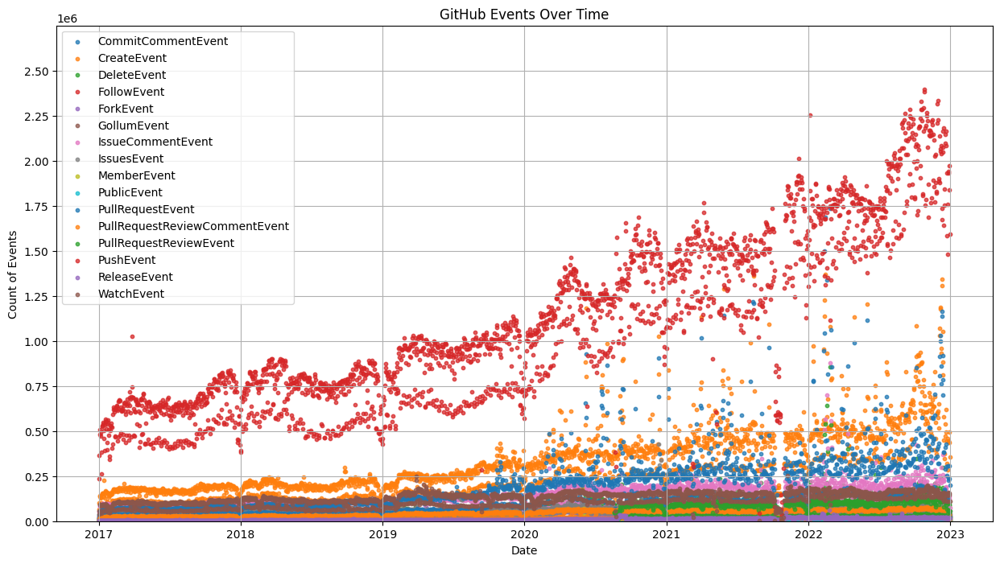

In [4]:
plt.figure(figsize=(15, 8))

# For each type of event, plot the data points
for label, grp in df.groupby('type'):
    plt.scatter(grp['date'], grp['cnt'], s=10, alpha=0.75, label=label)

plt.title('GitHub Events Over Time')
plt.xlabel('Date')
plt.ylabel('Count of Events')

plt.ylim(0, 2500000 + 250000)
plt.yticks(range(0, 2500000 + 250000, 250000))

plt.legend(markerscale=1)
plt.grid(True)

plt.show()

In [5]:
# Group by 'type' and aggregate data
summary_df = df.groupby('type').agg(
    First_Occurrence=pd.NamedAgg(column='date', aggfunc='min'),
    Last_Occurrence=pd.NamedAgg(column='date', aggfunc='max'),
    Total_Count=pd.NamedAgg(column='cnt', aggfunc='sum')
).reset_index()
summary_df

,type,First_Occurrence,Last_Occurrence,Total_Count
0,CommitCommentEvent,2017-01-01,2022-12-31,17236618
1,CreateEvent,2017-01-01,2022-12-31,696245413
2,DeleteEvent,2017-01-01,2022-12-31,149799169
3,FollowEvent,2017-12-01,2017-12-01,95
4,ForkEvent,2017-01-01,2022-12-31,96786951
5,GollumEvent,2017-01-01,2022-12-31,15627774
6,IssueCommentEvent,2017-01-01,2022-12-31,277628365
7,IssuesEvent,2017-01-01,2022-12-31,124404544
8,MemberEvent,2017-01-01,2022-12-31,16506749
9,PublicEvent,2017-01-01,2022-12-31,12073604


In [6]:
df = df[(df['type'] != 'FollowEvent') & (df['type'] != 'PullRequestReviewEvent')]

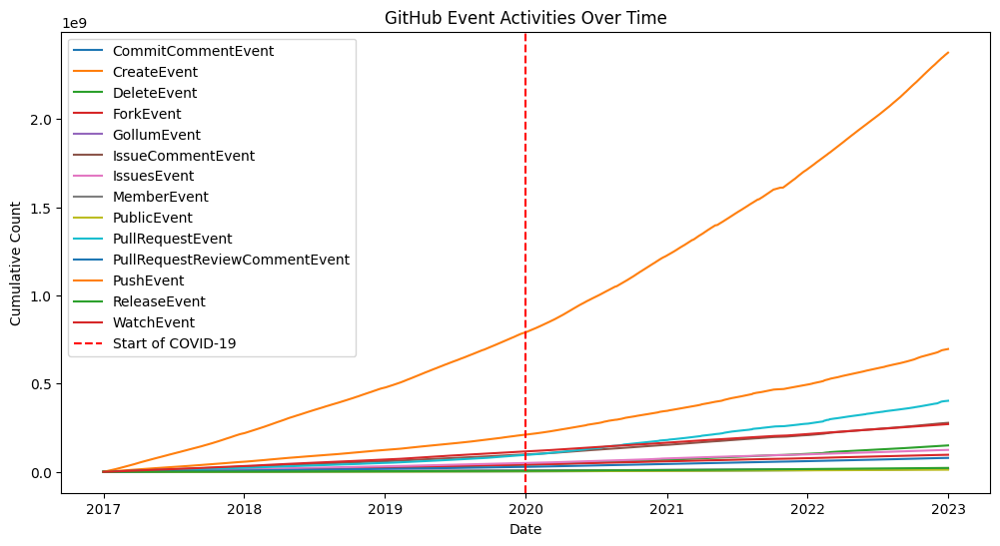

In [7]:
plt.figure(figsize=(12, 6))
for event_type, group_data in df.groupby('type'):
    plt.plot(group_data['date'], group_data['cnt'].cumsum(), label=event_type)

plt.axvline(x=covid_start, color='r', linestyle='--', label='Start of COVID-19')

plt.title('GitHub Event Activities Over Time')
plt.xlabel('Date')
plt.ylabel('Cumulative Count')
plt.legend()
plt.show()

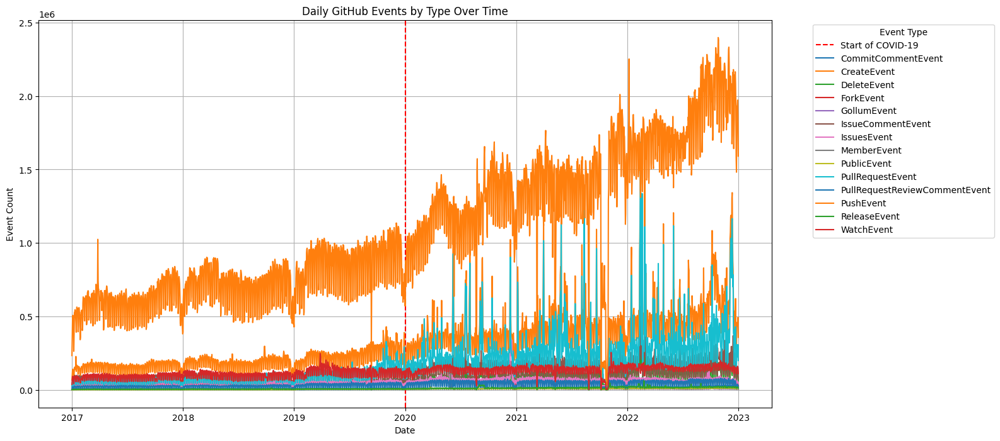

In [8]:
plt.figure(figsize=(15, 8))
plt.title('Daily GitHub Events by Type Over Time')
plt.xlabel('Date')
plt.ylabel('Event Count')

plt.axvline(x=covid_start, color='r', linestyle='--', label='Start of COVID-19')

for event_type, group in df.groupby('type'):
    plt.plot(group['date'], group['cnt'], label=event_type)

plt.legend(title='Event Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

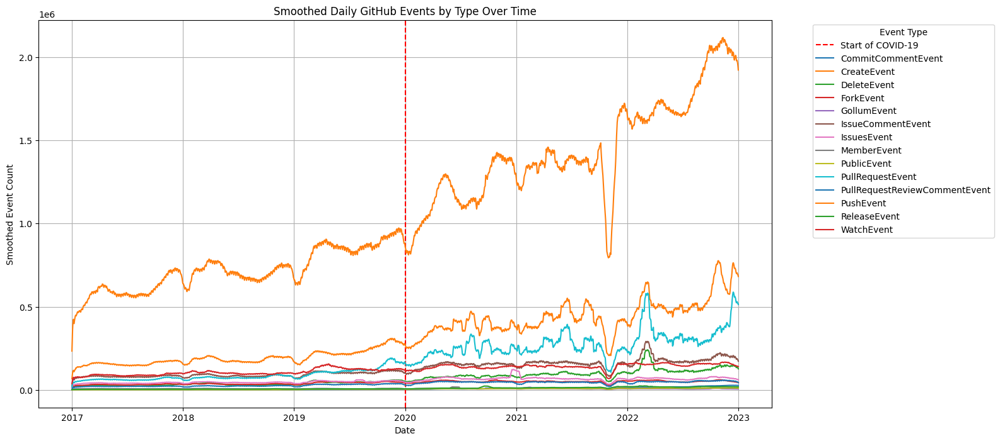

In [9]:
window_size = 30

plt.figure(figsize=(15, 8))
plt.title('Smoothed Daily GitHub Events by Type Over Time')
plt.xlabel('Date')
plt.ylabel('Smoothed Event Count')

plt.axvline(x=covid_start, color='r', linestyle='--', label='Start of COVID-19')

for event_type, group in df.groupby('type'):
    # Apply a moving average on the 'cnt' for each type
    group['smoothed_cnt'] = group['cnt'].rolling(window=window_size, min_periods=1).mean()
    plt.plot(group['date'], group['smoothed_cnt'], label=event_type)

plt.legend(title='Event Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

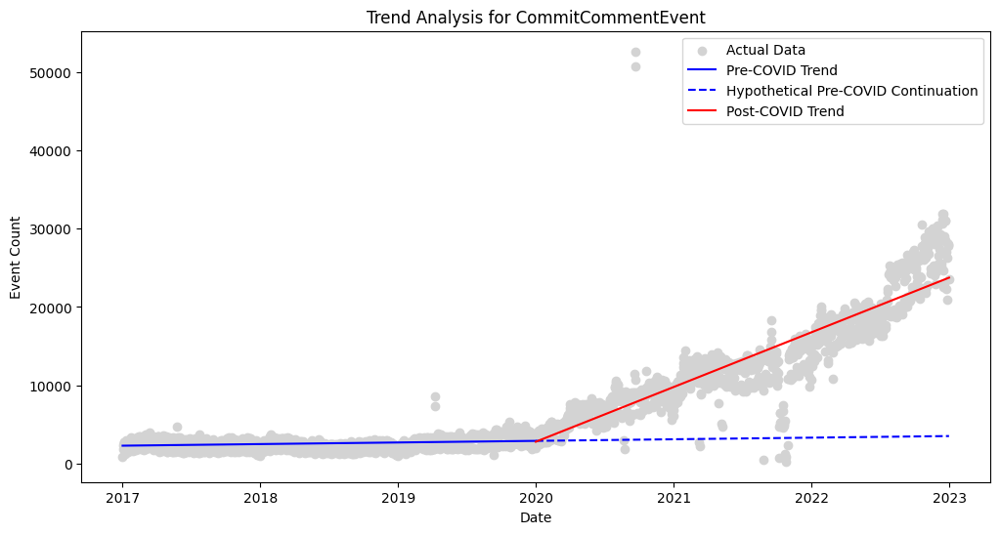

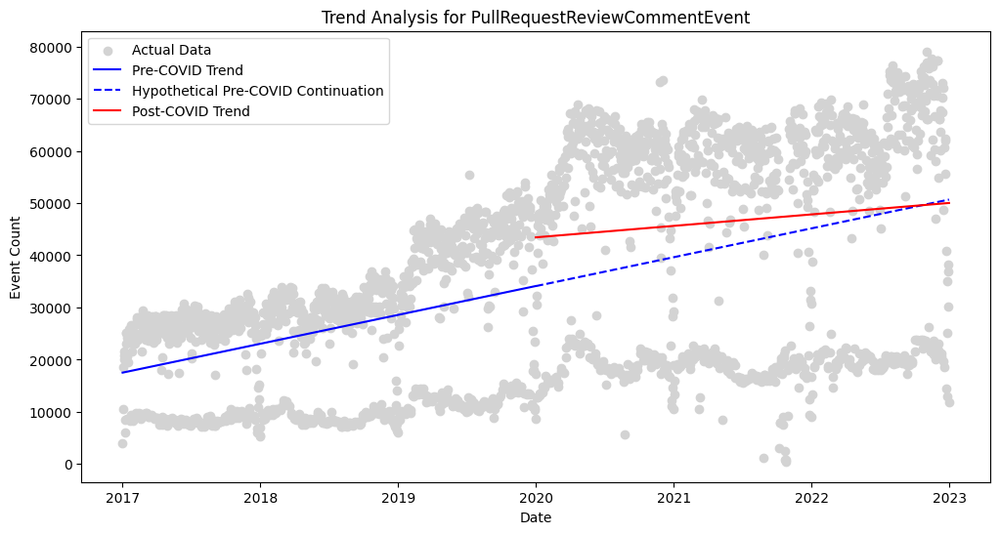

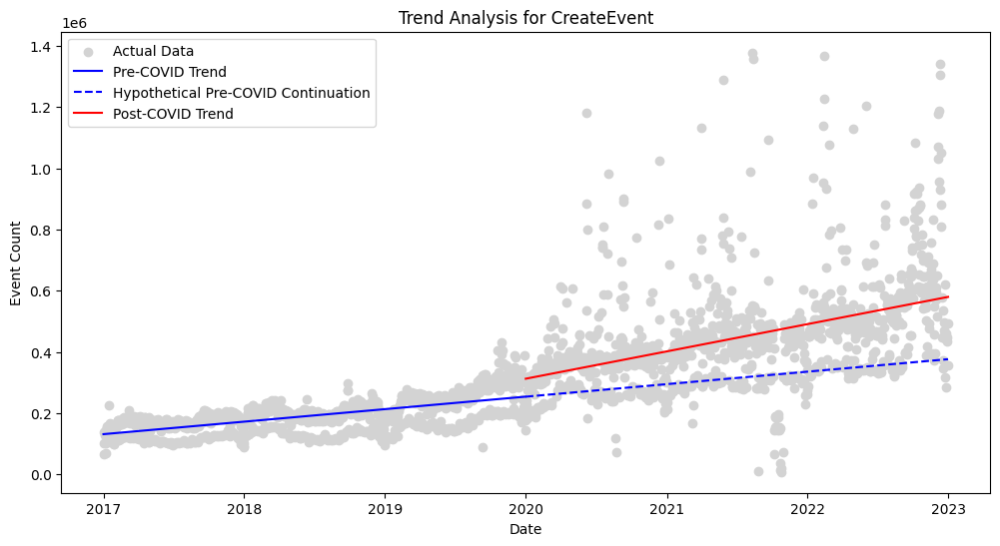

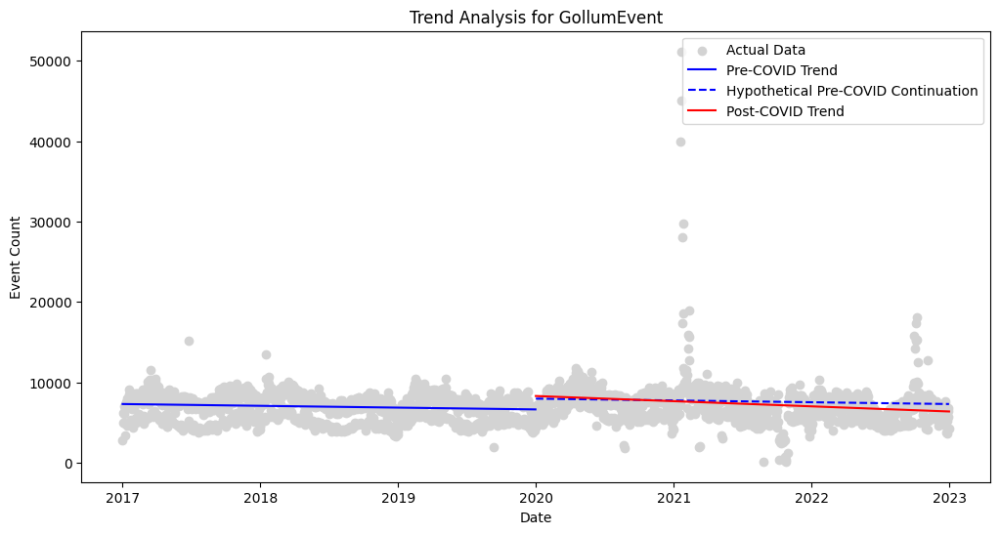

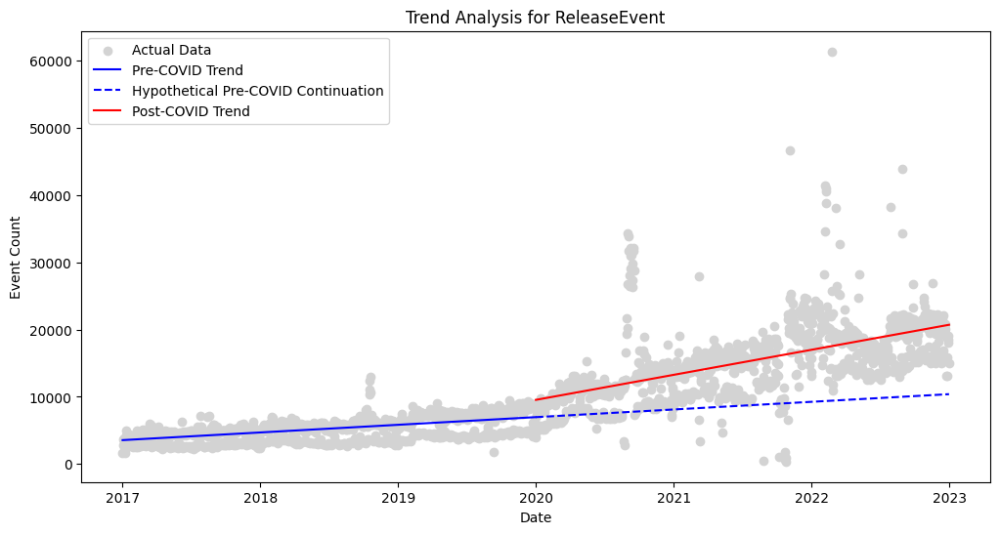

...

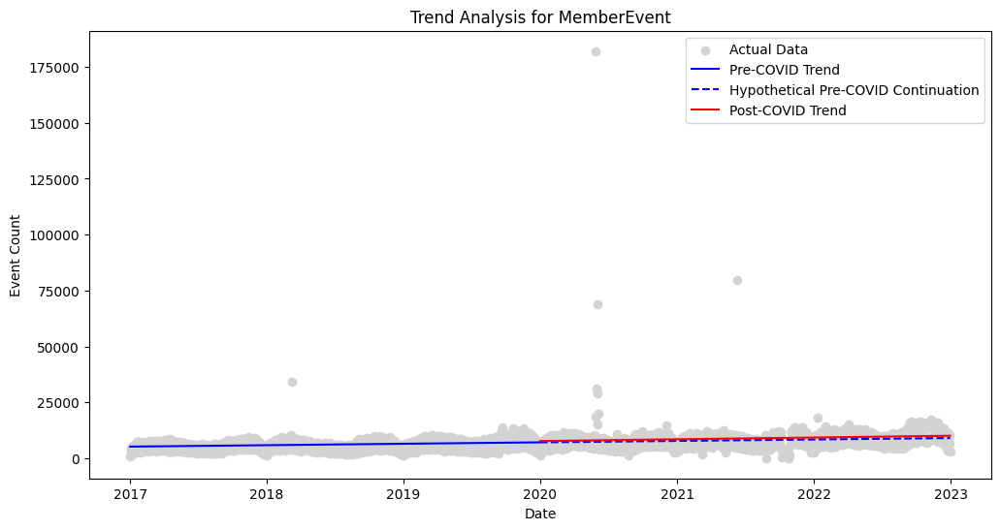

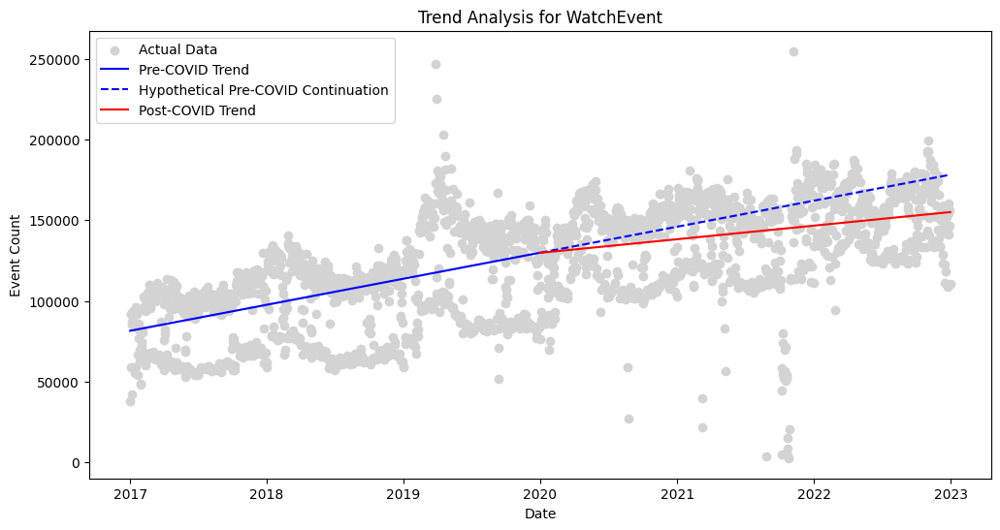

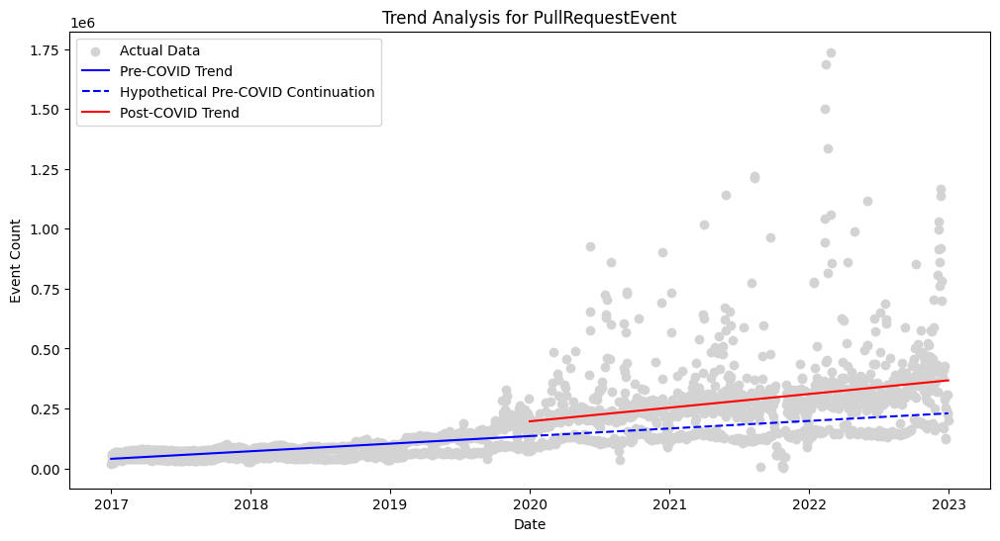

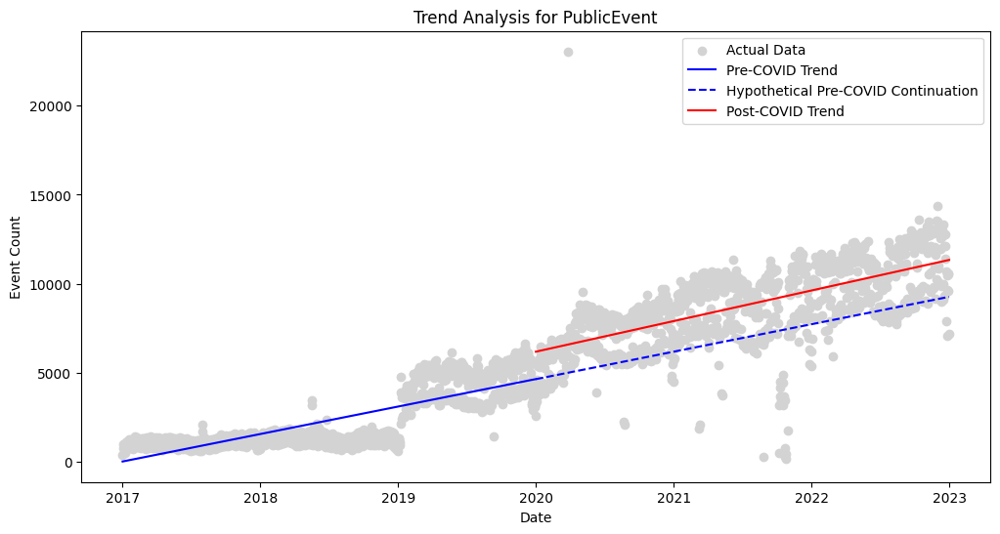

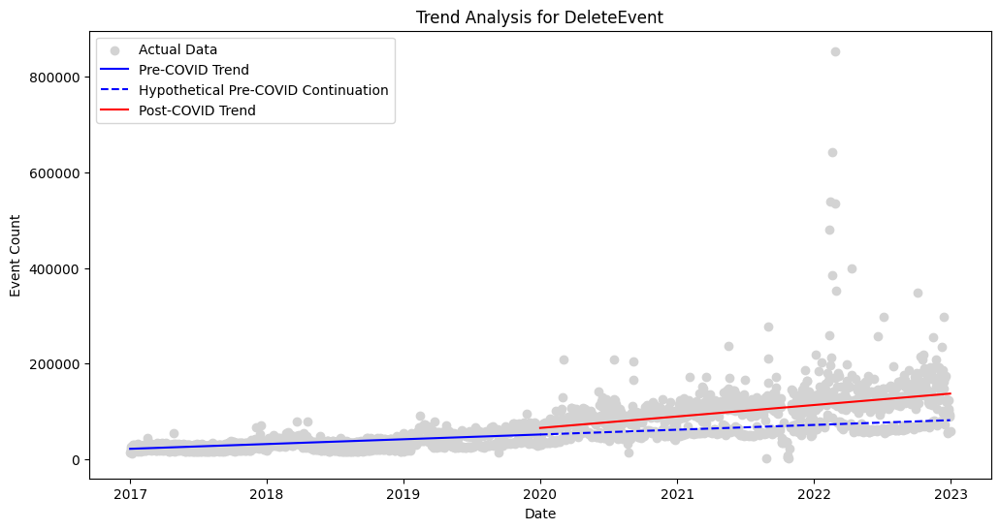

In [10]:
def perform_adf_test(series):
    result = adfuller(series, autolag='AIC')
    return result[0], result[1], result[4]

def plot_regression(data, date_col, cnt_col, event_type):
    # Split data into pre and post COVID
    pre_covid = data[data[date_col] < covid_start]
    post_covid = data[data[date_col] >= covid_start]

    # Prepare for regression
    X_pre = (pre_covid[date_col] - pre_covid[date_col].min()).dt.days.values.reshape(-1, 1)
    X_post = (post_covid[date_col] - post_covid[date_col].min()).dt.days.values.reshape(-1, 1)

    y_pre = pre_covid[cnt_col].values
    y_post = post_covid[cnt_col].values

    # Fit regression
    model_pre = LinearRegression().fit(X_pre, y_pre)
    model_post = LinearRegression().fit(X_post, y_post)

    slope_pre = model_pre.coef_[0]
    slope_post = model_post.coef_[0]
    relative_change = slope_post / slope_pre if slope_pre != 0 else np.inf

    X_pre_predict = np.linspace(X_pre.min(), X_pre.max(), 300).reshape(-1, 1)
    X_post_predict = np.linspace(X_post.min(), X_post.max(), 300).reshape(-1, 1)

    # Predict values
    y_pre_predict = model_pre.predict(X_pre_predict)
    y_post_predict = model_post.predict(X_post_predict)

    plt.figure(figsize=(12, 6))
    plt.scatter(data[date_col], data[cnt_col], color='lightgray', label='Actual Data')
    plt.plot(pre_covid[date_col].min() + pd.to_timedelta(X_pre_predict.flatten(), 'days'), y_pre_predict, 'b-', label='Pre-COVID Trend')
    plt.plot(post_covid[date_col].min() + pd.to_timedelta(X_post_predict.flatten(), 'days'), y_pre_predict.max() - y_pre_predict.min() + y_pre_predict, 'b--', label='Hypothetical Pre-COVID Continuation')
    plt.plot(post_covid[date_col].min() + pd.to_timedelta(X_post_predict.flatten(), 'days'), y_post_predict, 'r-', label='Post-COVID Trend')
    plt.title(f'Trend Analysis for {event_type}')
    plt.xlabel('Date')
    plt.ylabel('Event Count')
    plt.legend()
    plt.show()

    return slope_pre, slope_post, relative_change

# Initialize a dictionary to hold the results
adf_results = {'Event': [], 'Test Statistic': [], 'P-Value': [], 'Conclusion': [], 'Pre-COVID Slope': [], 'During COVID Slope': [], 'Relative Change': []}

for event_type in df['type'].unique():
    temp_df = df[df['type'] == event_type]
    slope_pre, slope_post, relative_change = plot_regression(temp_df, 'date', 'cnt', event_type)
    adf_results['Event'].append(event_type)
    adf_results['Pre-COVID Slope'].append(slope_pre)
    adf_results['During COVID Slope'].append(slope_post)
    adf_results['Relative Change'].append(f'{relative_change:.2f}x')
    test_statistic, p_value, crit_values = perform_adf_test(temp_df['cnt'])
    adf_results['Test Statistic'].append(round(test_statistic, 2))
    adf_results['P-Value'].append(round(p_value, 4))
    conclusion = 'Stationary' if p_value < 0.05 else 'Non-stationary'
    adf_results['Conclusion'].append(conclusion)

adf_table = pd.DataFrame(adf_results)

In [11]:
adf_table

,Event,Test Statistic,P-Value,Conclusion,Pre-COVID Slope,During COVID Slope,Relative Change
0,CommitCommentEvent,0.64,0.9887,Non-stationary,0.562383,19.152553,34.06x
1,PullRequestReviewCommentEvent,-2.78,0.0617,Non-stationary,15.155756,6.013723,0.40x
2,CreateEvent,-2.41,0.1400,Non-stationary,111.983710,244.170533,2.18x
3,GollumEvent,-6.52,0.0000,Stationary,-0.610854,-1.755661,2.87x
4,ReleaseEvent,-1.79,0.3869,Non-stationary,3.124086,10.200311,3.27x
5,ForkEvent,-3.19,0.0205,Stationary,16.390007,1.550694,0.09x
6,IssuesEvent,-3.94,0.0017,Stationary,13.088893,0.369872,0.03x
7,PushEvent,-1.30,0.6275,Non-stationary,341.613063,859.199476,2.52x
8,IssueCommentEvent,-2.96,0.0387,Stationary,30.392970,47.648365,1.57x
9,MemberEvent,-6.11,0.0000,Stationary,1.750321,2.157079,1.23x


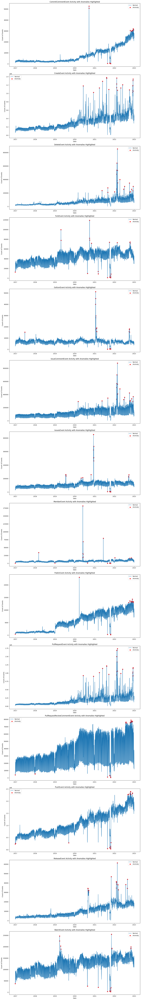

In [12]:
# Normalize data function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data)

# Fit Isolation Forest and detect anomalies
def detect_anomalies(data):
    model = IsolationForest(n_estimators=100, contamination=0.01)  # Adjust as needed
    return model.fit_predict(data)

plt.figure(figsize=(14, 7 * len(df['type'].unique())))
for idx, (event_type, group) in enumerate(df.groupby('type')):
    X = group[['cnt']].values
    X_scaled = normalize_data(X)

    # Detect anomalies
    group['anomaly'] = detect_anomalies(X_scaled)
    group['anomaly'] = group['anomaly'].map({1: 'Normal', -1: 'Anomaly'})

    plt.subplot(len(df['type'].unique()), 1, idx + 1)
    plt.plot(group['date'], group['cnt'], label='Normal')
    anomalies = group[group['anomaly'] == 'Anomaly']
    plt.scatter(anomalies['date'], anomalies['cnt'], color='red', label='Anomaly')
    plt.title(f'{event_type} Activity with Anomalies Highlighted')
    plt.xlabel('Date')
    plt.ylabel('Count of Events')
    plt.legend()

plt.tight_layout()
plt.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/22ulzqlv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/jra0fcmc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48305', 'data', 'file=/tmp/tmpgydxhnxw/22ulzqlv.json', 'init=/tmp/tmpgydxhnxw/jra0fcmc.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_model0515ldcg/prophet_model-20250105074723.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:47:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:47:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

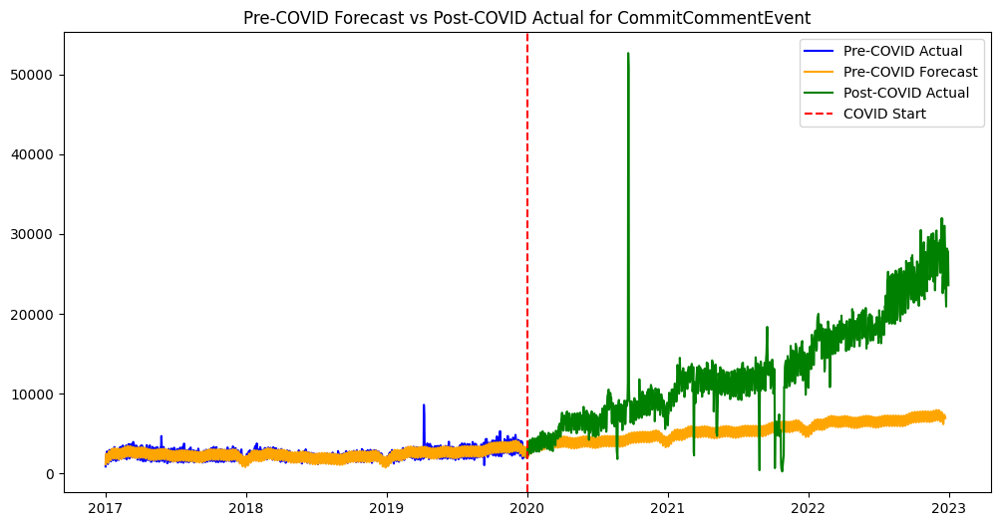

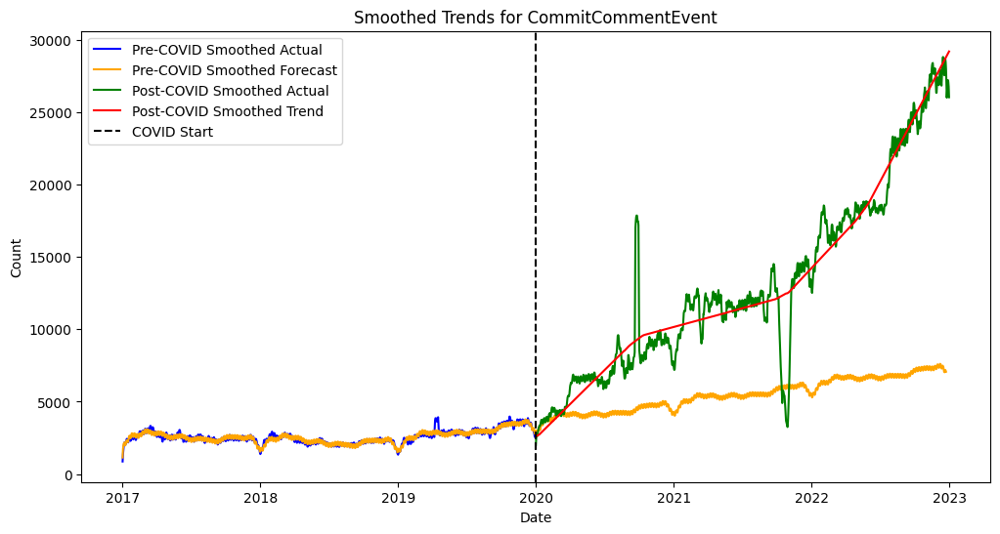

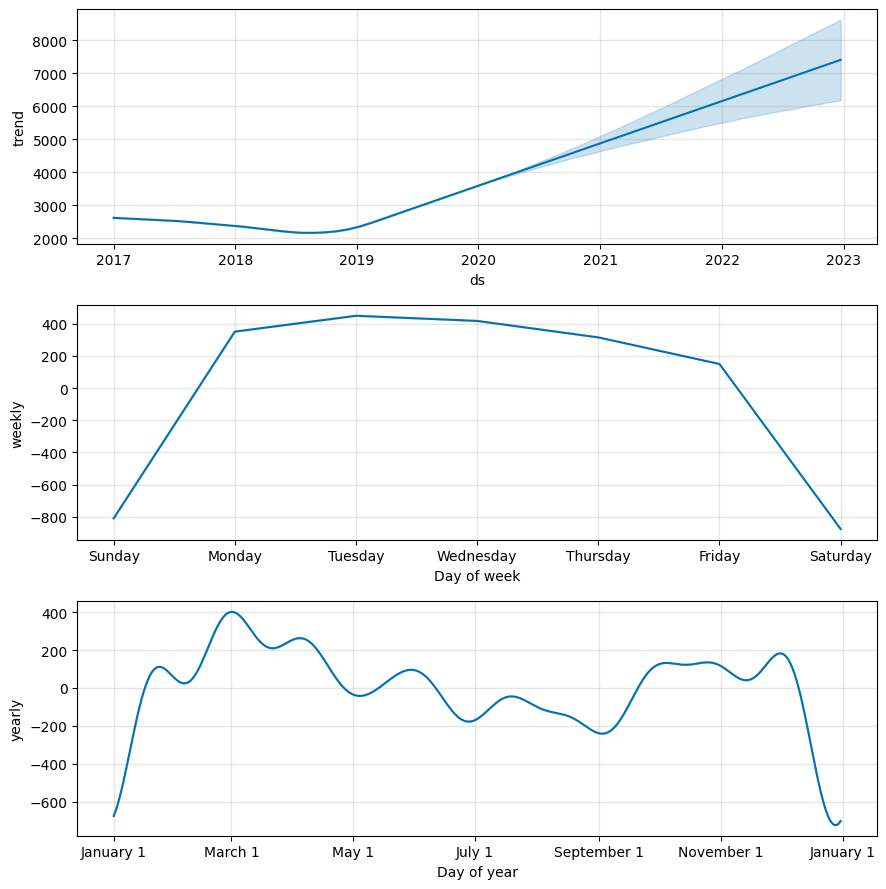

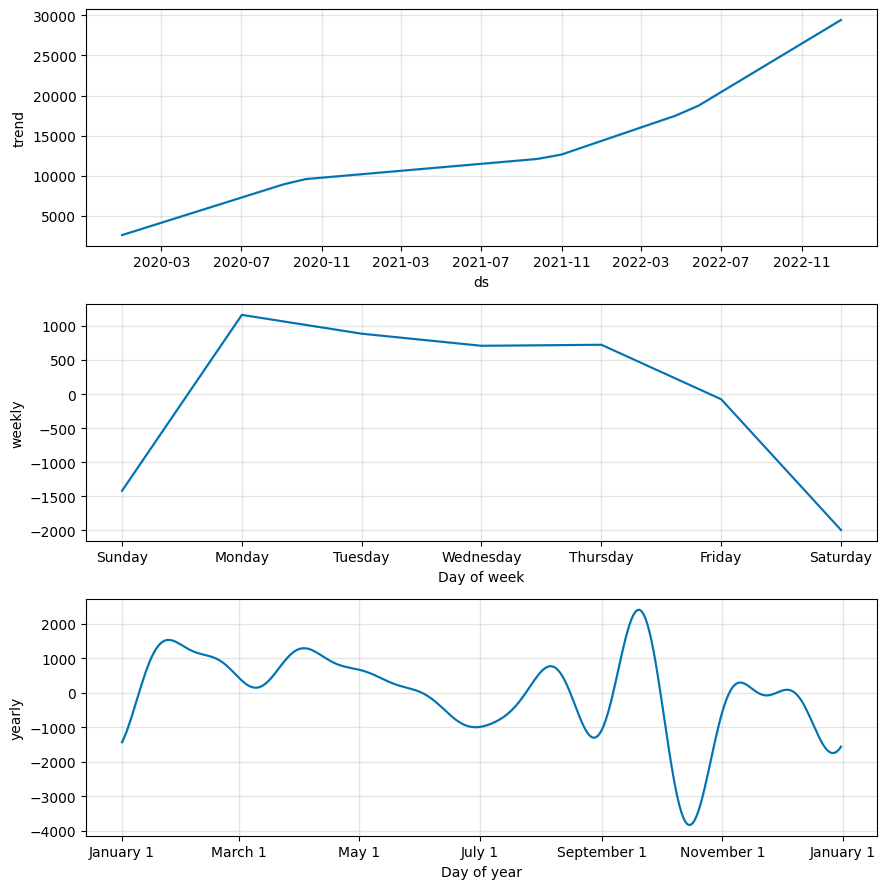

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/jkyejvaw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/w01i42hz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77465', 'data', 'file=/tmp/tmpgydxhnxw/jkyejvaw.json', 'init=/tmp/tmpgydxhnxw/w01i42hz.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_modeleapmica3/prophet_model-20250105074728.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:47:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:47:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

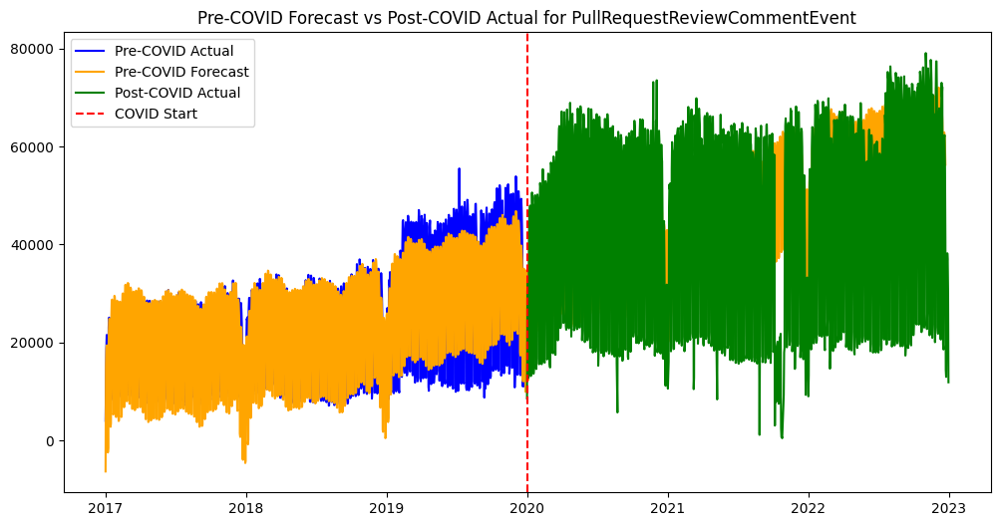

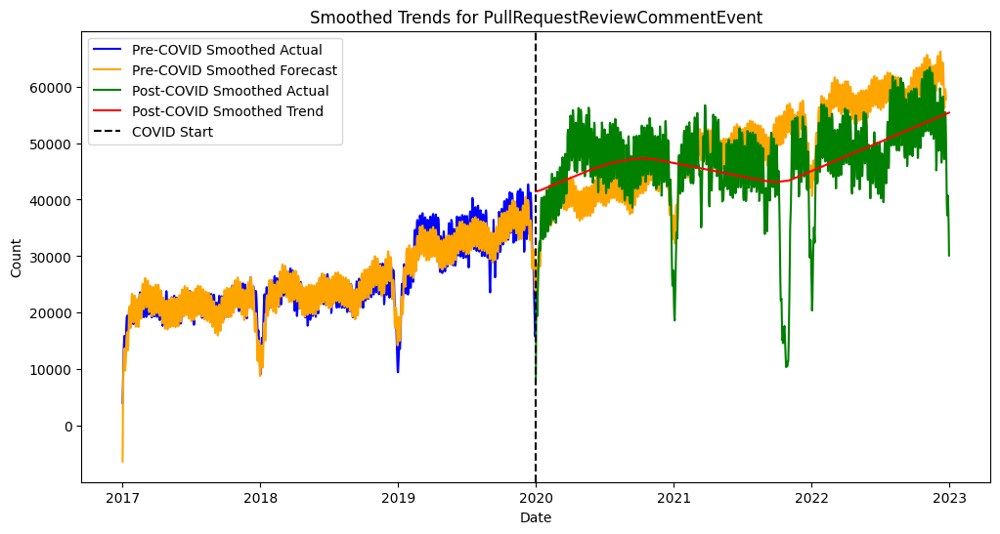

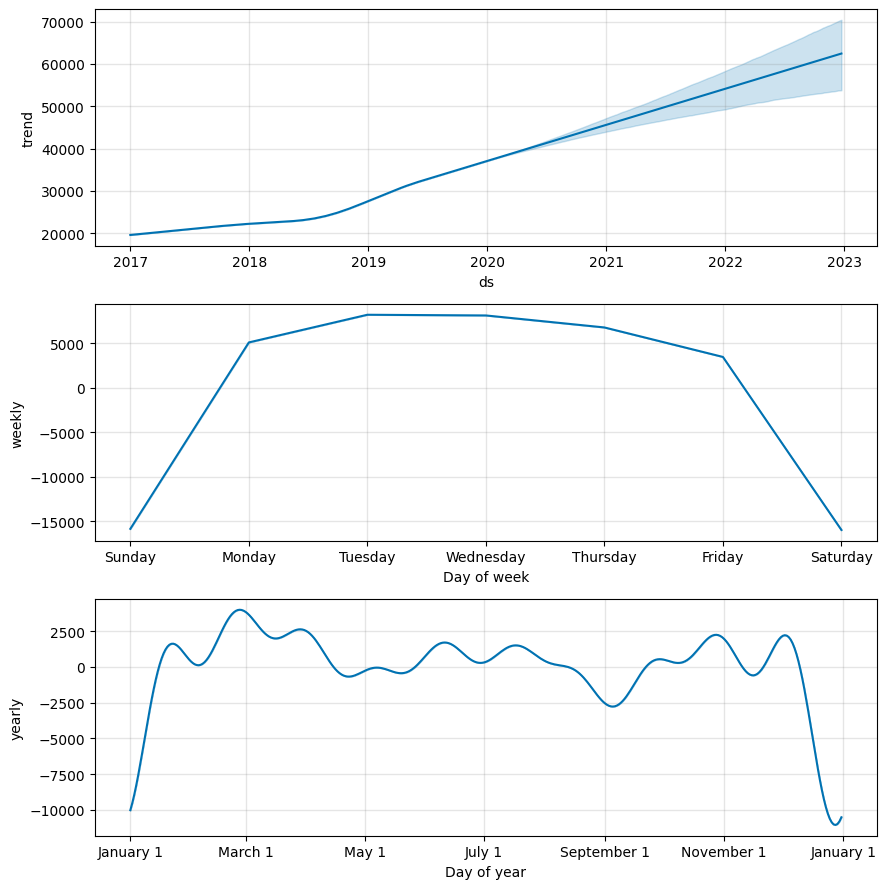

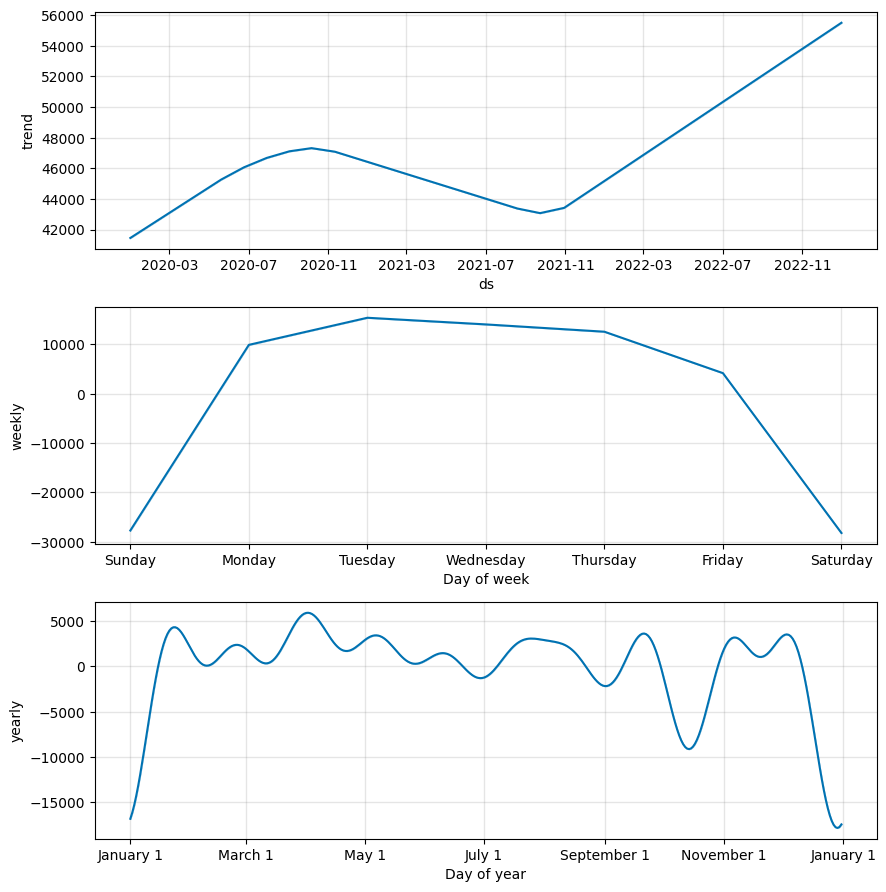

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/t541446v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/5s0v778z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62481', 'data', 'file=/tmp/tmpgydxhnxw/t541446v.json', 'init=/tmp/tmpgydxhnxw/5s0v778z.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_models58e9tmn/prophet_model-20250105074733.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:47:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:47:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

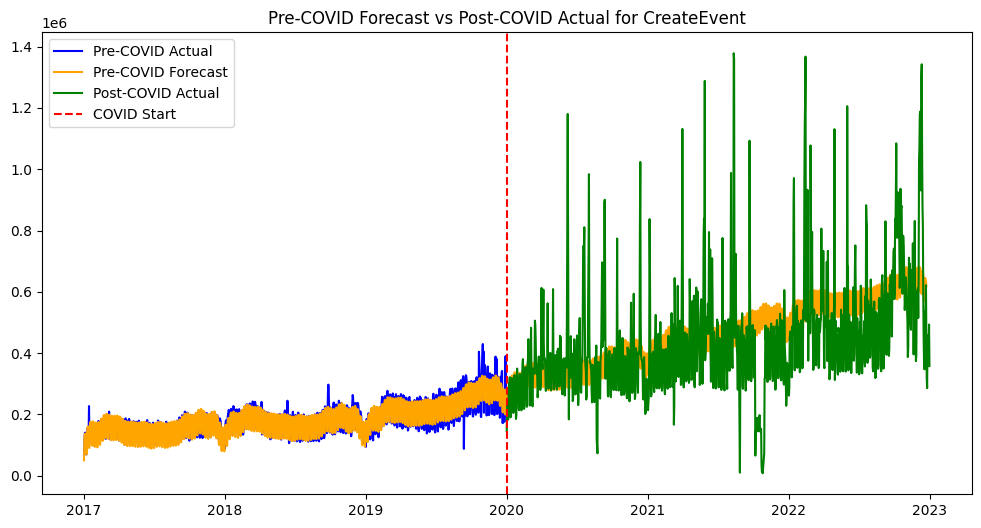

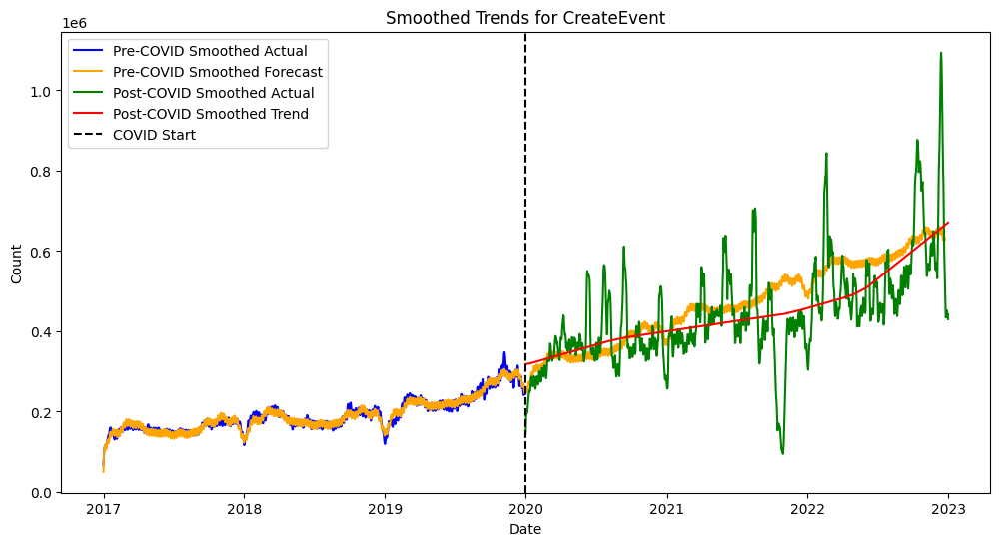

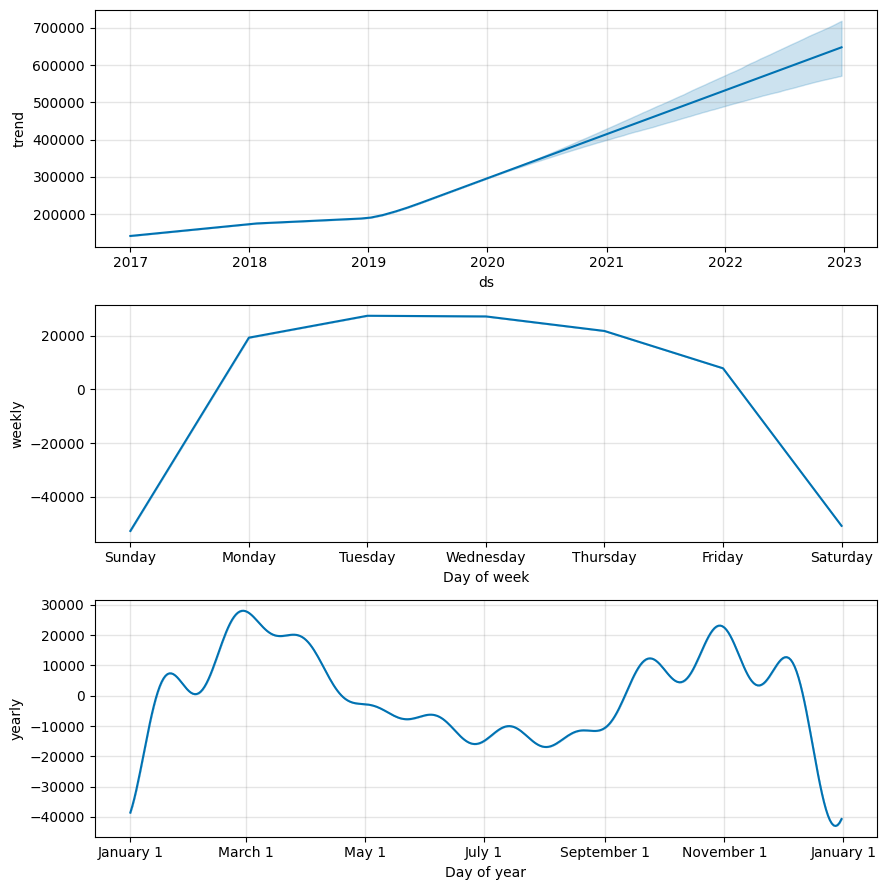

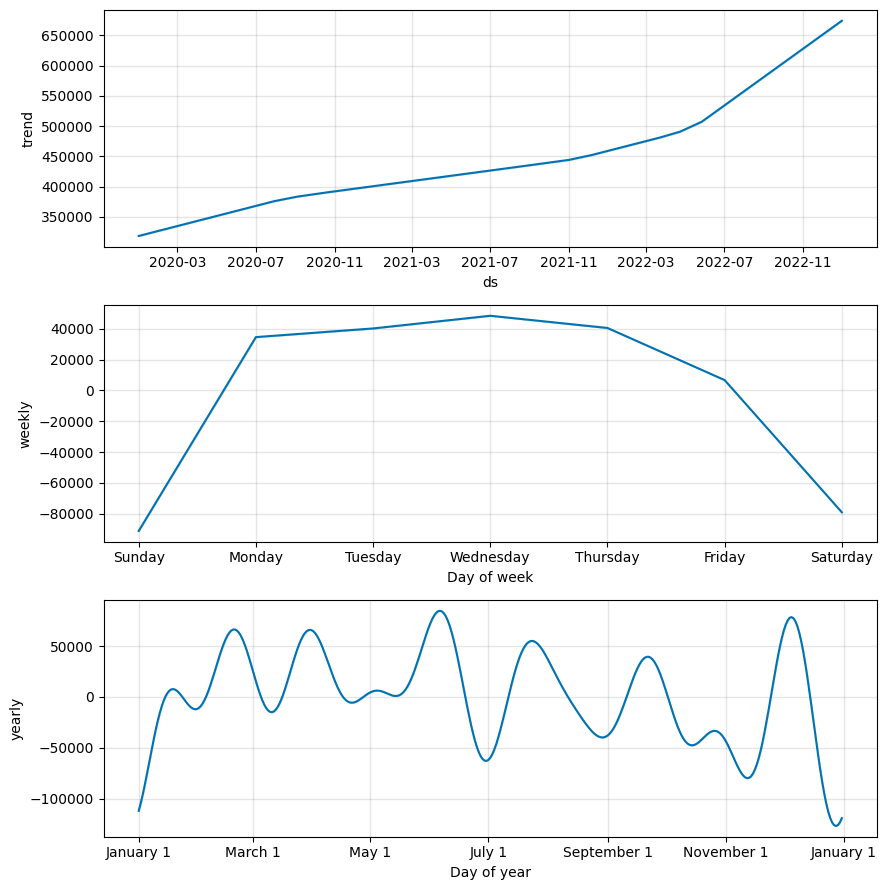

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/eurw9s4e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/_gcqe2xd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30501', 'data', 'file=/tmp/tmpgydxhnxw/eurw9s4e.json', 'init=/tmp/tmpgydxhnxw/_gcqe2xd.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_modelu97en_gh/prophet_model-20250105074737.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:47:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:47:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

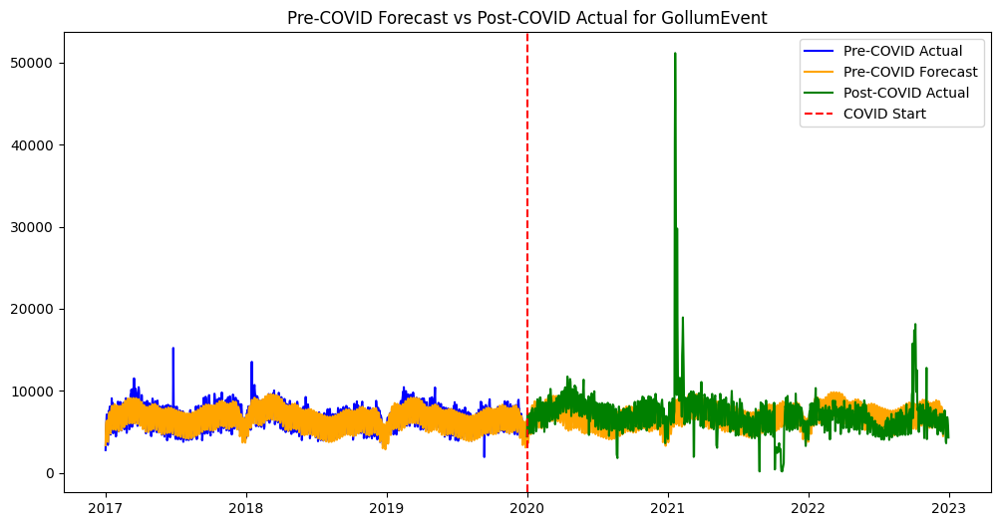

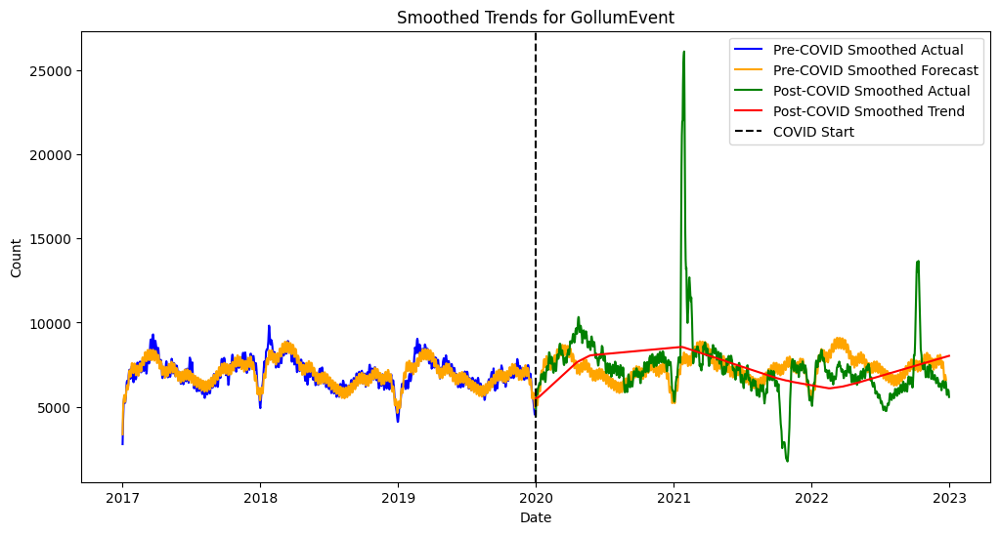

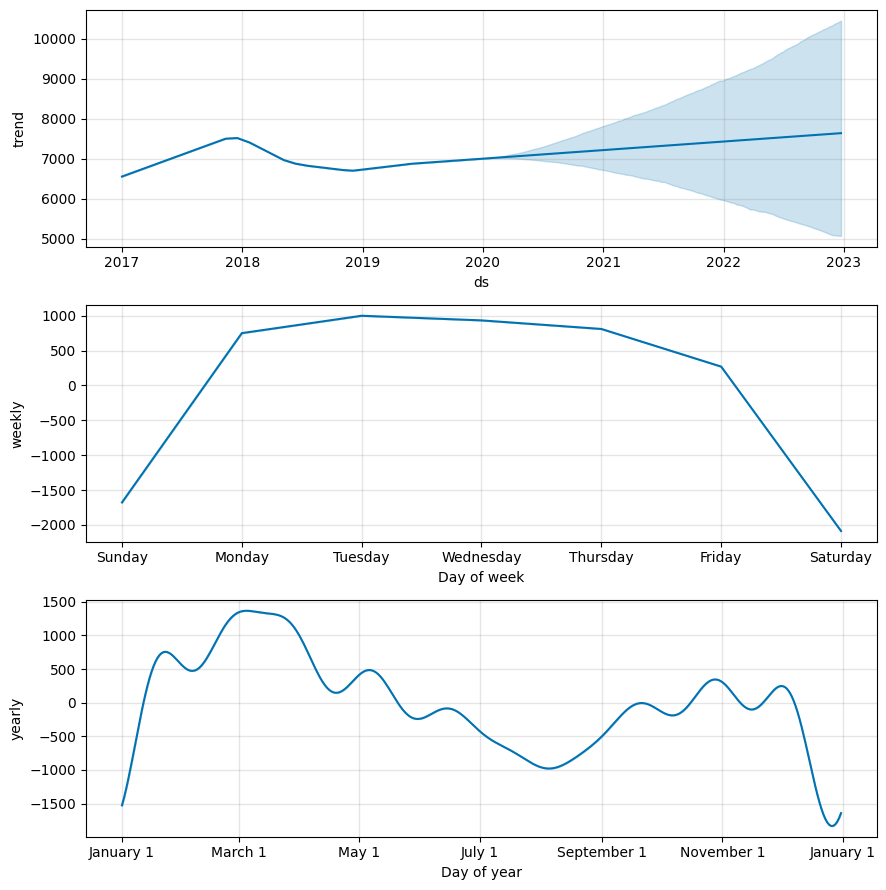

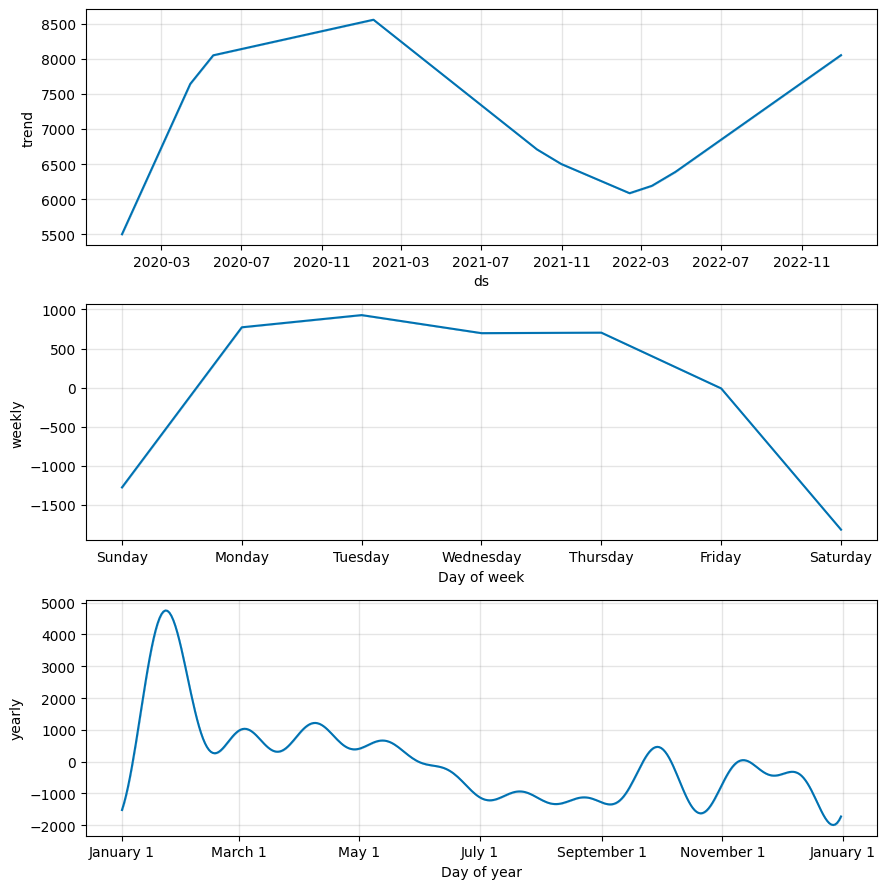

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/r11it2xg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/phywe4ii.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22721', 'data', 'file=/tmp/tmpgydxhnxw/r11it2xg.json', 'init=/tmp/tmpgydxhnxw/phywe4ii.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_modelm22teqcw/prophet_model-20250105074742.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:47:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:47:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

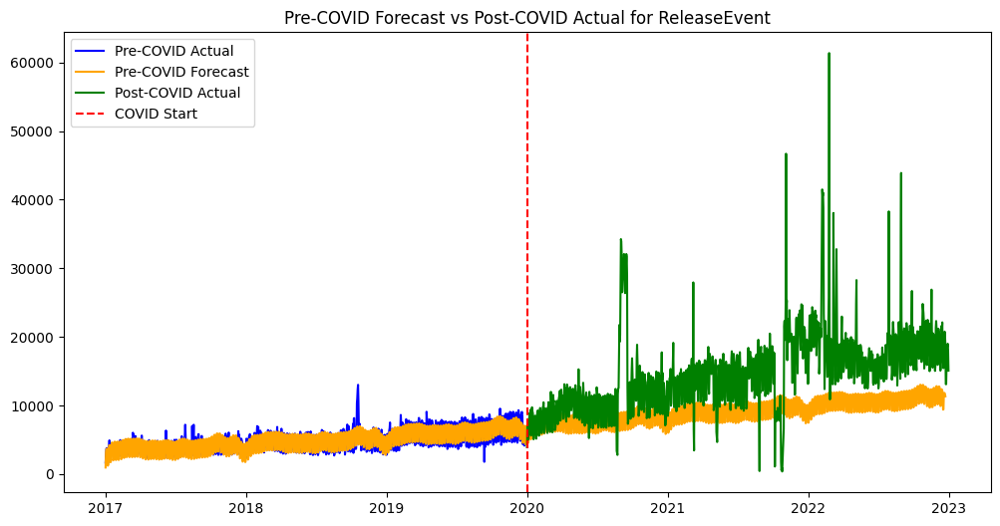

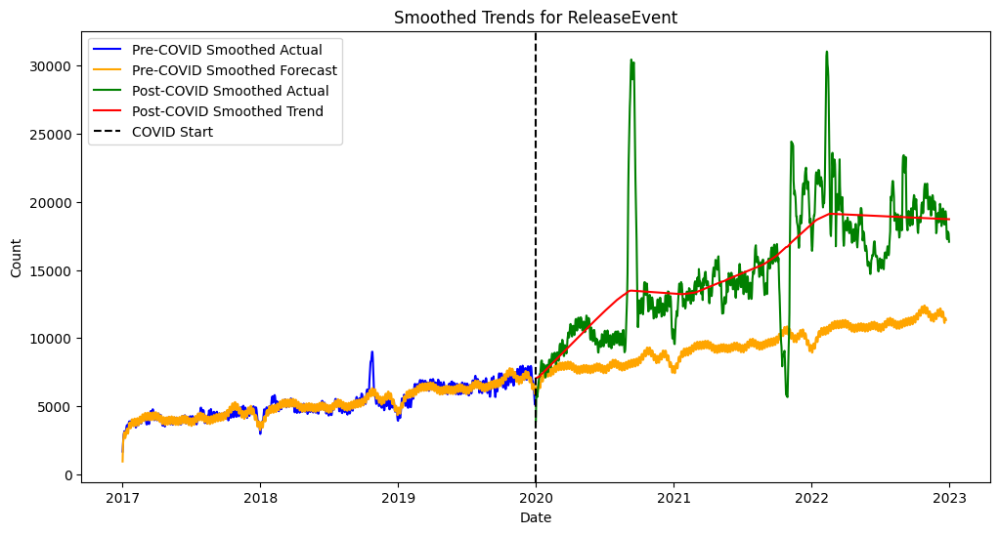

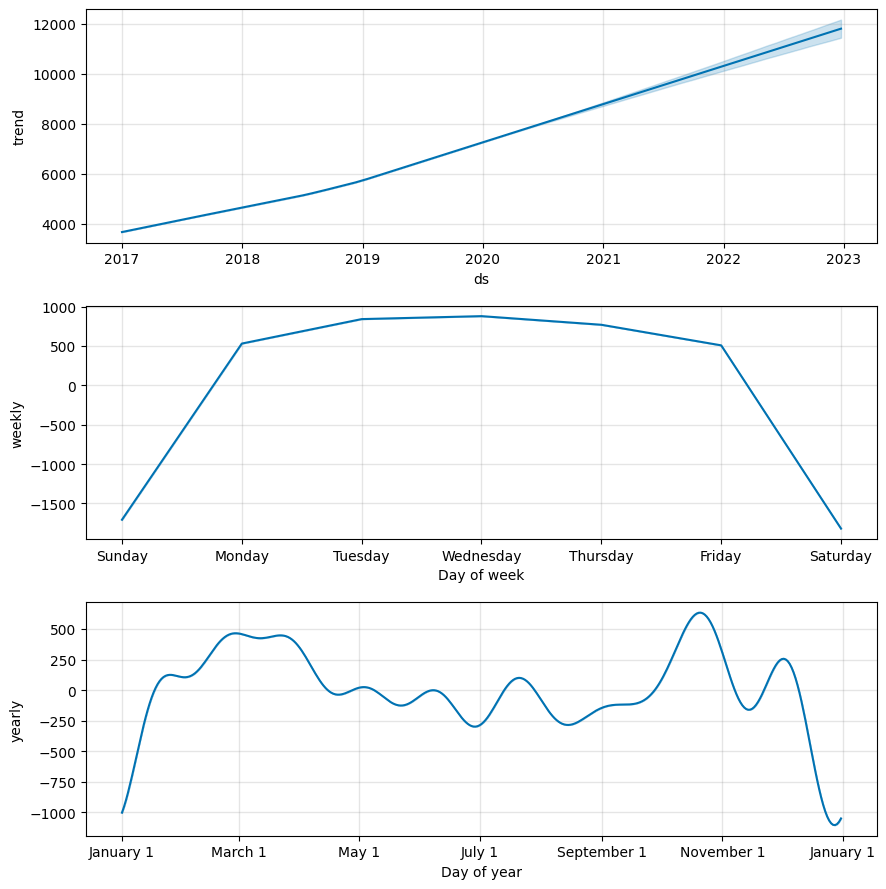

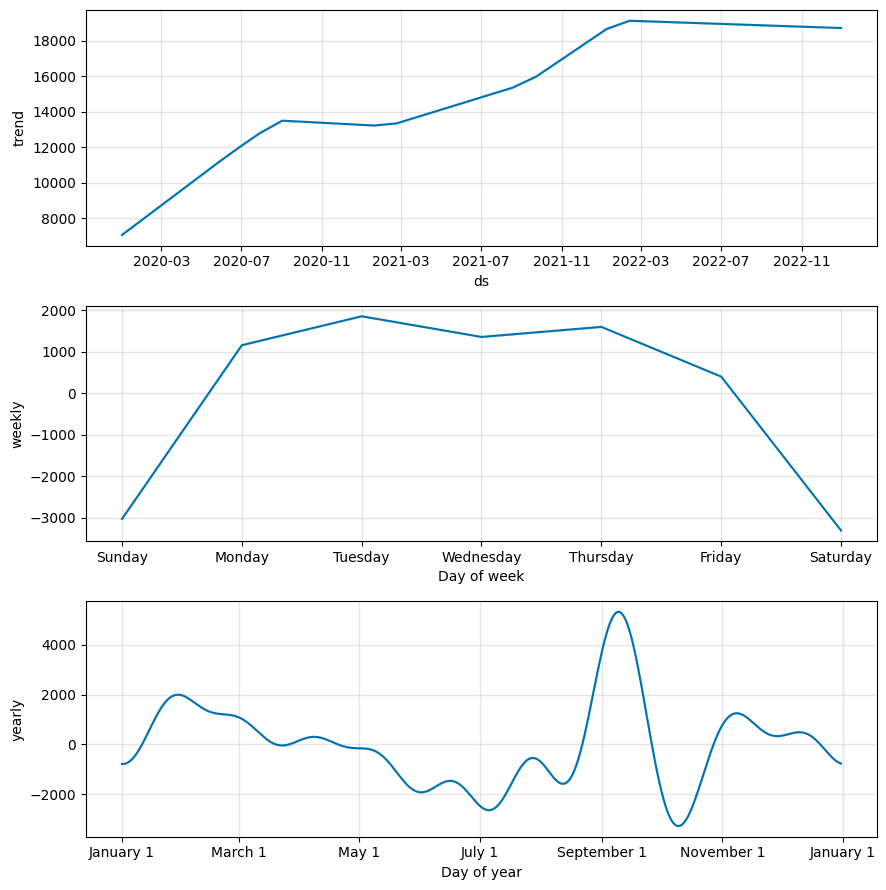

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/b5ph22wv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/slu9y_zu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19510', 'data', 'file=/tmp/tmpgydxhnxw/b5ph22wv.json', 'init=/tmp/tmpgydxhnxw/slu9y_zu.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_model566dun1b/prophet_model-20250105074746.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:47:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:47:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

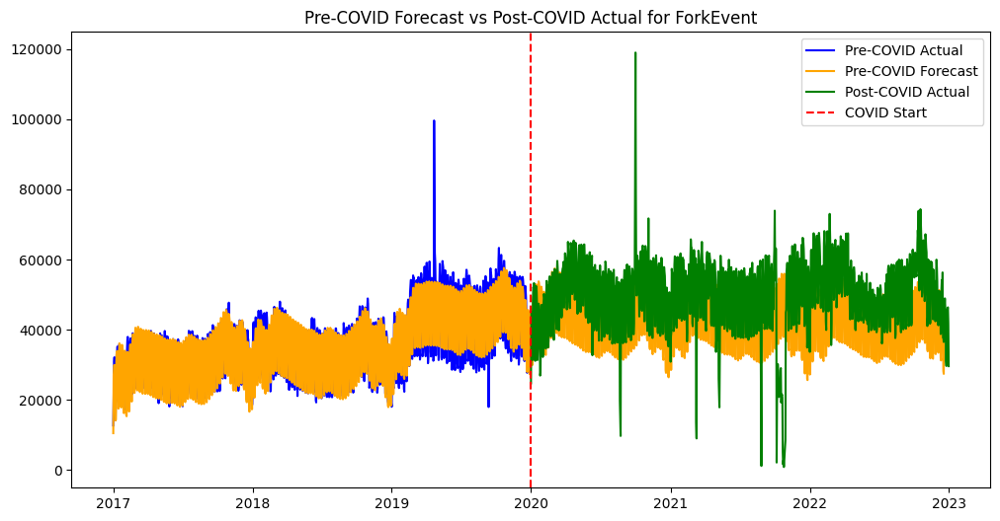

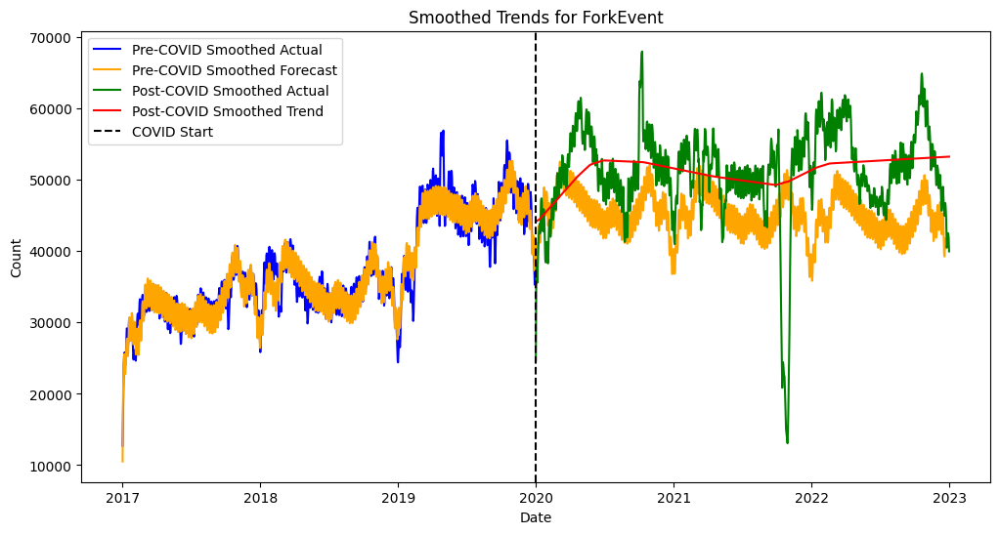

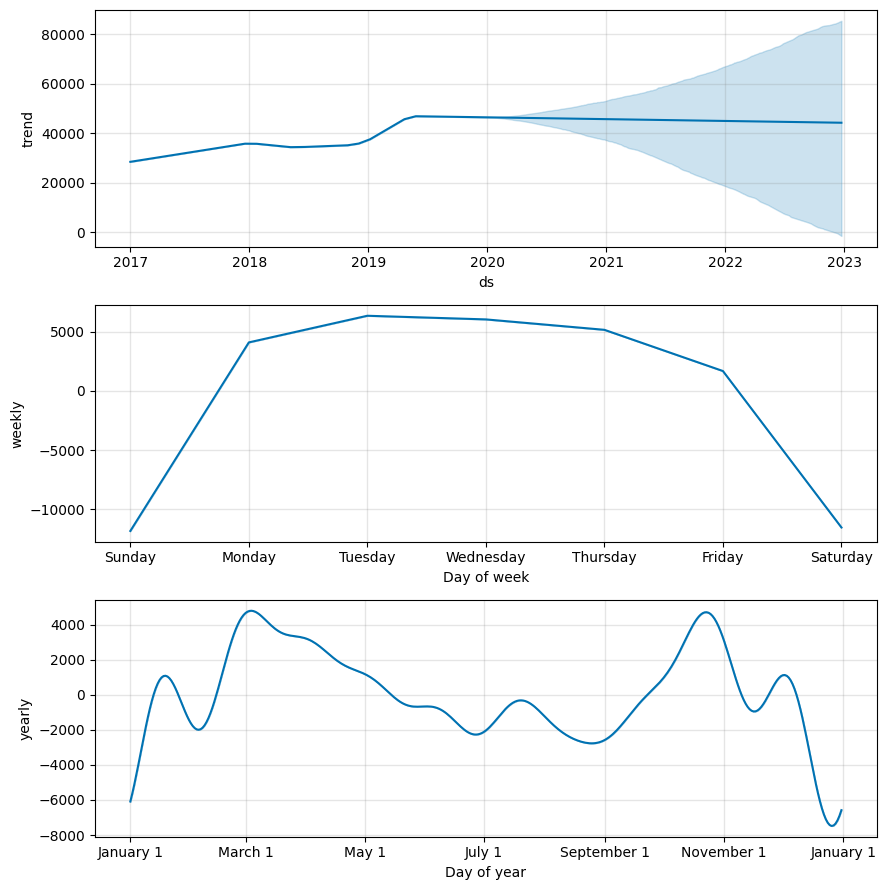

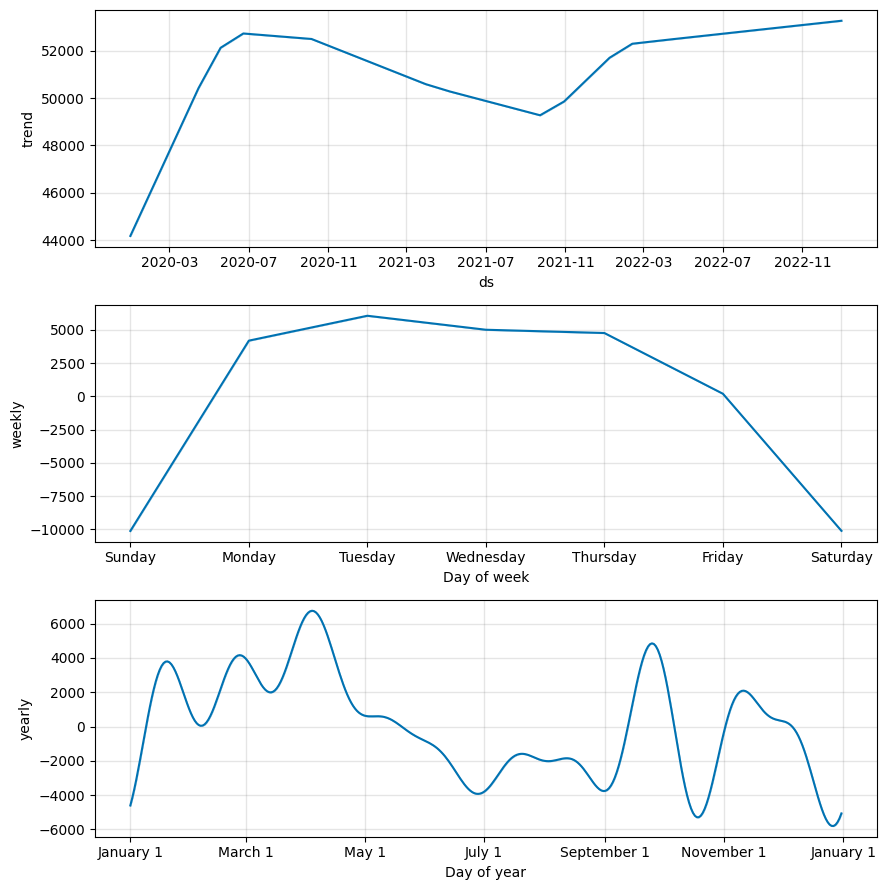

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/se7pdqmj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/p1aem9ng.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48416', 'data', 'file=/tmp/tmpgydxhnxw/se7pdqmj.json', 'init=/tmp/tmpgydxhnxw/p1aem9ng.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_model54wxie6u/prophet_model-20250105074751.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:47:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:47:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

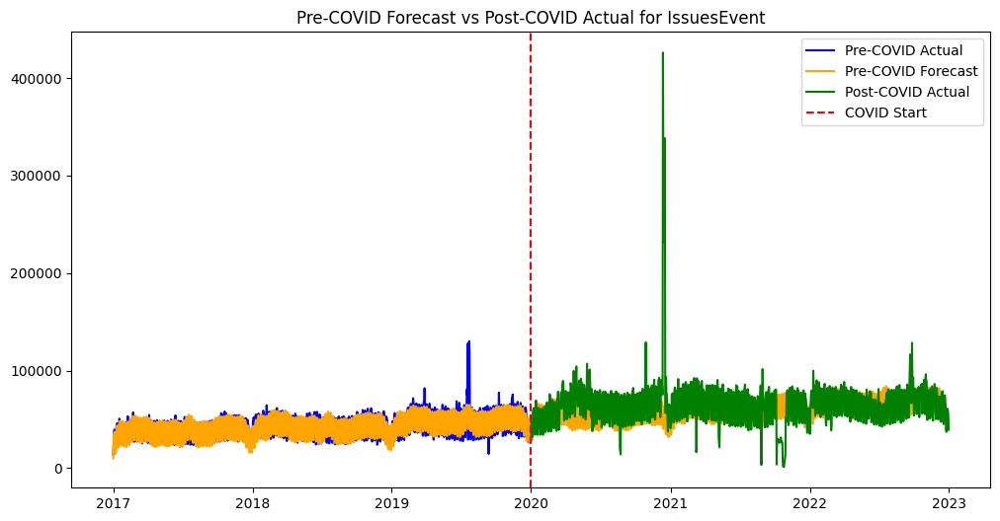

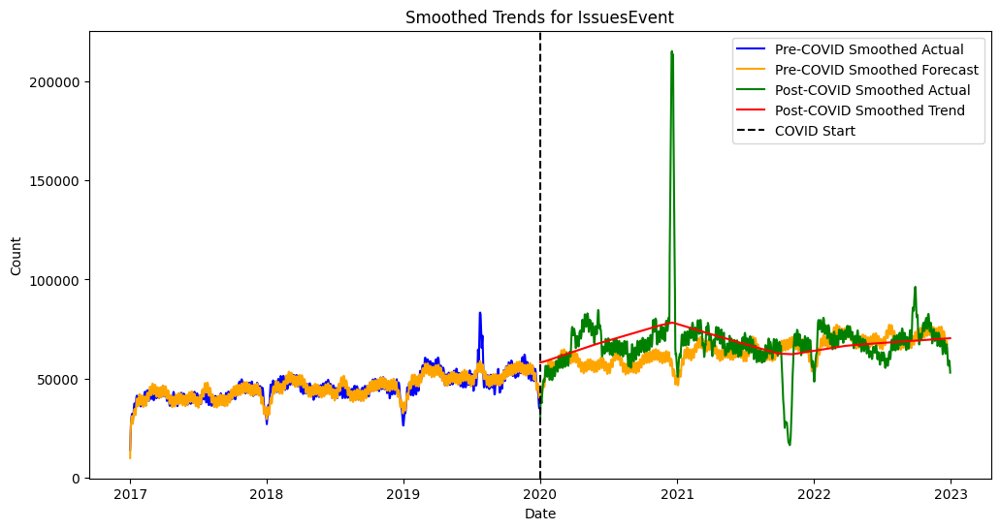

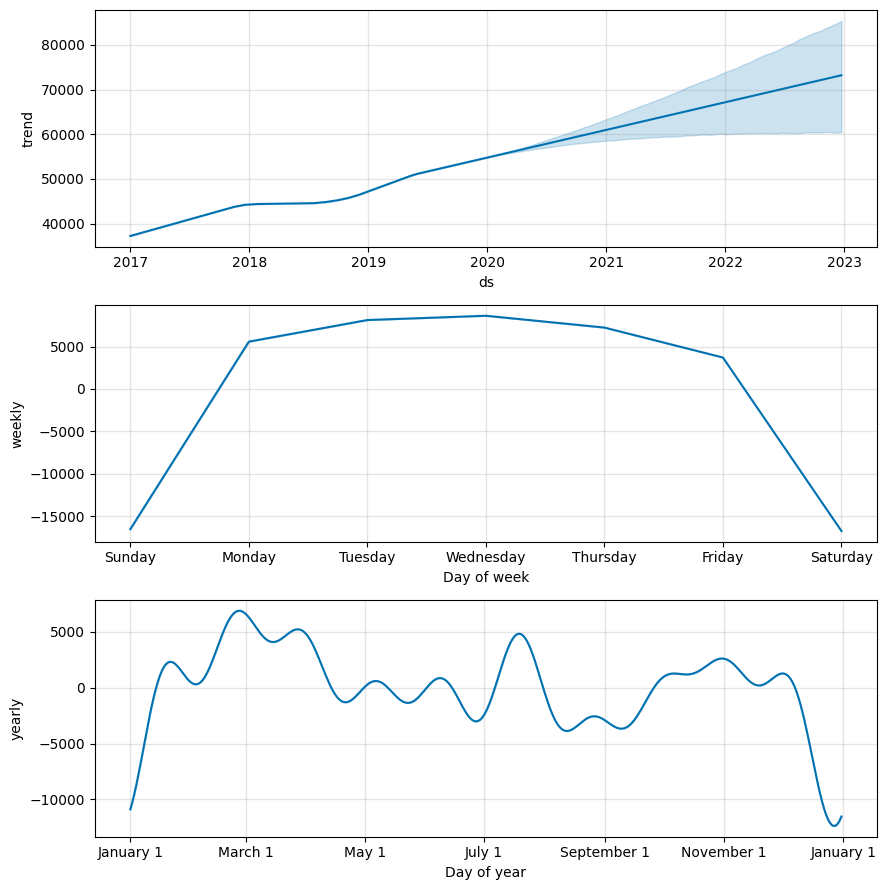

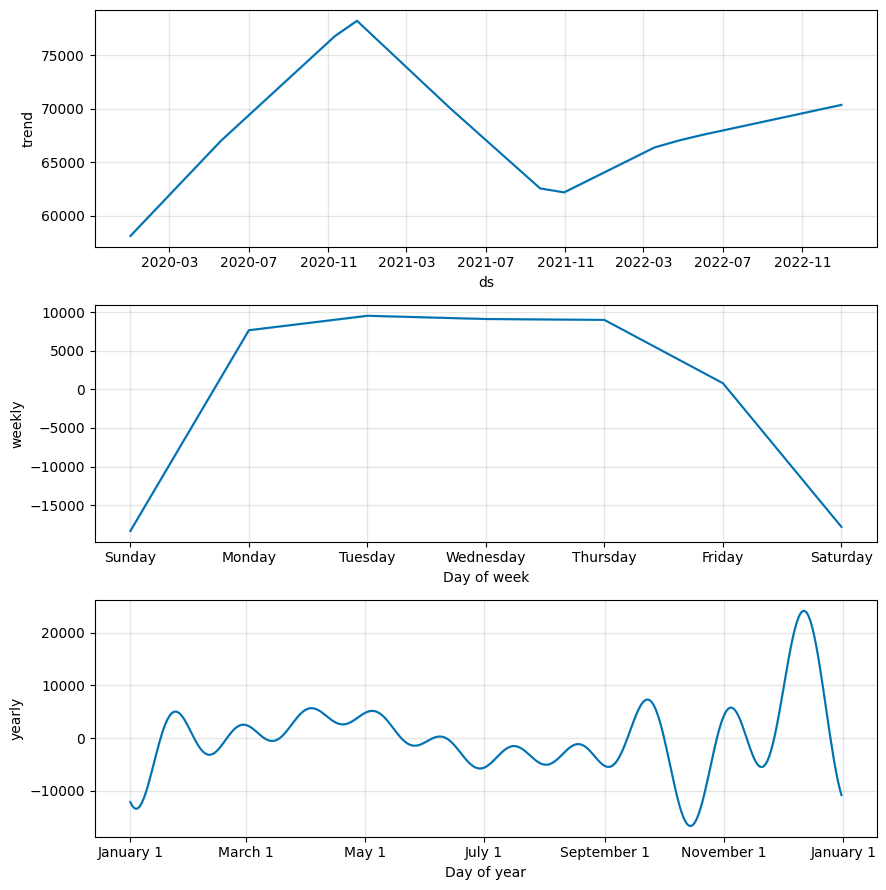

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/s71gwf4t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/tspxzeld.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26384', 'data', 'file=/tmp/tmpgydxhnxw/s71gwf4t.json', 'init=/tmp/tmpgydxhnxw/tspxzeld.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_model5rjku4hg/prophet_model-20250105074756.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:47:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:47:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

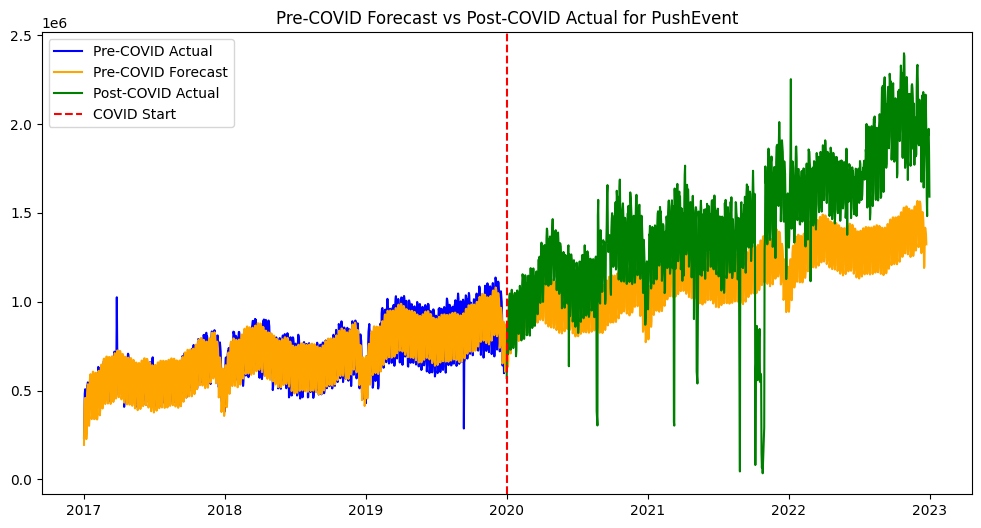

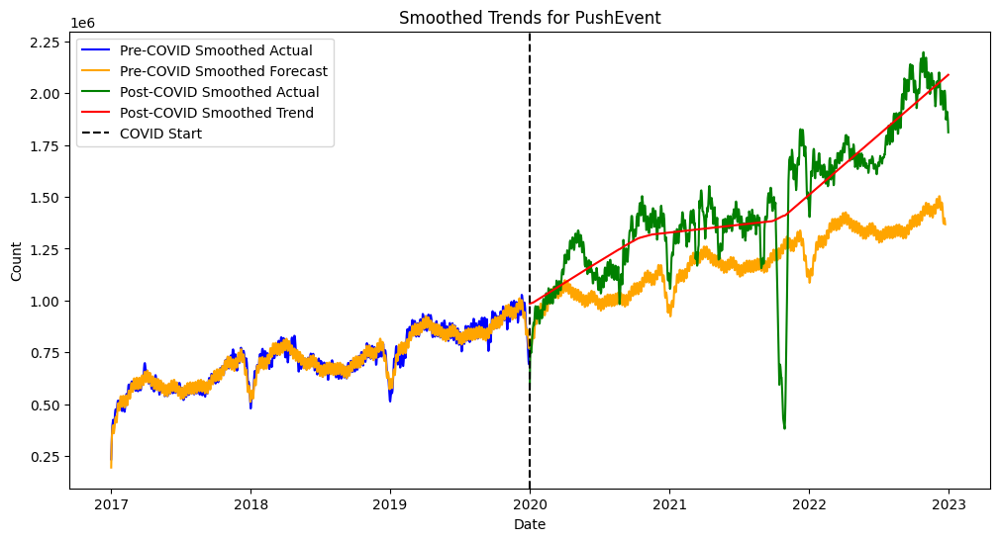

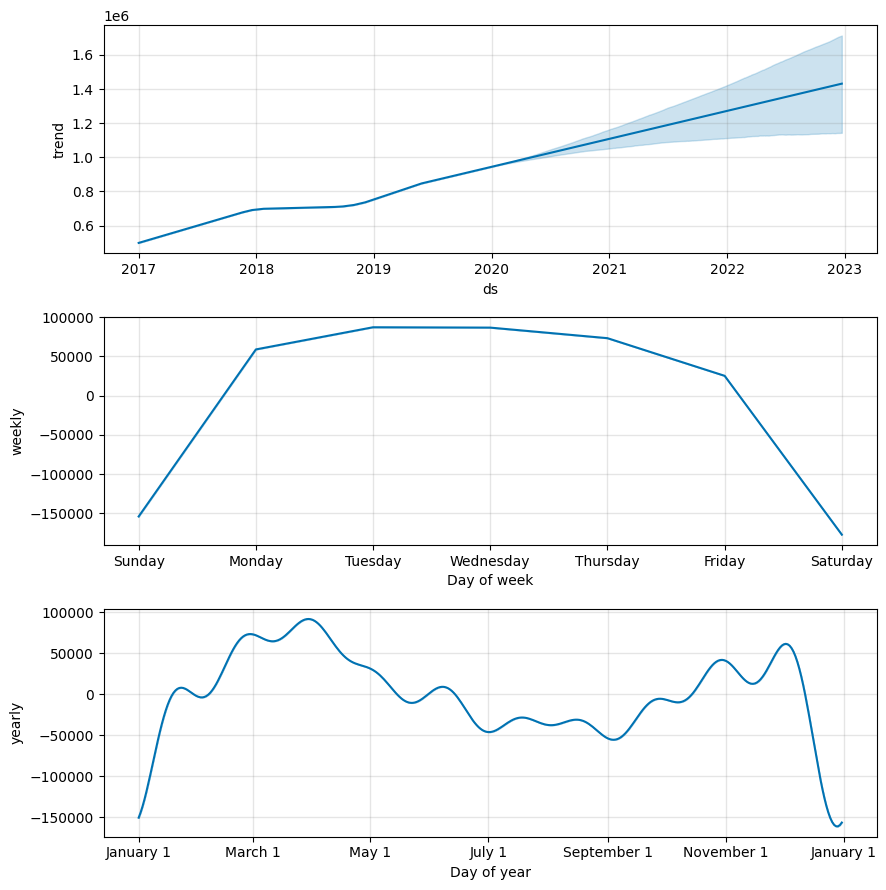

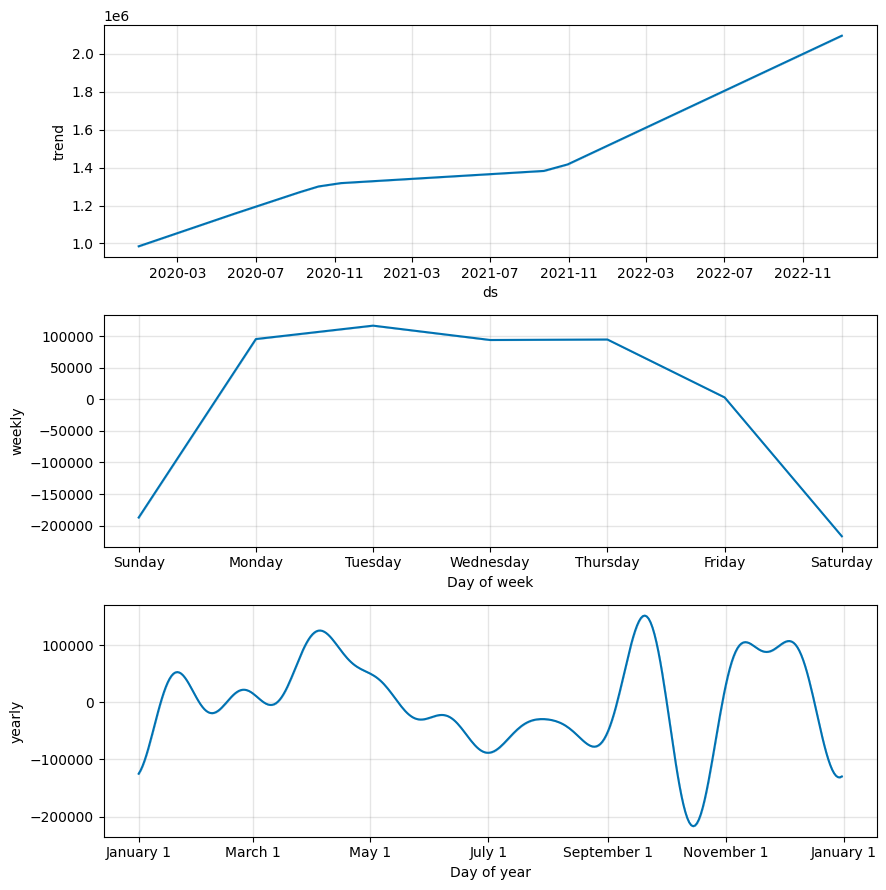

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/6pdebddi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/a7tdaw4d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94008', 'data', 'file=/tmp/tmpgydxhnxw/6pdebddi.json', 'init=/tmp/tmpgydxhnxw/a7tdaw4d.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_modelsrwthv8i/prophet_model-20250105074801.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:48:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:48:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

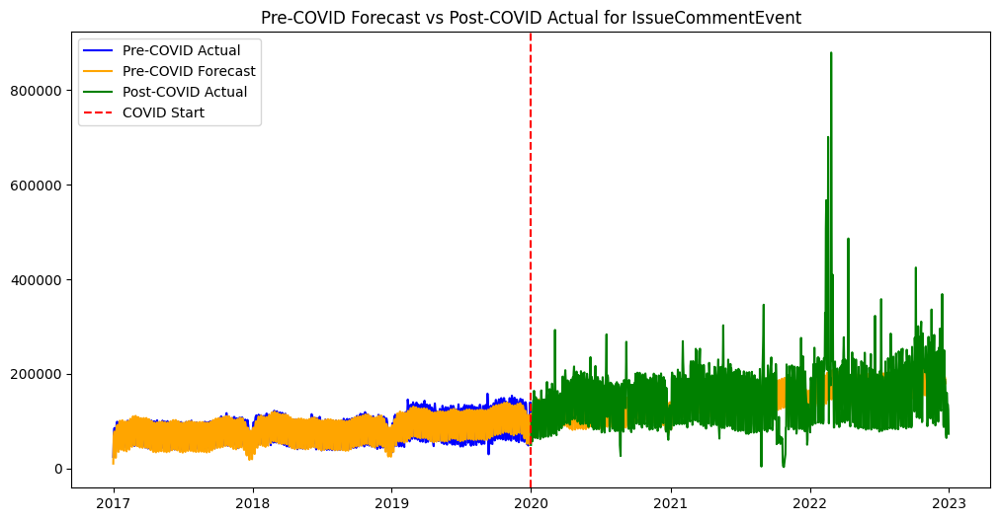

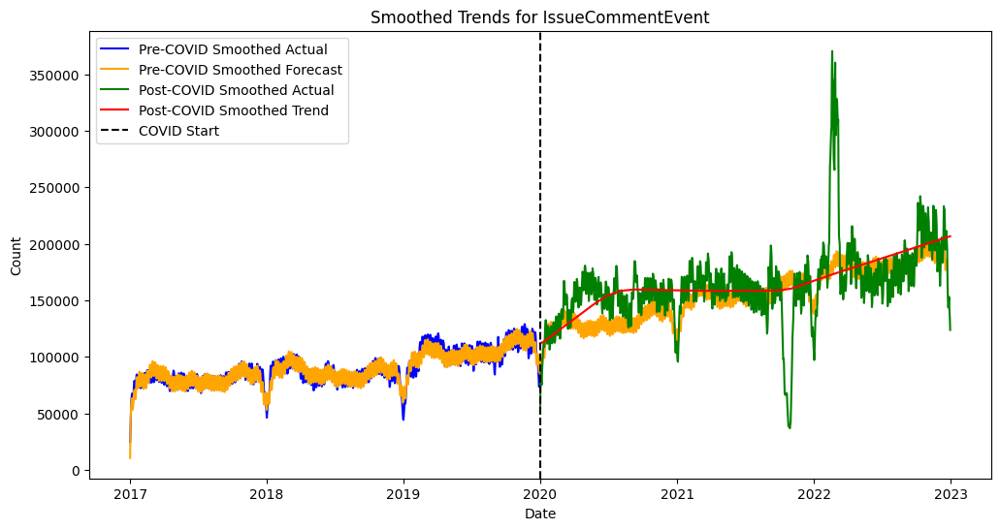

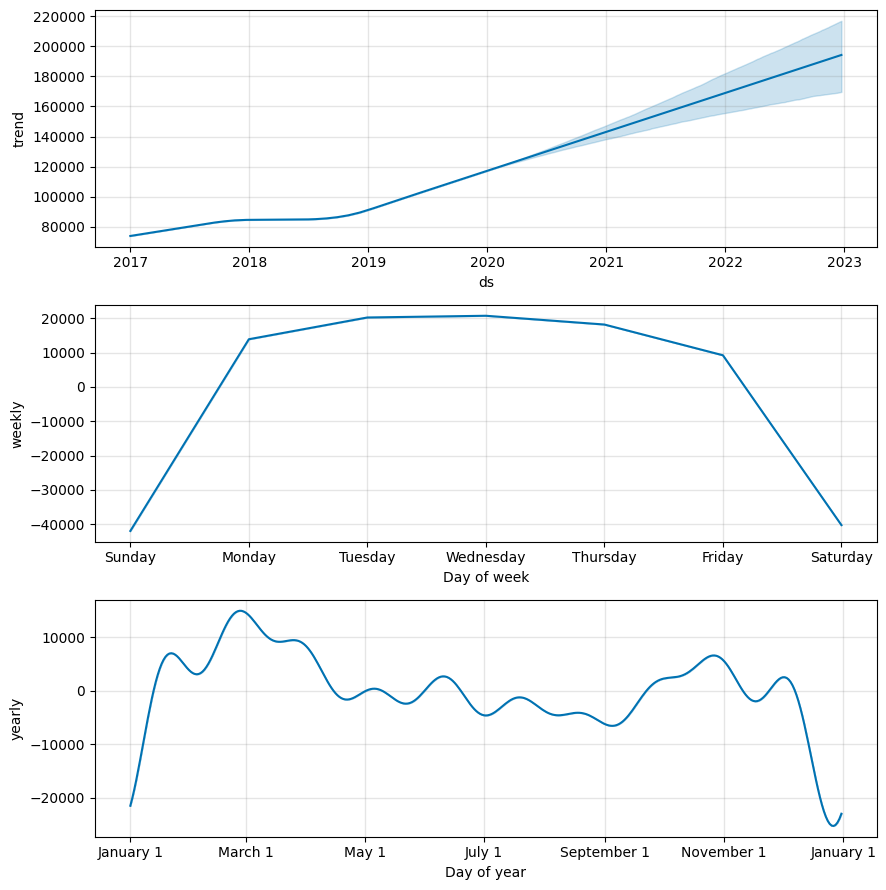

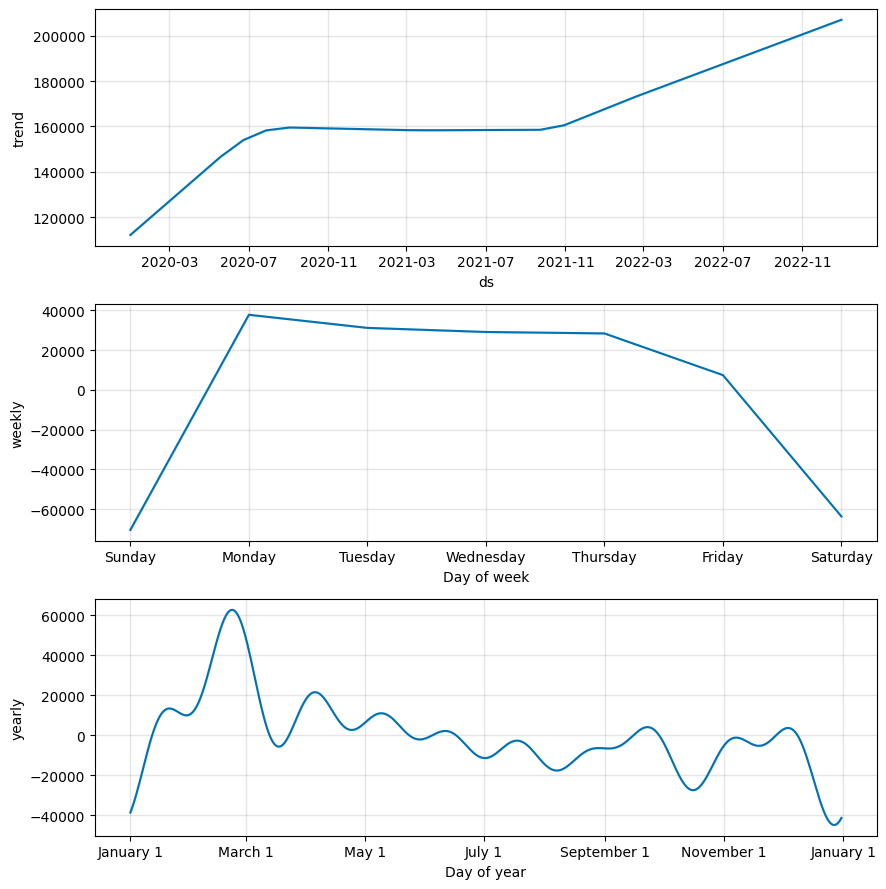

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/tqd3mzhr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/_g7pcohn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55151', 'data', 'file=/tmp/tmpgydxhnxw/tqd3mzhr.json', 'init=/tmp/tmpgydxhnxw/_g7pcohn.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_model071se_r3/prophet_model-20250105074805.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:48:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:48:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

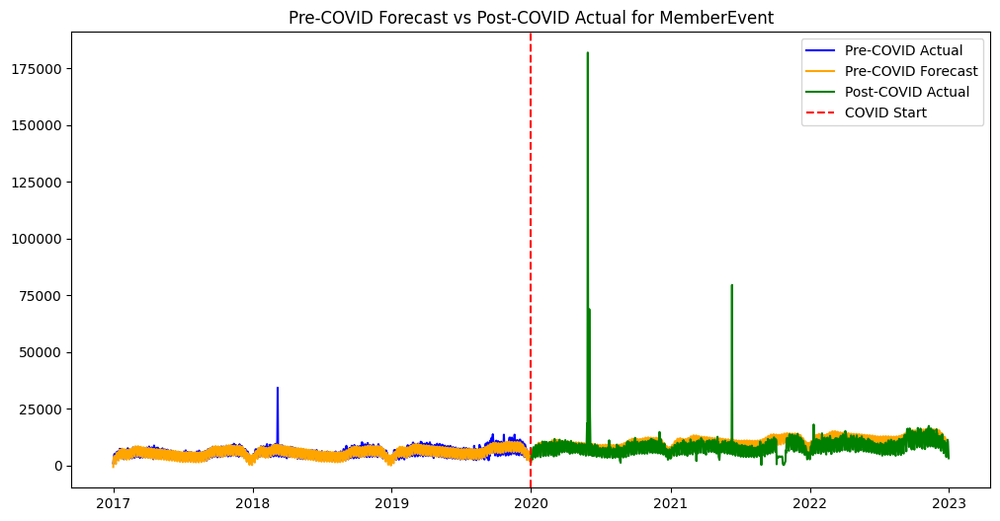

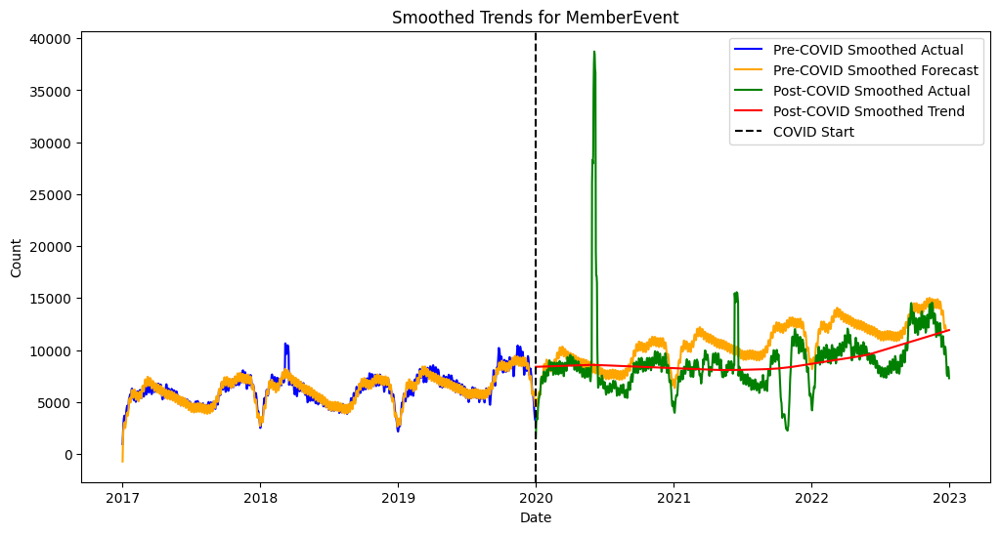

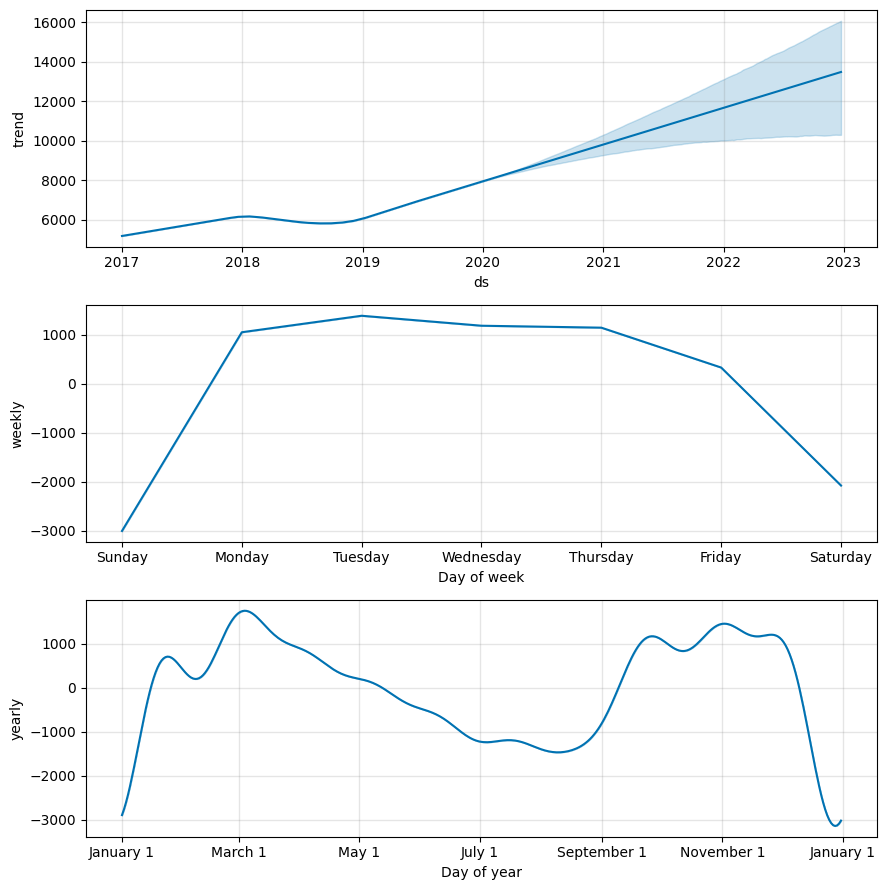

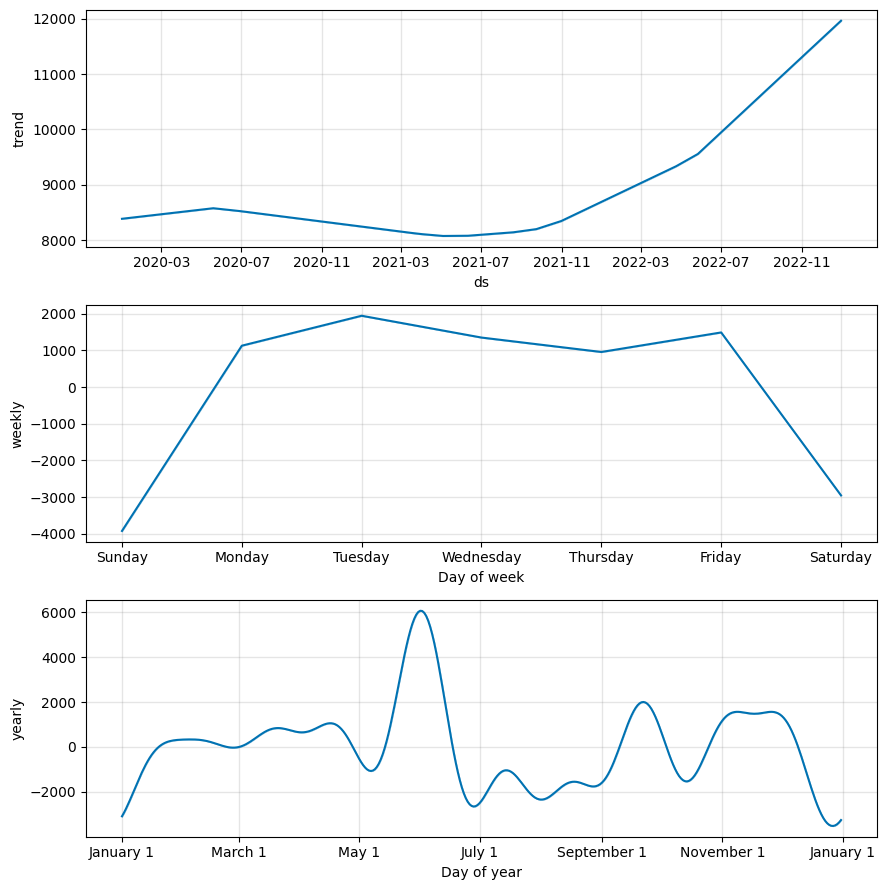

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/qvgho7ls.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/d_78oo3i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85898', 'data', 'file=/tmp/tmpgydxhnxw/qvgho7ls.json', 'init=/tmp/tmpgydxhnxw/d_78oo3i.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_modela8sb30us/prophet_model-20250105074811.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:48:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:48:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

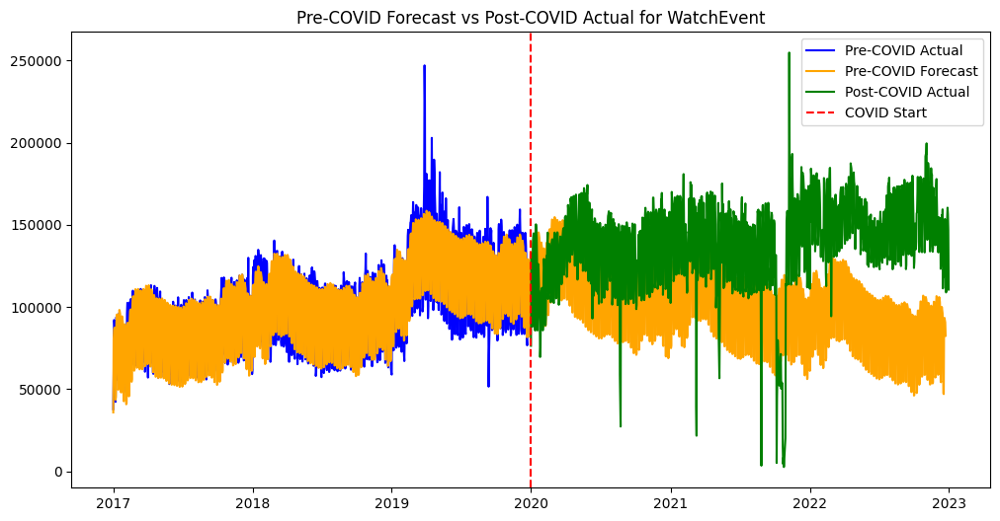

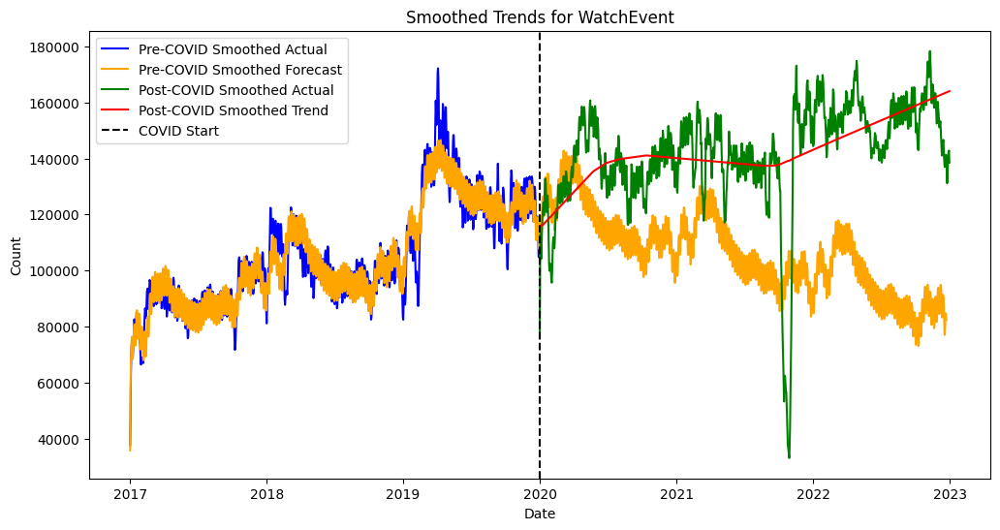

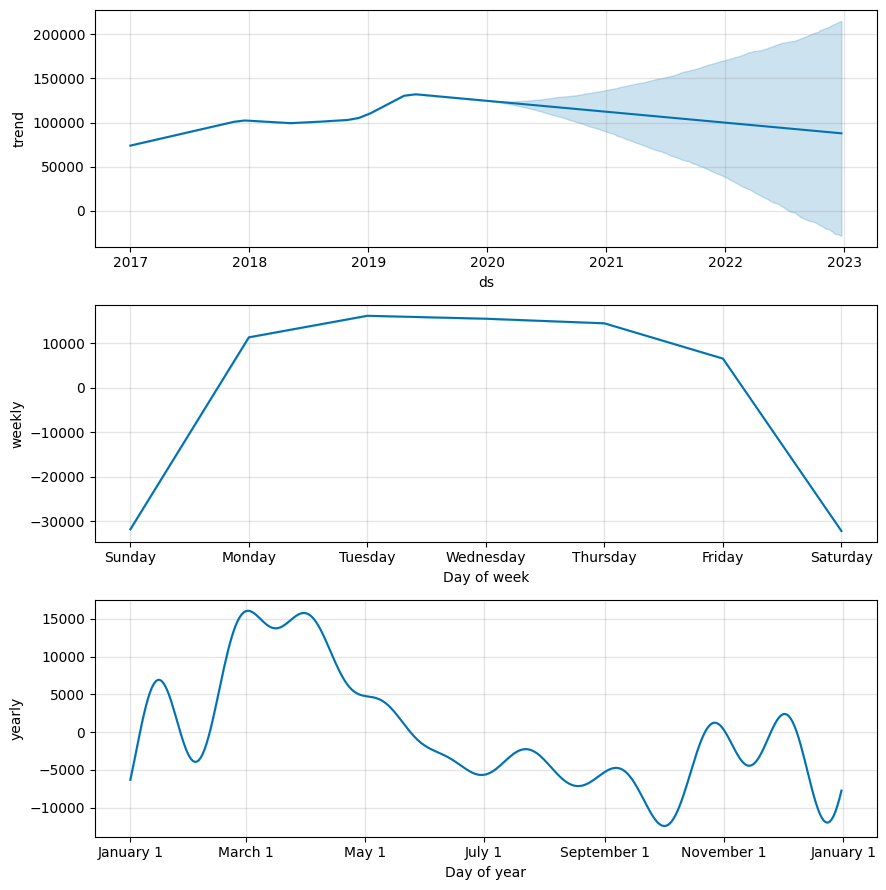

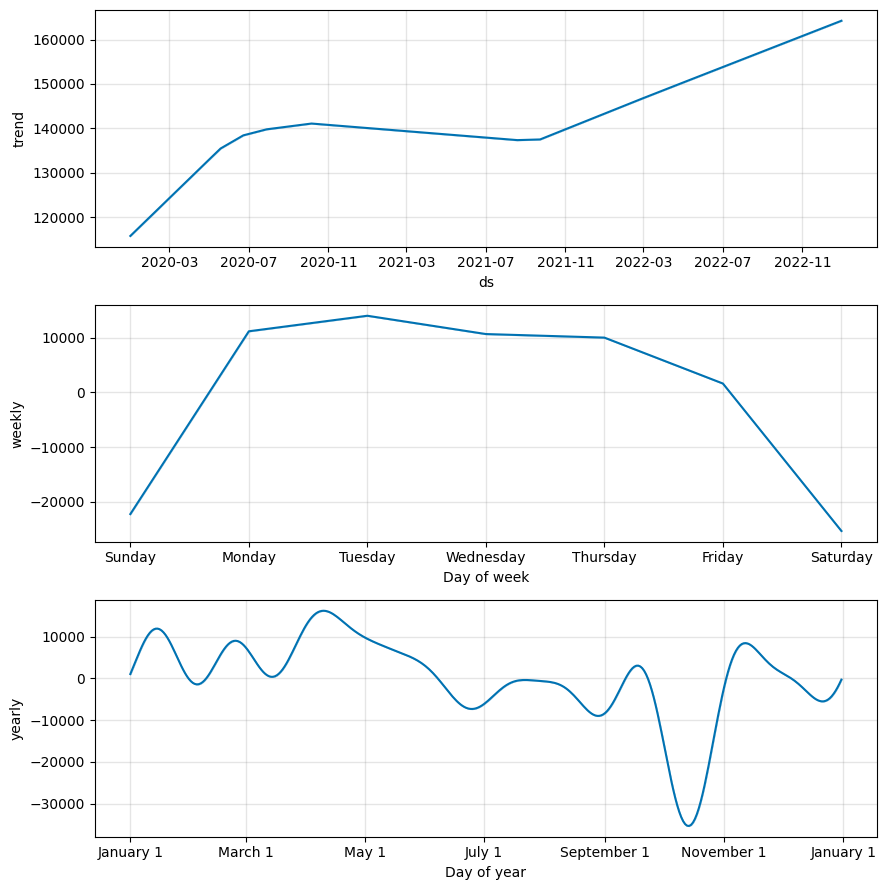

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/iw6px0a_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/_v9i2xy_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63383', 'data', 'file=/tmp/tmpgydxhnxw/iw6px0a_.json', 'init=/tmp/tmpgydxhnxw/_v9i2xy_.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_modelnfqwi25v/prophet_model-20250105074816.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:48:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:48:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

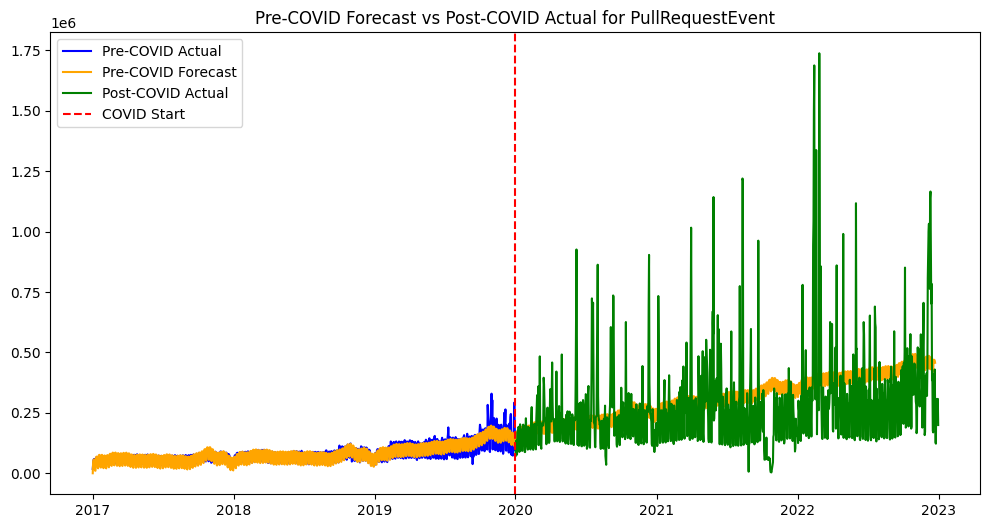

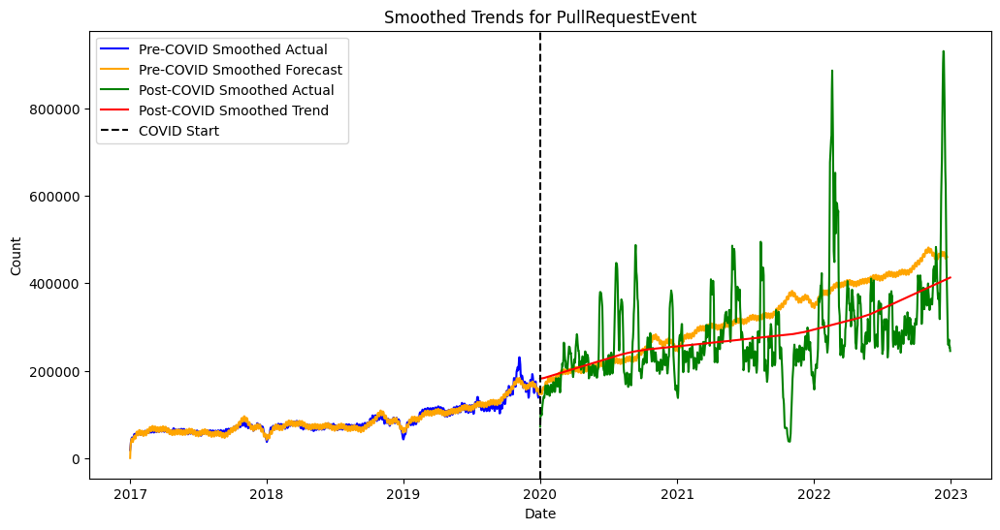

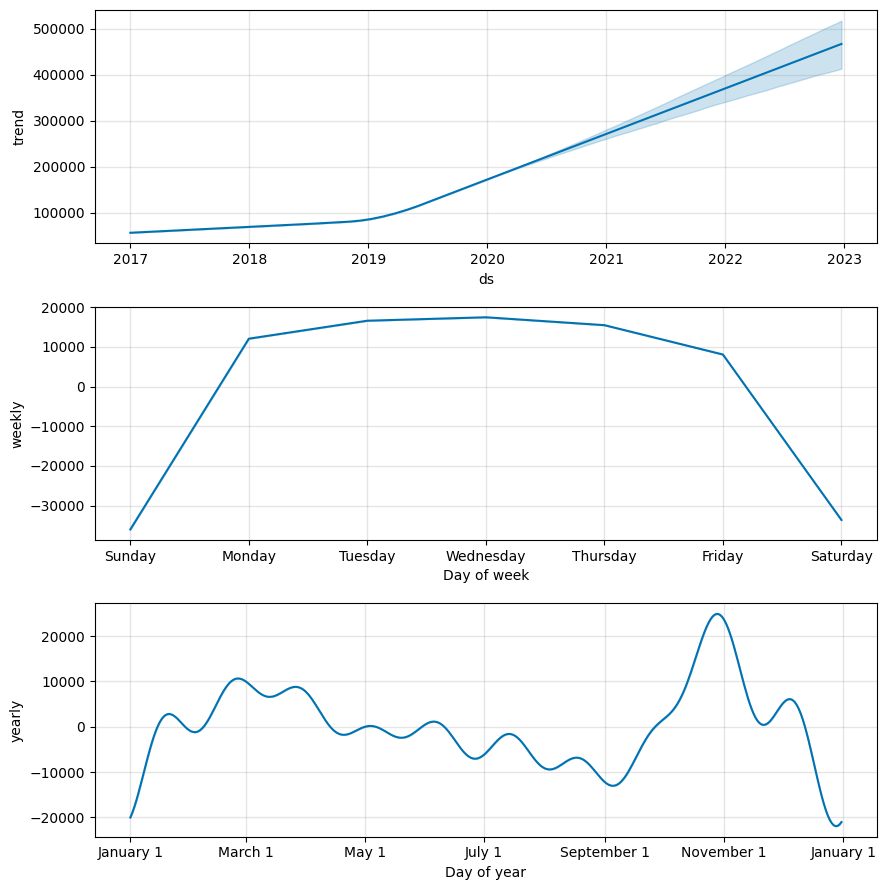

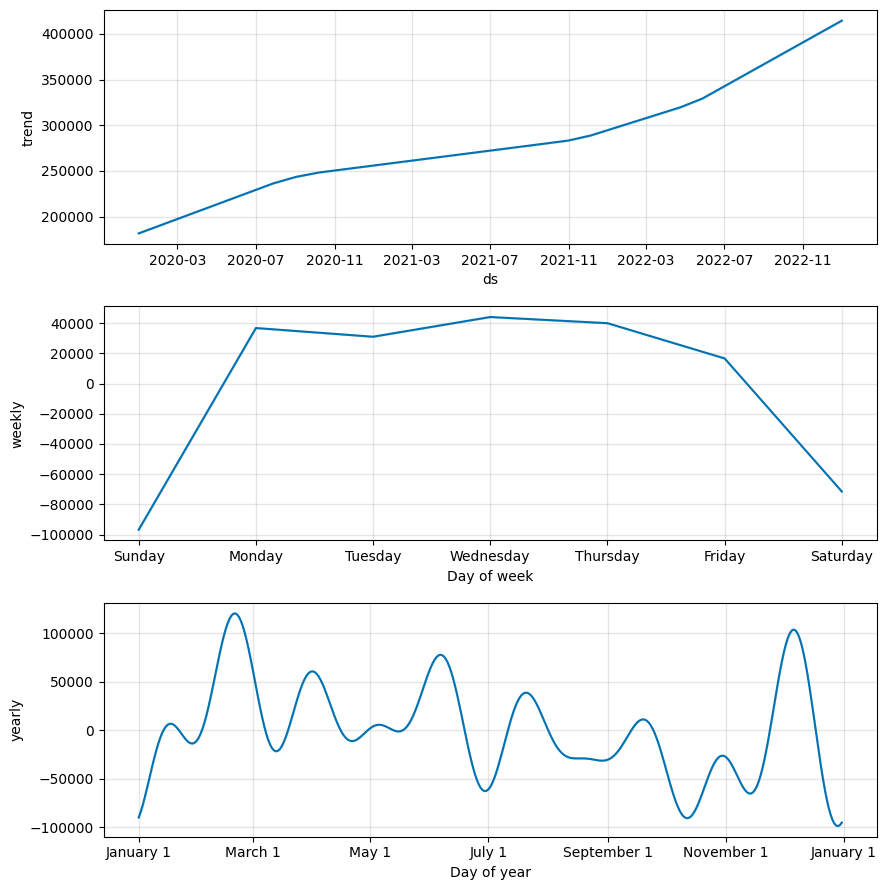

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/2zodo0a4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/pl_td3od.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1057', 'data', 'file=/tmp/tmpgydxhnxw/2zodo0a4.json', 'init=/tmp/tmpgydxhnxw/pl_td3od.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_modelm827yj9z/prophet_model-20250105074820.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:48:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:48:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgyd

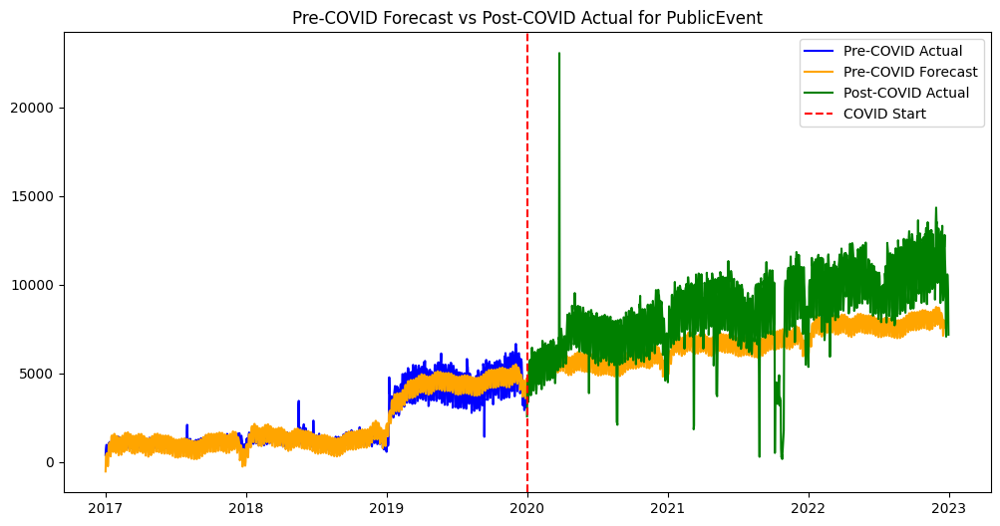

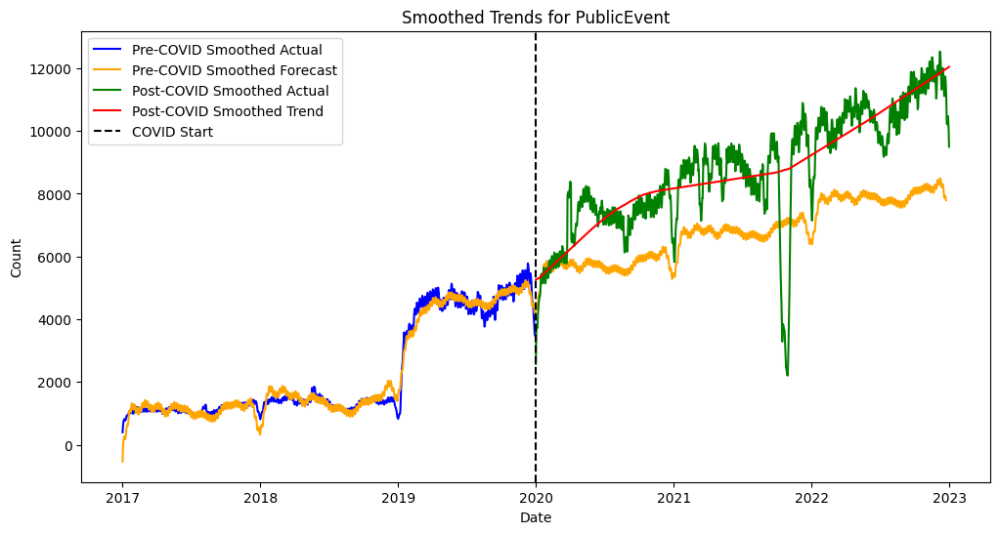

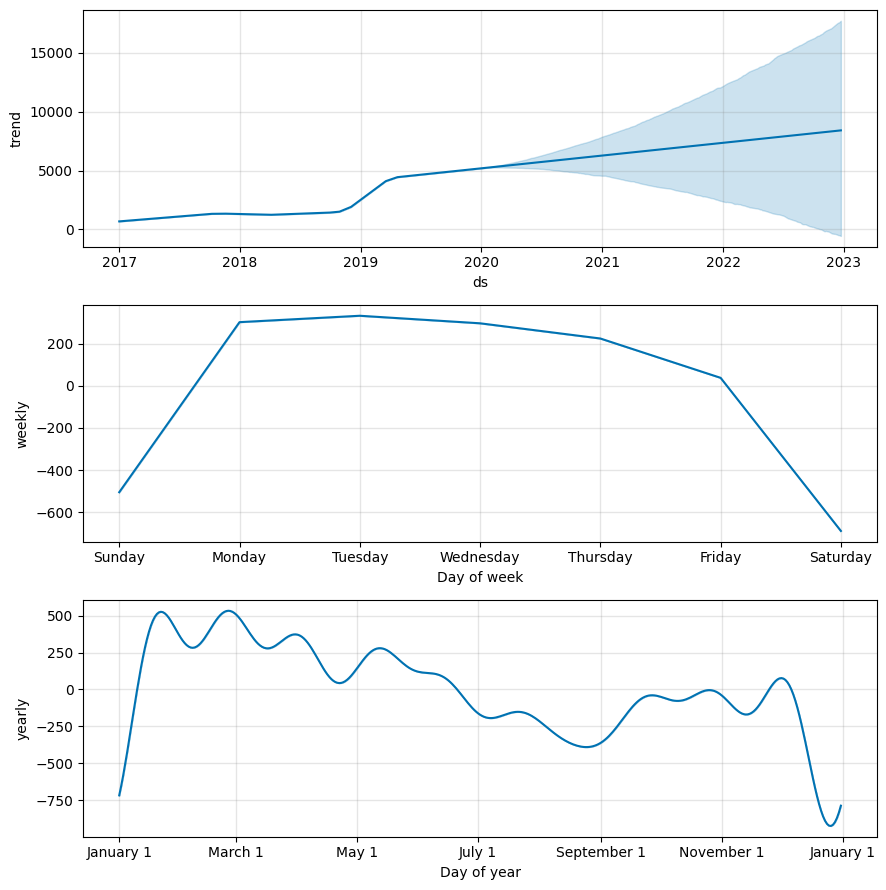

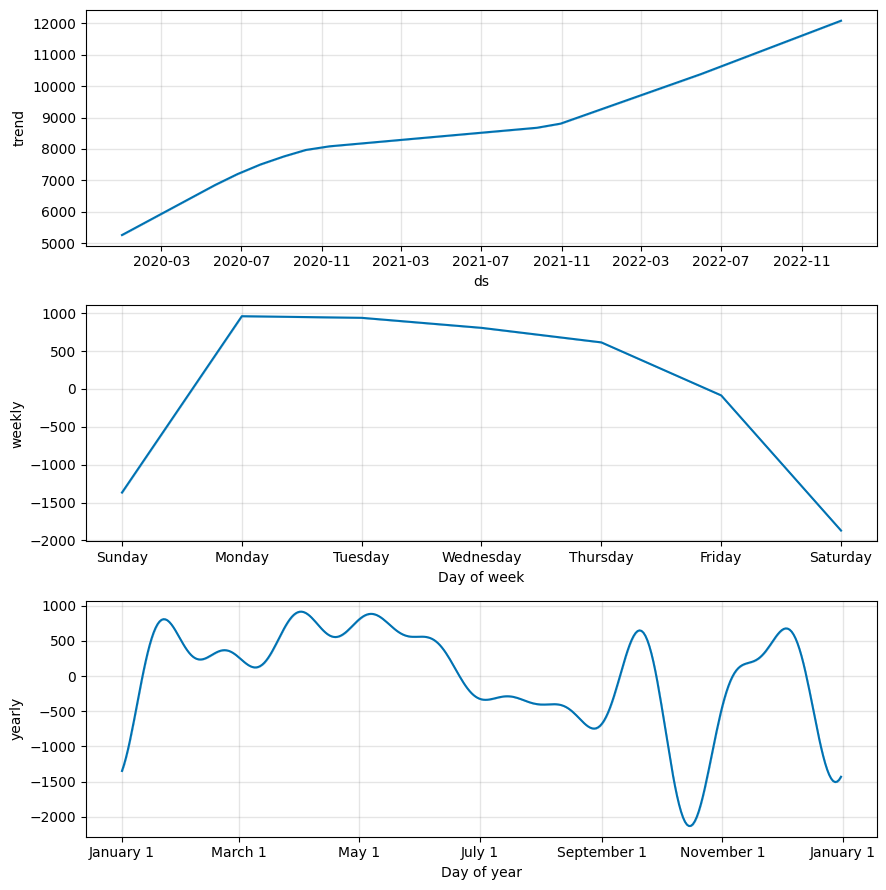

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/3vhoelvm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/0z12evpl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62210', 'data', 'file=/tmp/tmpgydxhnxw/3vhoelvm.json', 'init=/tmp/tmpgydxhnxw/0z12evpl.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_modelagvwa_hl/prophet_model-20250105074826.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:48:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:48:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

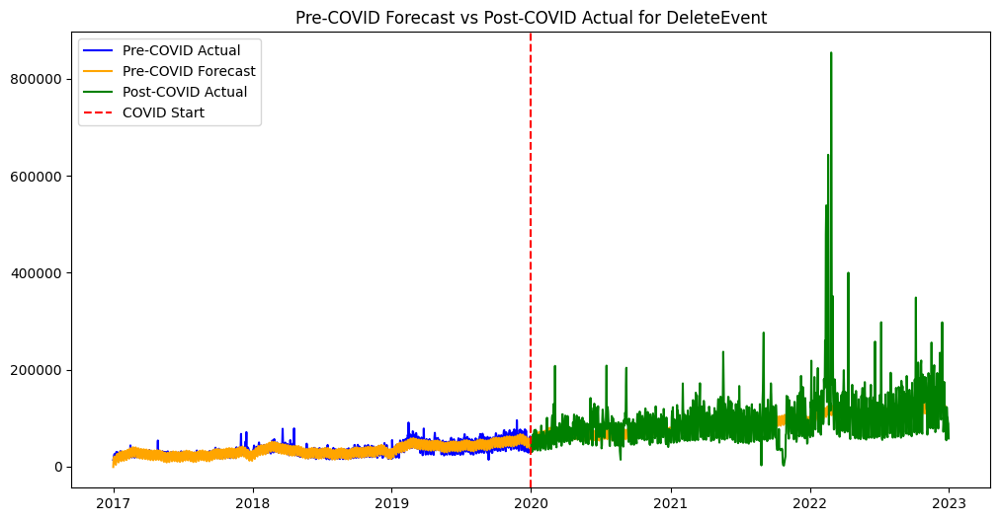

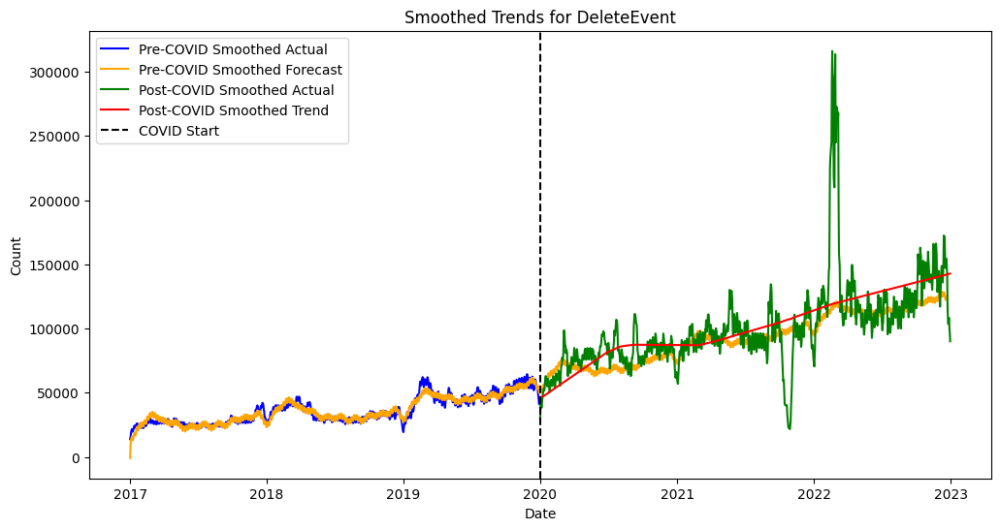

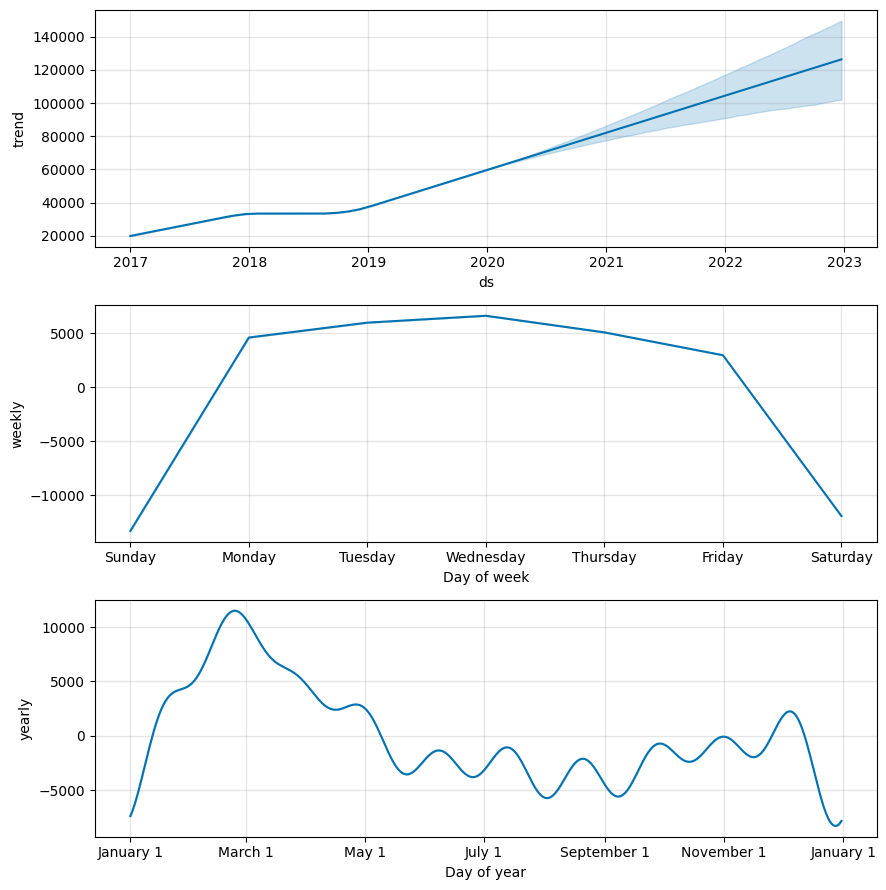

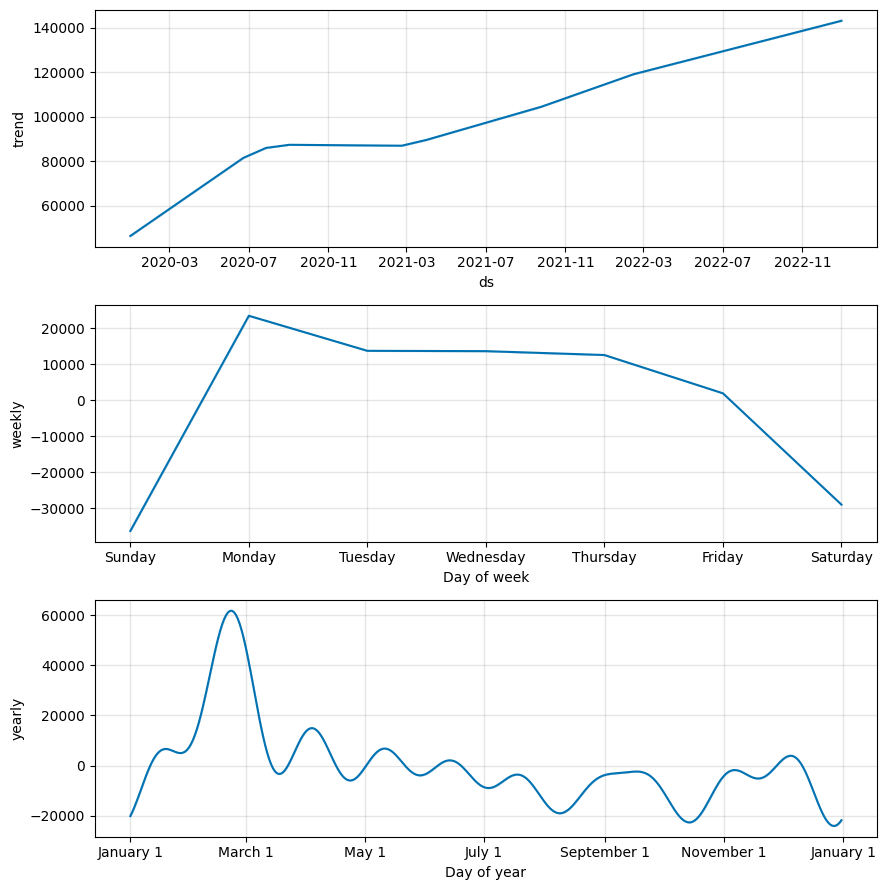

In [13]:
mw_results = {
    'Event': [],
    'Pre-COVID Median Trend': [],
    'Post-COVID Median Trend': [],
    'Post-COVID Median Forecast (Pre Model)': [],
    'Relative Change (Post Trend vs Post Forecast)': [],
    'U Statistic (Post Trend vs Post Forecast)': [],
    'P-Value (Post Trend vs Post Forecast)': [],
    'Conclusion (Post Trend vs Post Forecast)': [],
    'Relative Change (Trend)': [],
    'U Statistic (Trend)': [],
    'P-Value (Trend)': [],
    'Conclusion (Trend)': [],
}

day_results = {
    'Event': [],
    'Day of Week': [],
    'Pre-COVID Average Traffic': [],
    'Post-COVID Average Traffic': [],
    'Relative Change': [],
    'P-Value': [],
    'Conclusion': []
}
df['day_of_week'] = df['date'].dt.day_name()

# Loop over each event type
event_types = df['type'].unique()

for event_type in event_types:
    # Filter data for the current event type
    df_event = df[df['type'] == event_type]

    # Aggregate by date
    df_daily = df_event.groupby(['date', 'day_of_week']).agg({'cnt': 'sum'}).reset_index()

    # Split data into pre- and post-COVID
    pre_covid = df_daily[df_daily['date'] < covid_start]
    post_covid = df_daily[df_daily['date'] >= covid_start]

    # Prepare data for Prophet
    pre_covid = pre_covid.rename(columns={'date': 'ds', 'cnt': 'y'})
    post_covid = post_covid.rename(columns={'date': 'ds', 'cnt': 'y'})

    # Skip if there is insufficient data
    if len(pre_covid) < 2 or len(post_covid) < 2:
        print(f"Not enough data for event type: {event_type}")
        continue

    # Train Prophet on pre-COVID data
    model_pre = Prophet()
    model_pre.fit(pre_covid)

    # Forecast using pre-COVID model
    future_pre = model_pre.make_future_dataframe(periods=len(post_covid), freq='D')
    forecast_pre = model_pre.predict(future_pre)

    # Train Prophet on post-COVID data
    model_post = Prophet()
    model_post.fit(post_covid)

    # Extract trends for the observed post-COVID period
    forecast_post = model_post.predict(post_covid[['ds']])

    # Visualize pre-COVID forecast vs actual post-COVID
    plt.figure(figsize=(12, 6))
    plt.plot(pre_covid['ds'], pre_covid['y'], label='Pre-COVID Actual', color='blue')
    plt.plot(forecast_pre['ds'], forecast_pre['yhat'], label='Pre-COVID Forecast', color='orange')
    plt.plot(post_covid['ds'], post_covid['y'], label='Post-COVID Actual', color='green')
    plt.axvline(x=covid_start, color='red', linestyle='--', label='COVID Start')
    plt.legend()
    plt.title(f'Pre-COVID Forecast vs Post-COVID Actual for {event_type}')
    plt.show()

    # Smooth the data
    pre_covid['y_smoothed'] = pre_covid['y'].rolling(window=10, min_periods=1).mean()
    post_covid['y_smoothed'] = post_covid['y'].rolling(window=10, min_periods=1).mean()
    forecast_pre['yhat_smoothed'] = forecast_pre['yhat'].rolling(window=10, min_periods=1).mean()
    forecast_post['trend_smoothed'] = forecast_post['trend'].rolling(window=10, min_periods=1).mean()

    # Visualize smoothed data
    plt.figure(figsize=(12, 6))
    plt.plot(pre_covid['ds'], pre_covid['y_smoothed'], label='Pre-COVID Smoothed Actual', color='blue')
    plt.plot(forecast_pre['ds'], forecast_pre['yhat_smoothed'], label='Pre-COVID Smoothed Forecast', color='orange')
    plt.plot(post_covid['ds'], post_covid['y_smoothed'], label='Post-COVID Smoothed Actual', color='green')
    plt.plot(forecast_post['ds'], forecast_post['trend_smoothed'], label='Post-COVID Smoothed Trend', color='red')
    plt.axvline(x=covid_start, color='black', linestyle='--', label='COVID Start')
    plt.legend()
    plt.title(f'Smoothed Trends for {event_type}')
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.show()

    # Test 1: Compare forecasted trends before and after COVID
    u_stat_1, p_val_1 = mannwhitneyu(forecast_pre['trend'], forecast_post['trend'])

    # Calculate medians and relative change for forecasted trends
    pre_median_trend = forecast_pre['trend'].median()
    post_median_trend = forecast_post['trend'].median()
    relative_change_trend = (post_median_trend - pre_median_trend) / pre_median_trend if pre_median_trend != 0 else None

    # Add results to the dictionary for Test 1
    mw_results['Event'].append(event_type)
    mw_results['Post-COVID Median Forecast (Pre Model)'].append(round(pre_median_trend, 2))
    mw_results['Post-COVID Median Trend'].append(round(post_median_trend, 2))
    mw_results['Relative Change (Post Trend vs Post Forecast)'].append(round(relative_change_trend, 2) if relative_change_trend is not None else None)
    mw_results['U Statistic (Post Trend vs Post Forecast)'].append(round(u_stat_1, 2))
    mw_results['P-Value (Post Trend vs Post Forecast)'].append(round(p_val_1, 4))
    mw_results['Conclusion (Post Trend vs Post Forecast)'].append('Significant' if p_val_1 < 0.05 else 'Not Significant')

    # Plot components
    pre_components_fig = model_pre.plot_components(forecast_pre)
    plt.show()
    post_components_fig = model_post.plot_components(forecast_post)
    plt.show()

    # Test 2: Compare Pre-COVID Trend (Pre Data) with Forecasted Post-COVID Trend (Post Model)
    trend_pre_on_pre = model_pre.predict(pre_covid[['ds']])  # Trend of pre-COVID data using pre-COVID model

    u_stat_2, p_val_2 = mannwhitneyu(trend_pre_on_pre['trend'], forecast_post['trend'])

    # Calculate medians and relative change for Test 2
    pre_median_trend_pre_data = trend_pre_on_pre['trend'].median()
    relative_change_pre_vs_forecast = (
        (post_median_trend - pre_median_trend_pre_data) / pre_median_trend_pre_data
        if pre_median_trend_pre_data != 0 else None
    )

    # Add results to the dictionary for Test 2
    mw_results['Pre-COVID Median Trend'].append(round(pre_median_trend_pre_data, 2))
    mw_results['Relative Change (Trend)'].append(
        round(relative_change_pre_vs_forecast, 2) if relative_change_pre_vs_forecast is not None else None
    )
    mw_results['U Statistic (Trend)'].append(round(u_stat_2, 2))
    mw_results['P-Value (Trend)'].append(round(p_val_2, 4))
    mw_results['Conclusion (Trend)'].append('Significant' if p_val_2 < 0.05 else 'Not Significant')
    # Analyze traffic by day of the week
    for day in df['day_of_week'].unique():
        pre_day = pre_covid[pre_covid['day_of_week'] == day]['y']
        post_day = post_covid[post_covid['day_of_week'] == day]['y']

        if pre_day.empty or post_day.empty:
            continue

        pre_avg = pre_day.mean()
        post_avg = post_day.mean()
        relative_change = (post_avg - pre_avg) / pre_avg if pre_avg != 0 else None
        _, p_val = mannwhitneyu(pre_day, post_day)

        day_results['Event'].append(event_type)
        day_results['Day of Week'].append(day)
        day_results['Pre-COVID Average Traffic'].append(round(pre_avg, 2))
        day_results['Post-COVID Average Traffic'].append(round(post_avg, 2))
        day_results['Relative Change'].append(f'{relative_change:.2f}x' if relative_change is not None else 'N/A')
        day_results['P-Value'].append(round(p_val, 2))
        day_results['Conclusion'].append('Significant' if p_val < 0.01 else 'Not Significant')

mw_results_df = pd.DataFrame(mw_results)
mw_results_df.to_csv('mann_whitney_u_results.csv', index=False)
day_results_df = pd.DataFrame(day_results)
day_results_df.to_csv('day_of_week_traffic_analysis.csv', index=False)

In [14]:
mw_results_df

,Event,Pre-COVID Median Trend,Post-COVID Median Trend,Post-COVID Median Forecast (Pre Model),Relative Change (Post Trend vs Post Forecast),U Statistic (Post Trend vs Post Forecast),P-Value (Post Trend vs Post Forecast),Conclusion (Post Trend vs Post Forecast),Relative Change (Trend),U Statistic (Trend),P-Value (Trend),Conclusion (Trend)
0,CommitCommentEvent,2491.84,11491.13,3581.30,2.21,128245.0,0.0,Significant,3.61,5568.0,0.0,Significant
1,PullRequestReviewCommentEvent,23247.21,46097.57,36959.41,0.25,731614.0,0.0,Significant,0.98,0.0,0.0,Significant
2,CreateEvent,181574.89,426497.33,294884.99,0.45,679719.0,0.0,Significant,1.35,0.0,0.0,Significant
3,GollumEvent,6912.46,7394.12,7147.77,0.03,1007717.0,0.0,Significant,0.07,442435.0,0.0,Significant
4,ReleaseEvent,5126.60,14813.21,7237.07,1.05,97232.0,0.0,Significant,1.89,187.0,0.0,Significant
5,ForkEvent,35094.02,51906.27,44775.46,0.16,32648.0,0.0,Significant,0.48,10749.0,0.0,Significant
6,IssuesEvent,44531.55,68070.15,54707.56,0.24,344121.0,0.0,Significant,0.53,0.0,0.0,Significant
7,PushEvent,705457.27,1365630.30,942229.85,0.45,247661.0,0.0,Significant,0.94,0.0,0.0,Significant
8,IssueCommentEvent,84917.32,159037.92,116923.33,0.36,466334.0,0.0,Significant,0.87,772.0,0.0,Significant
9,MemberEvent,6005.13,8478.17,7916.03,0.07,972912.0,0.0,Significant,0.41,0.0,0.0,Significant


In [15]:
day_results_df

,Event,Day of Week,Pre-COVID Average Traffic,Post-COVID Average Traffic,Relative Change,P-Value,Conclusion
0,CommitCommentEvent,Sunday,1760.44,11790.34,5.70x,0.0,Significant
1,CommitCommentEvent,Monday,2921.85,14408.32,3.93x,0.0,Significant
2,CommitCommentEvent,Tuesday,3021.48,14173.97,3.69x,0.0,Significant
3,CommitCommentEvent,Wednesday,2988.42,13929.42,3.66x,0.0,Significant
4,CommitCommentEvent,Thursday,2886.79,13984.44,3.84x,0.0,Significant
...,...,...,...,...,...,...,...
93,DeleteEvent,Tuesday,42416.38,115006.03,1.71x,0.0,Significant
94,DeleteEvent,Wednesday,42992.76,114490.06,1.66x,0.0,Significant
95,DeleteEvent,Thursday,41490.06,113530.46,1.74x,0.0,Significant
96,DeleteEvent,Friday,39411.07,102926.47,1.61x,0.0,Significant


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/abmvv1vs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgydxhnxw/9zp6ycjd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83365', 'data', 'file=/tmp/tmpgydxhnxw/abmvv1vs.json', 'init=/tmp/tmpgydxhnxw/9zp6ycjd.json', 'output', 'file=/tmp/tmpgydxhnxw/prophet_modelj8s8pr20/prophet_model-20250105074831.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:48:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:48:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgy

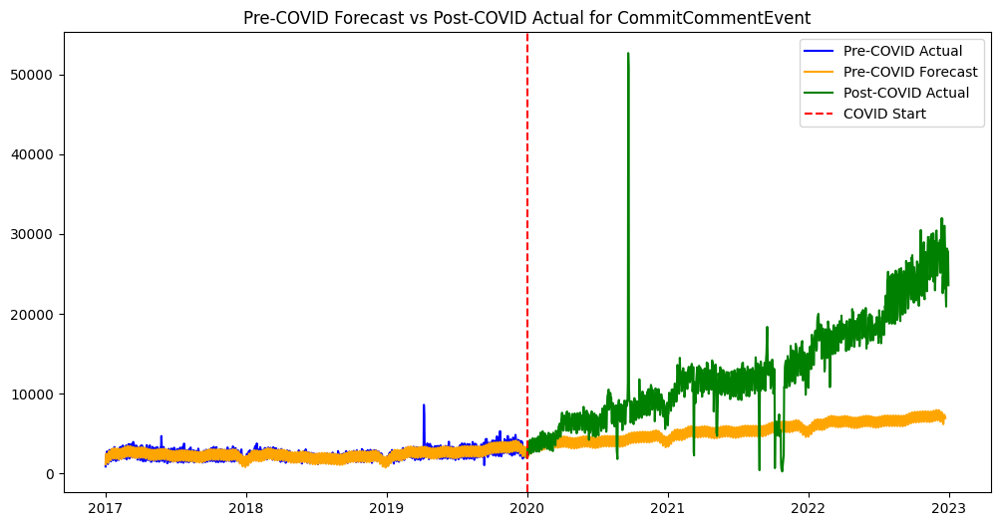

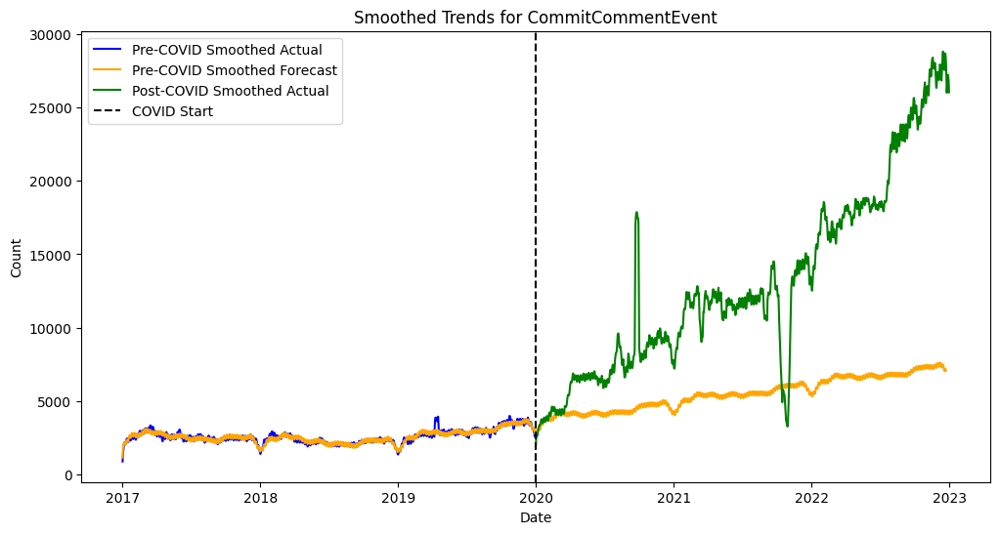

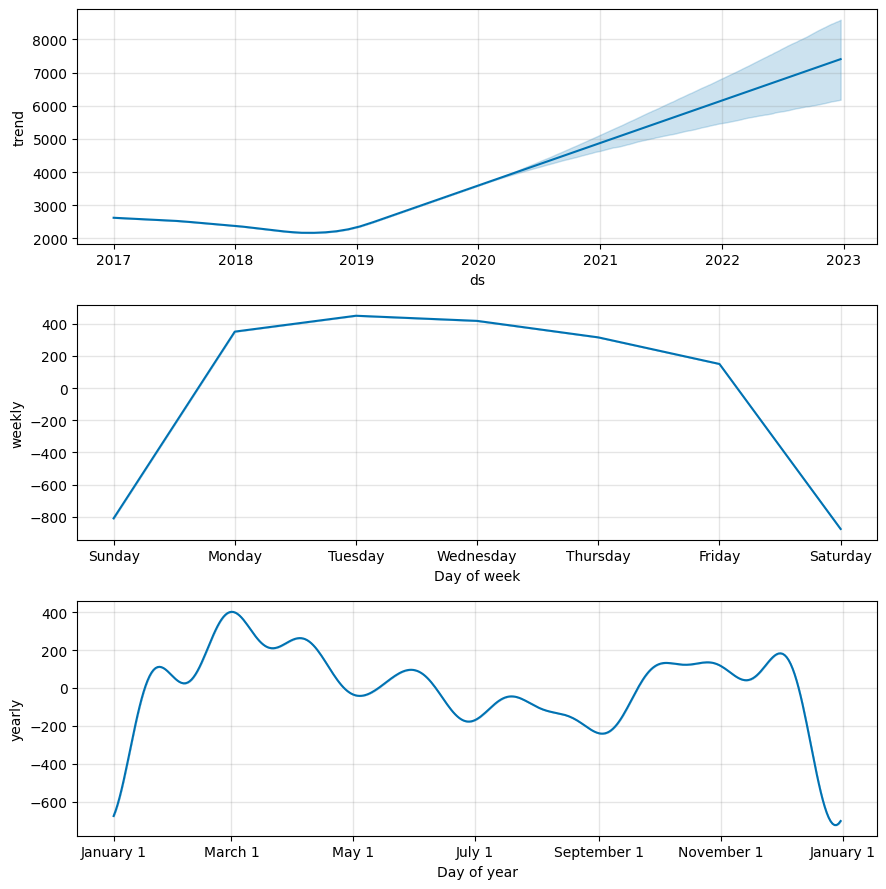

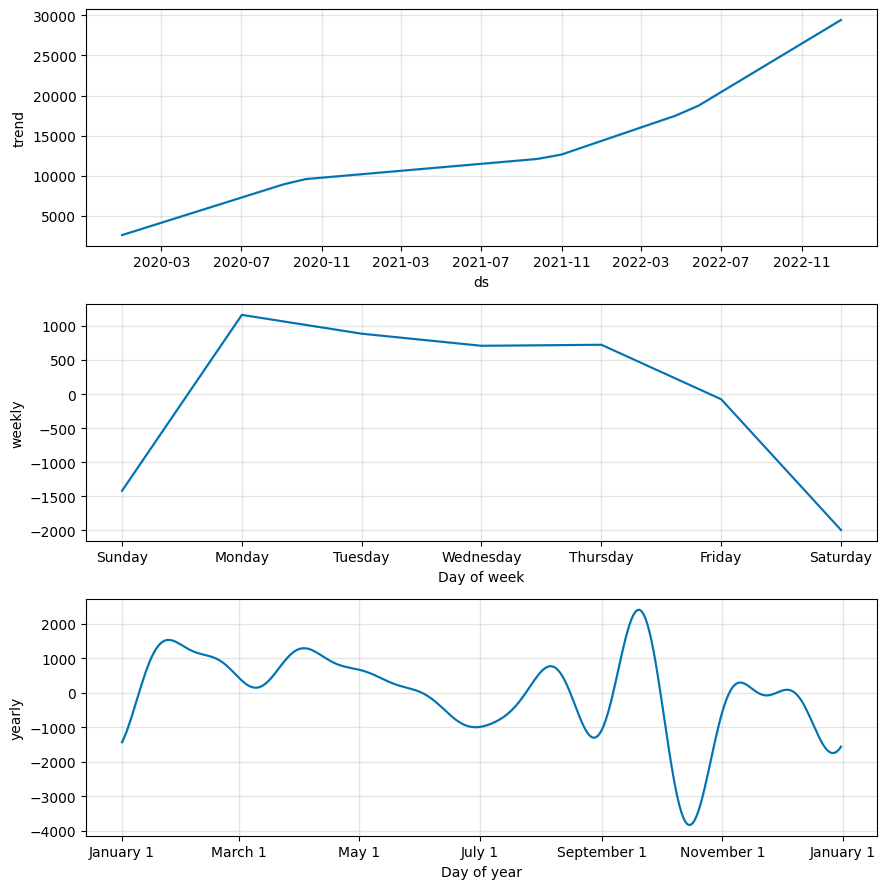

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient
INFO:prophet:Disabling daily seasonality. Run prophet with daily_se

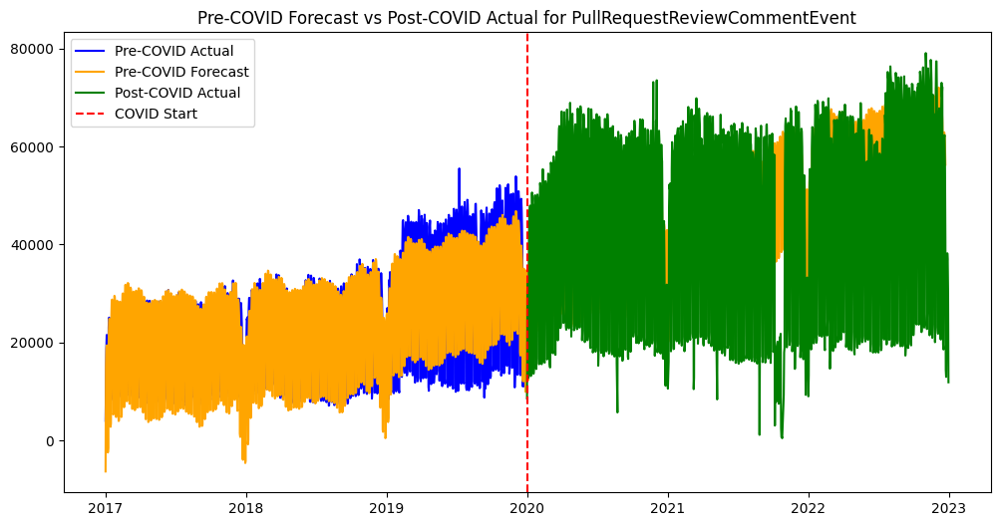

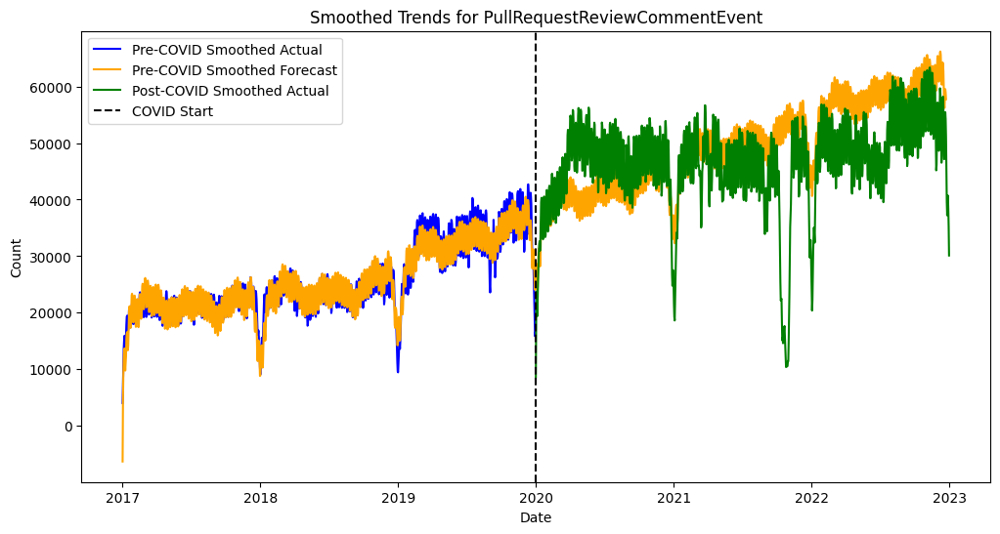

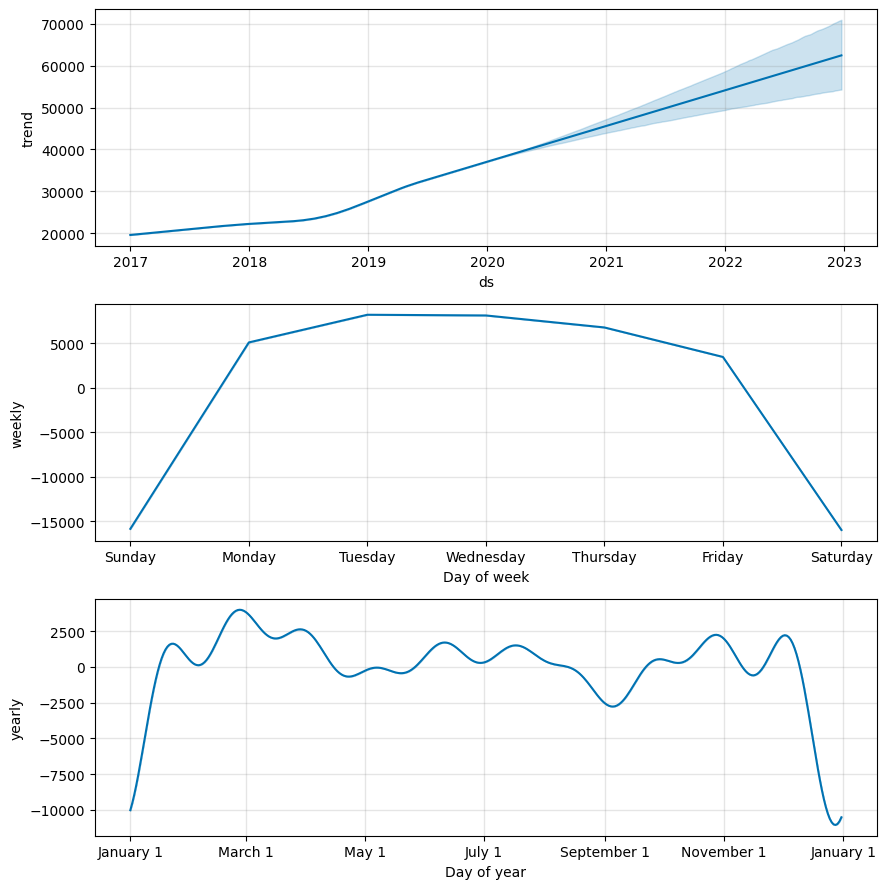

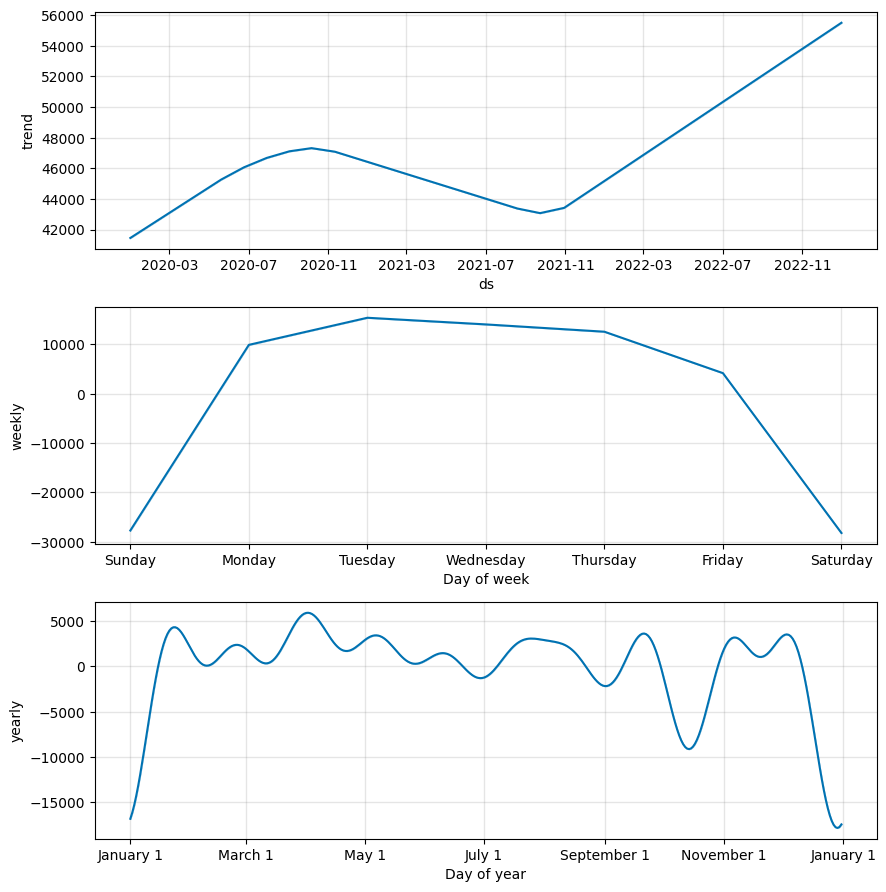

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient
INFO:prophet:Disabling daily seasonality. Run prophet with daily_se

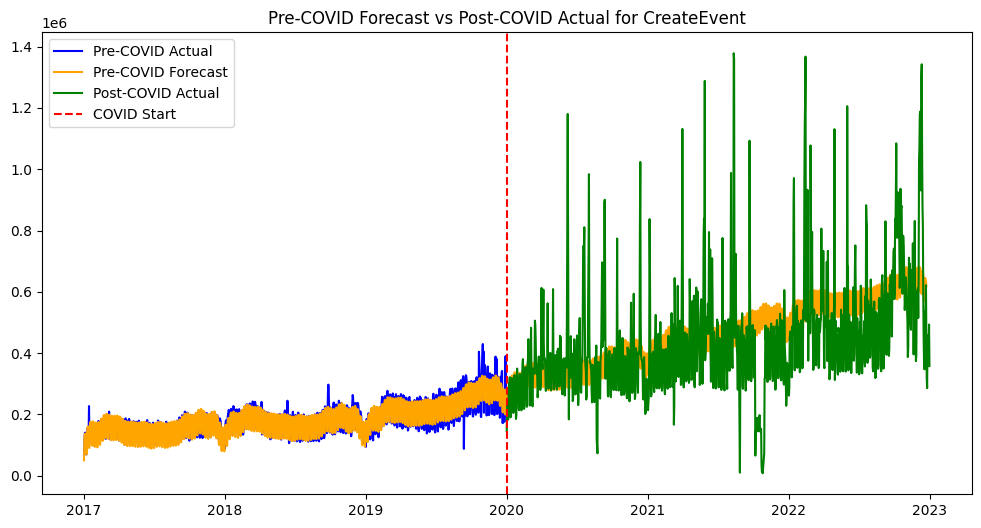

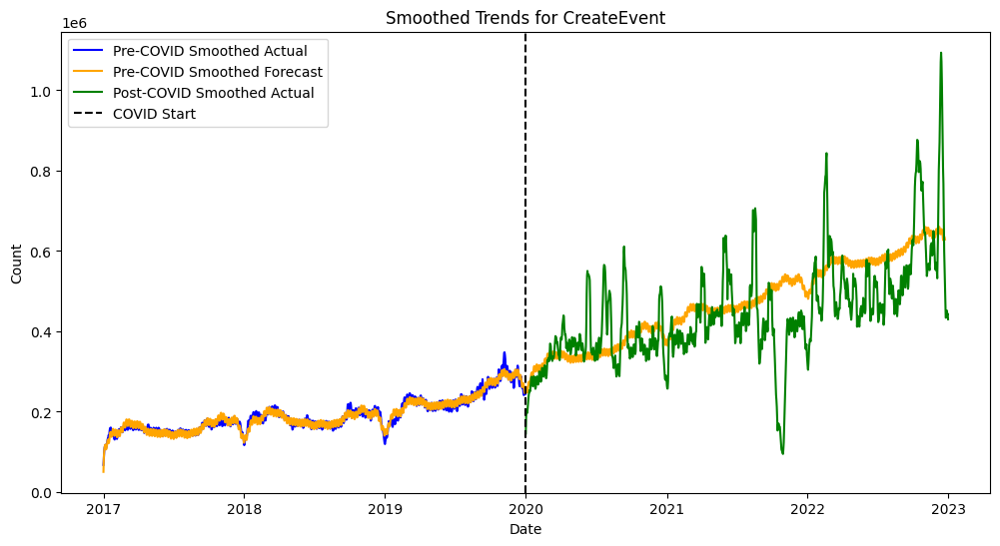

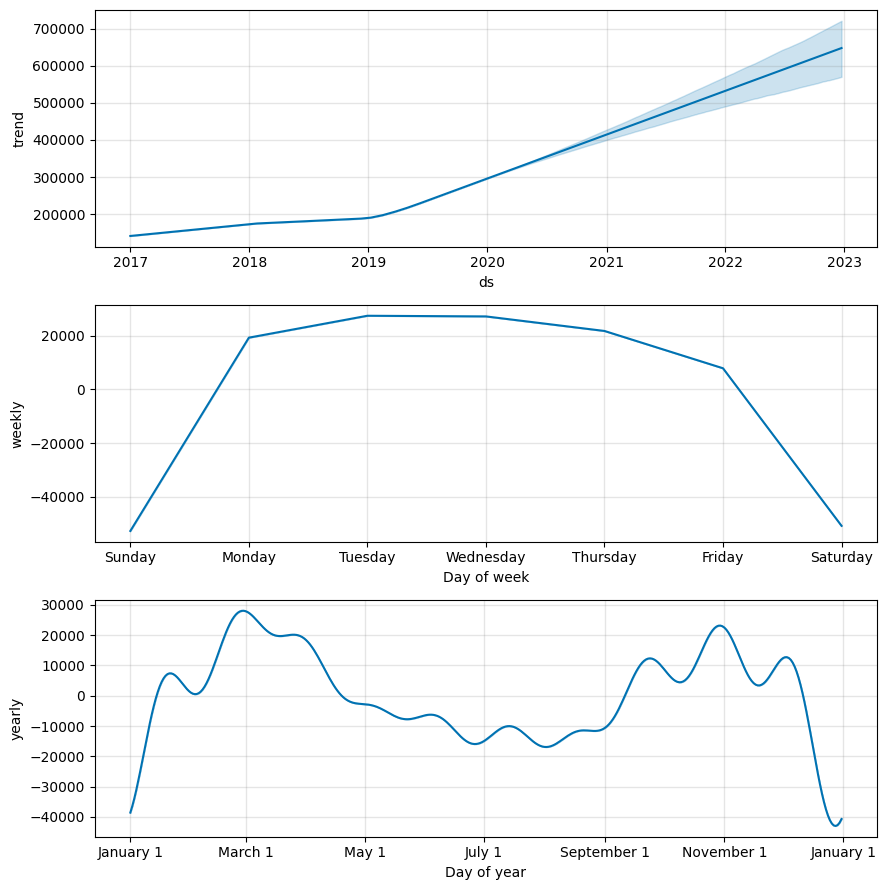

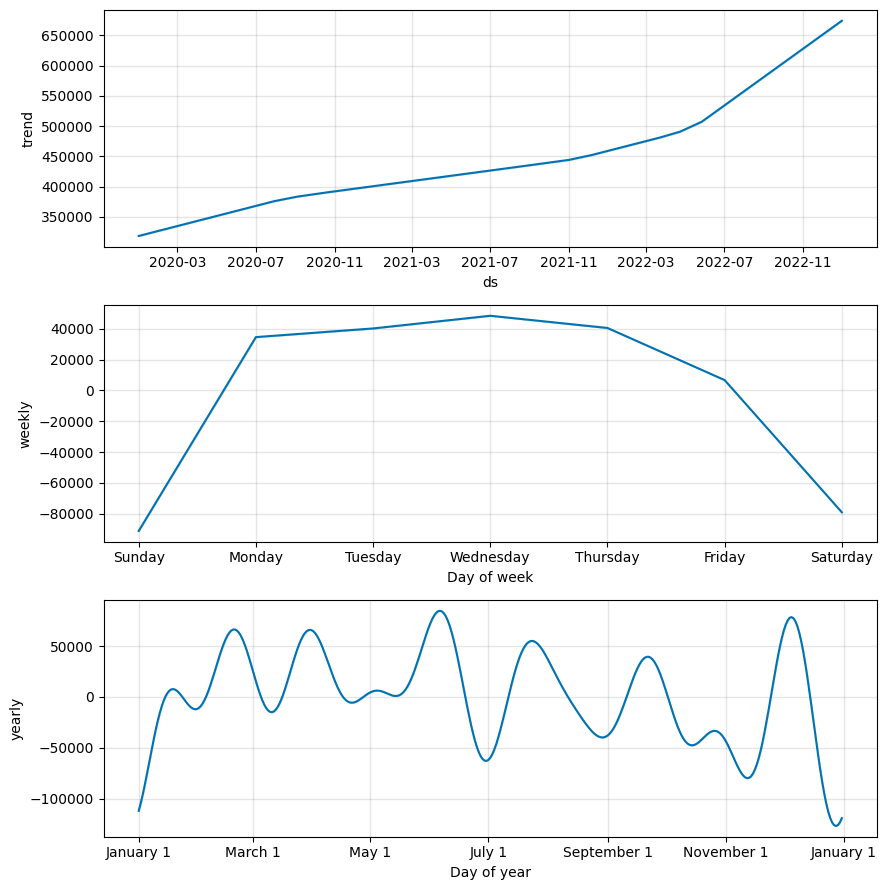

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient
INFO:prophet:Disabling daily seasonality. Run prophet with daily_se

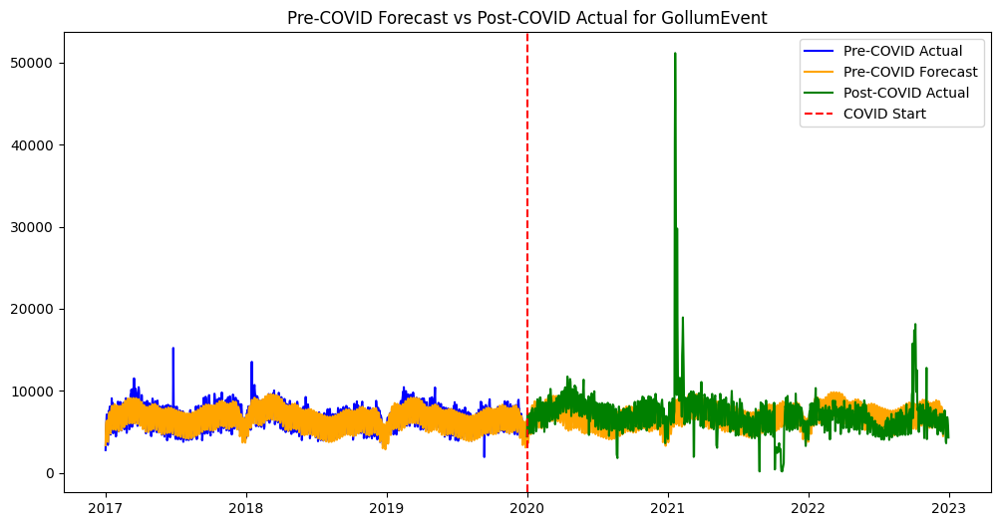

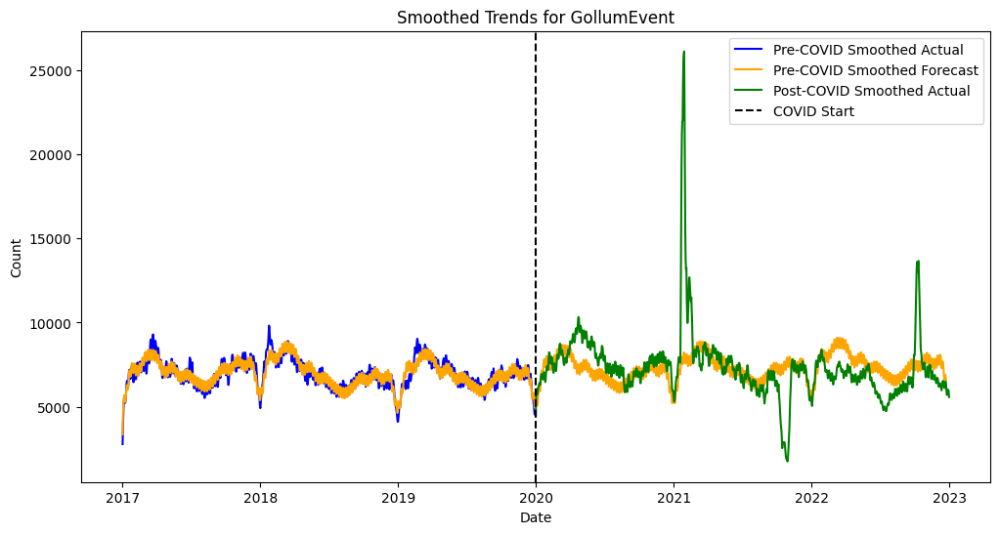

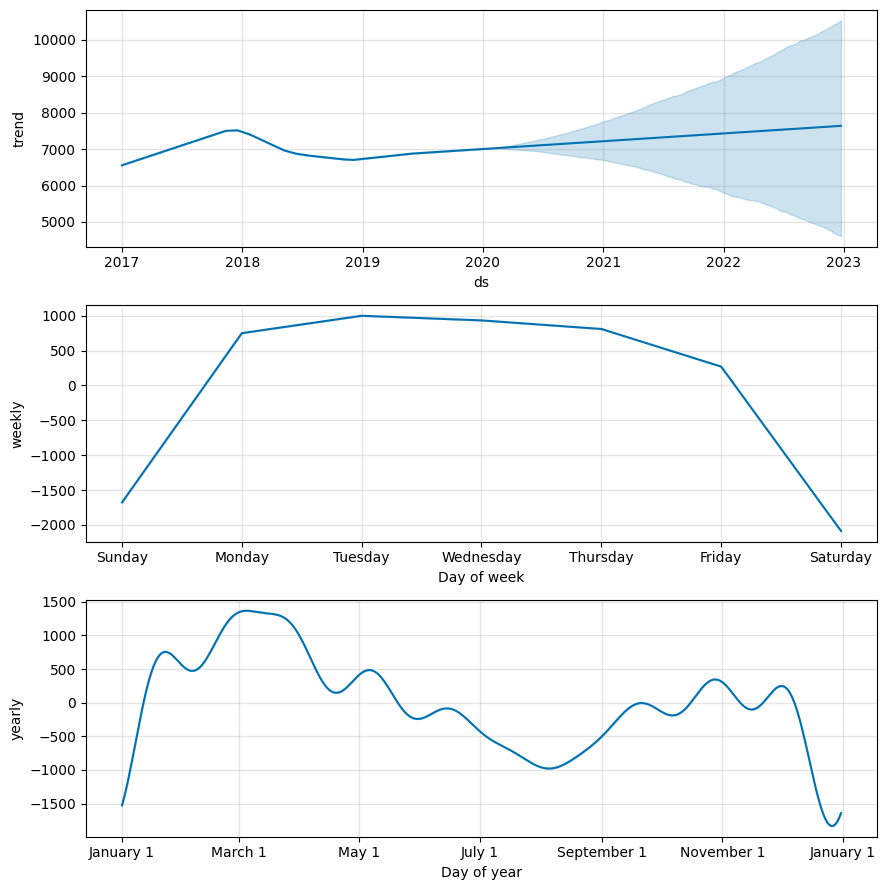

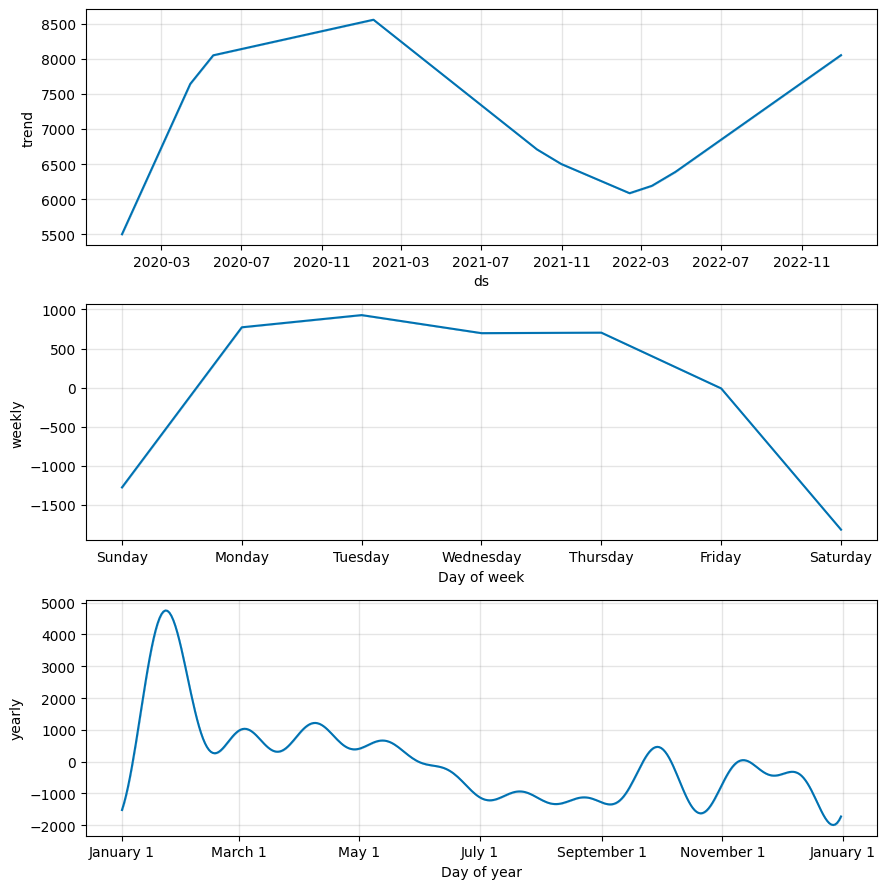

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient
INFO:prophet:Disabling daily seasonality. Run prophet with daily_se

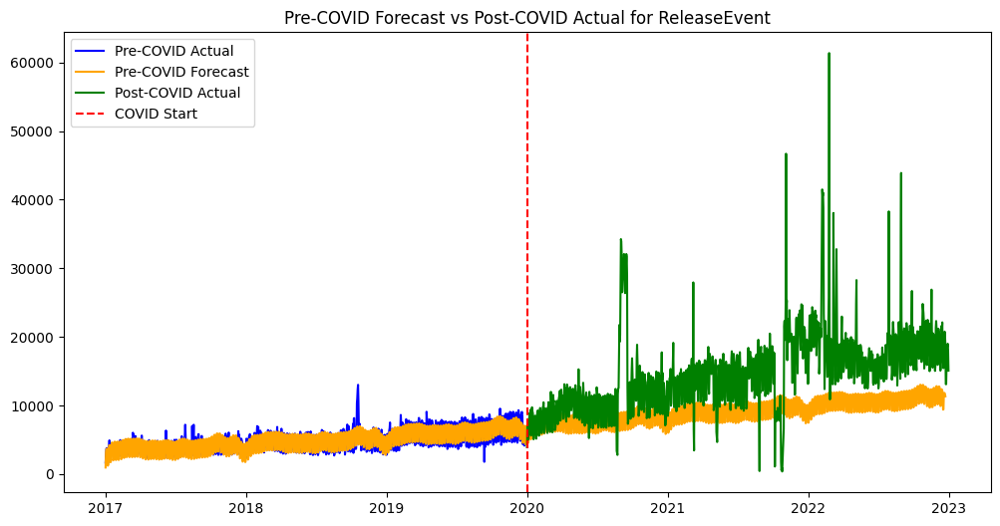

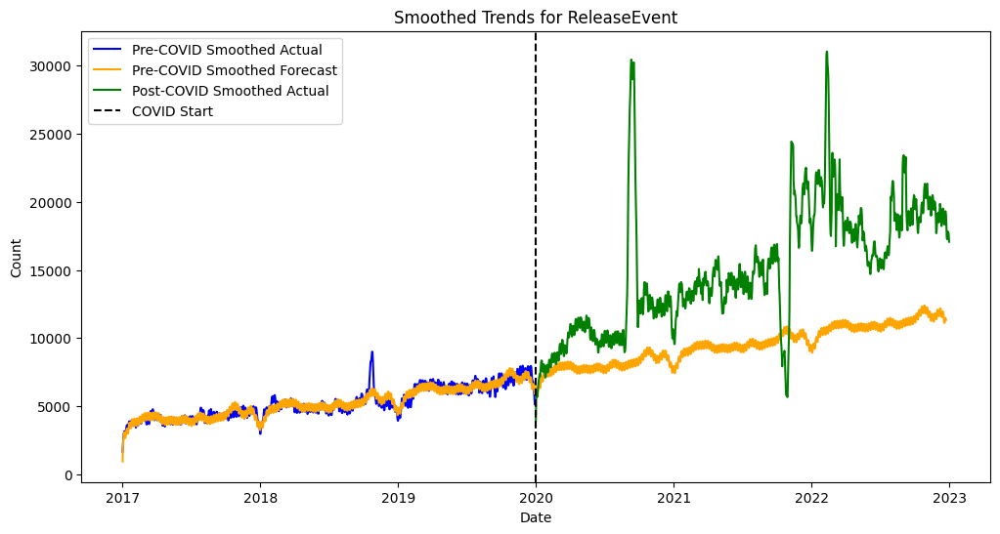

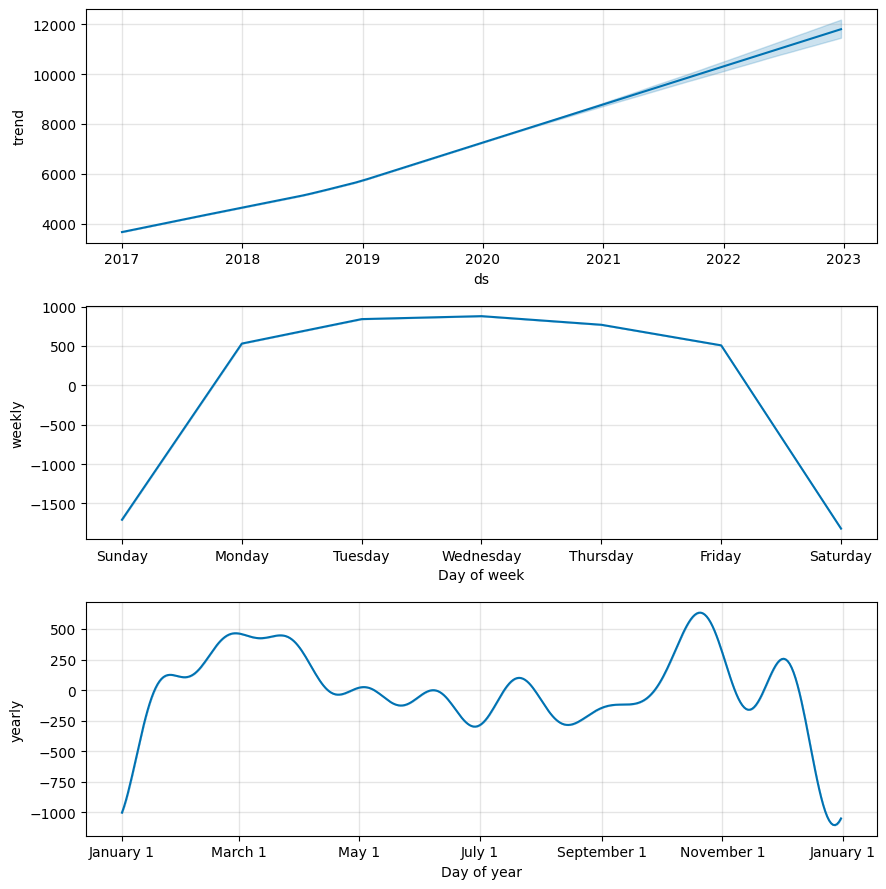

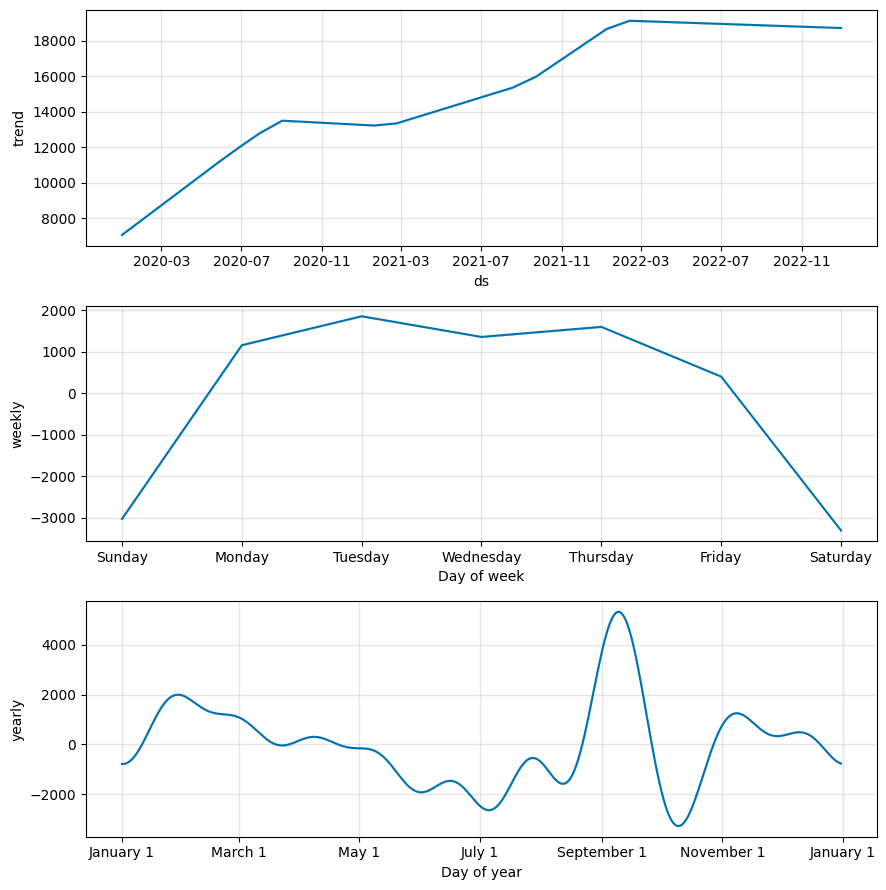

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient
INFO:prophet:Disabling daily seasonality. Run prophet with daily_se

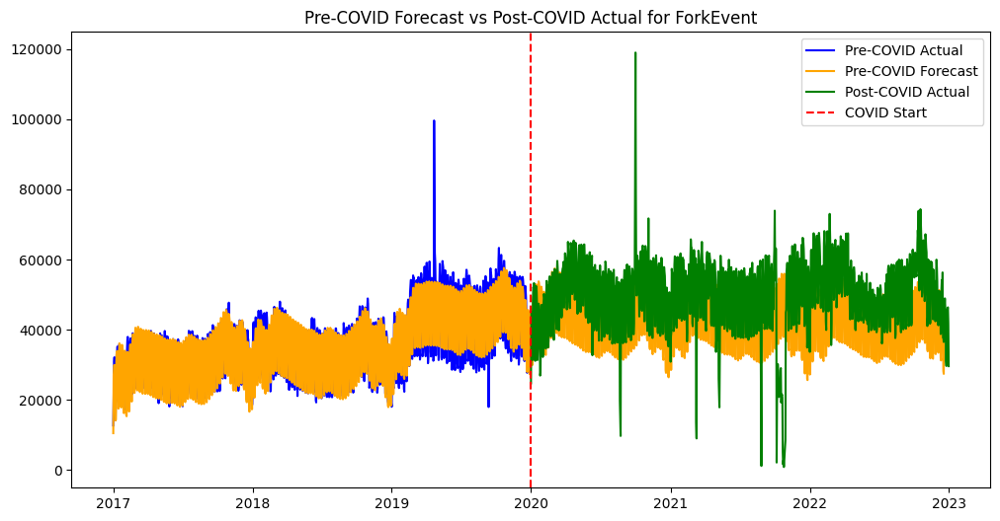

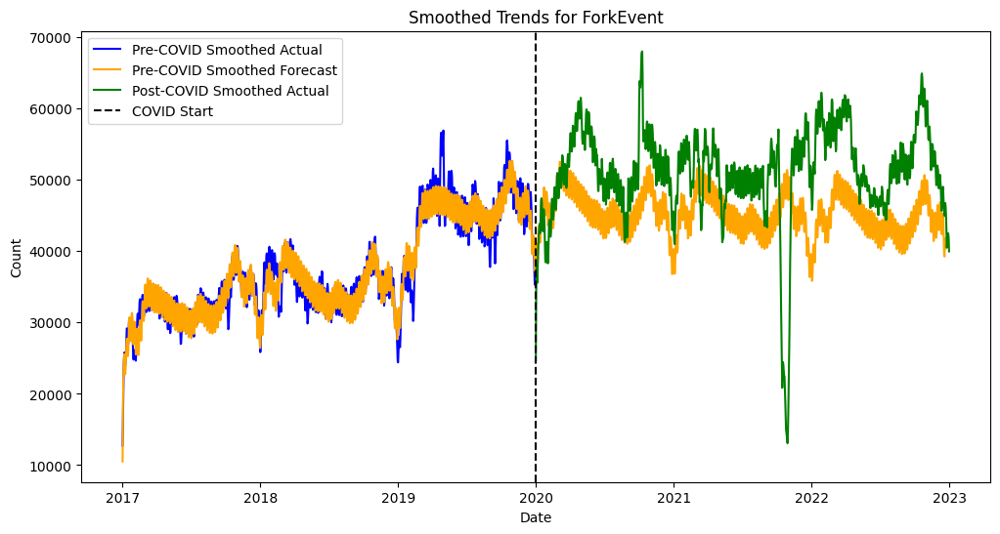

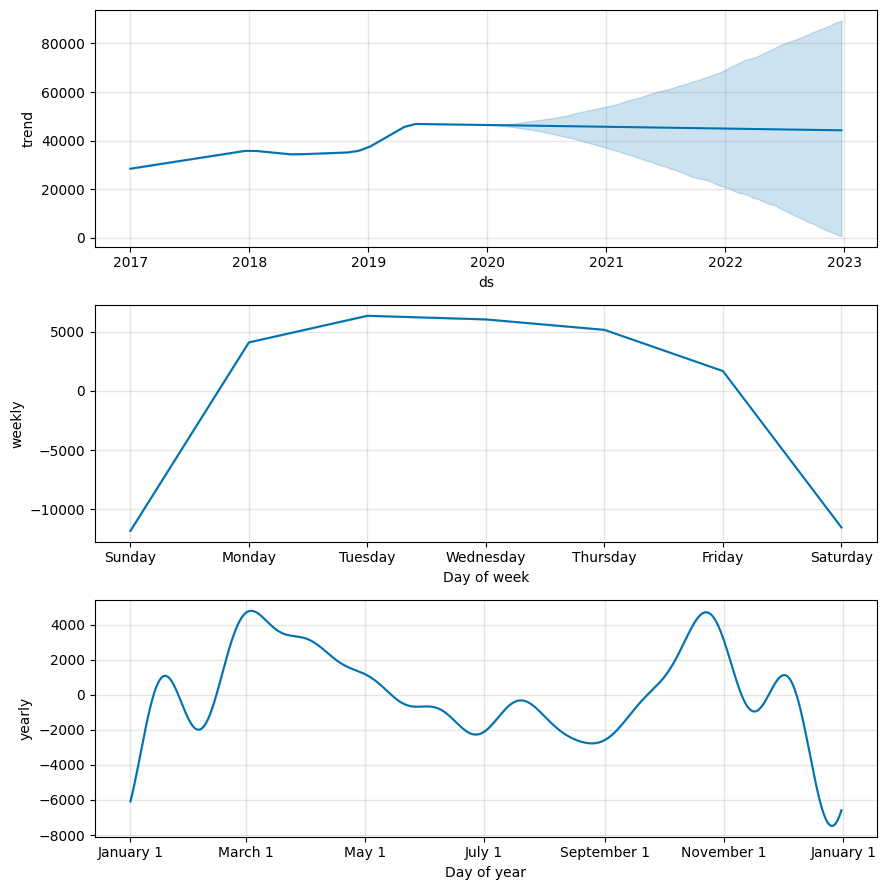

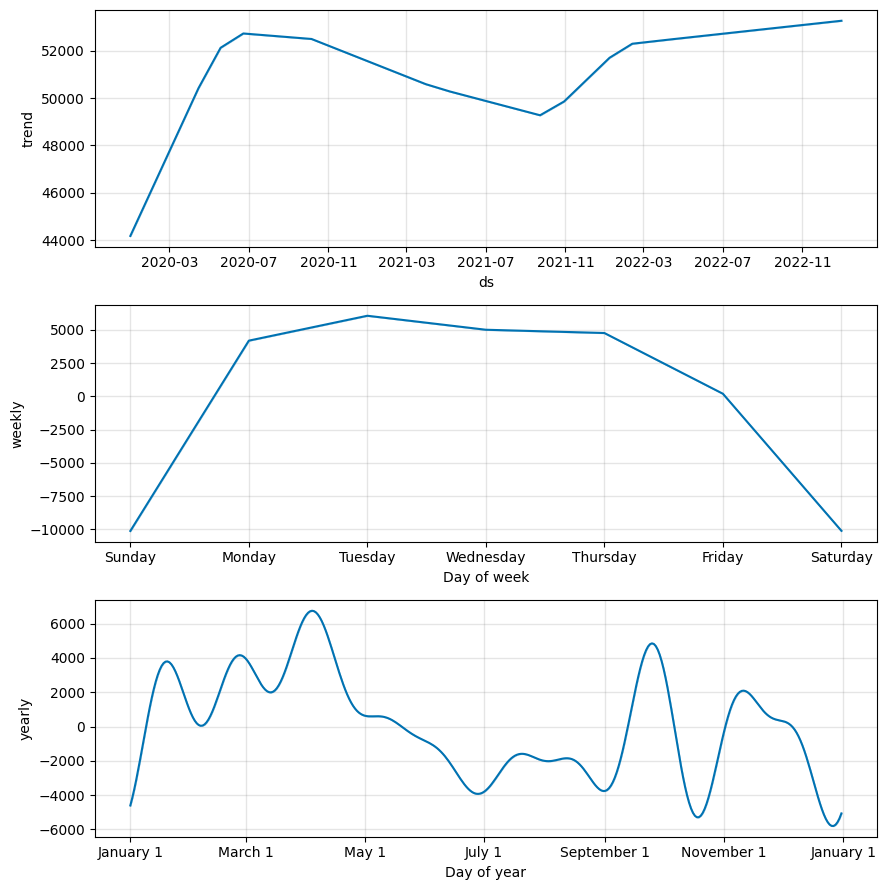

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient
INFO:prophet:Disabling daily seasonality. Run prophet with daily_se

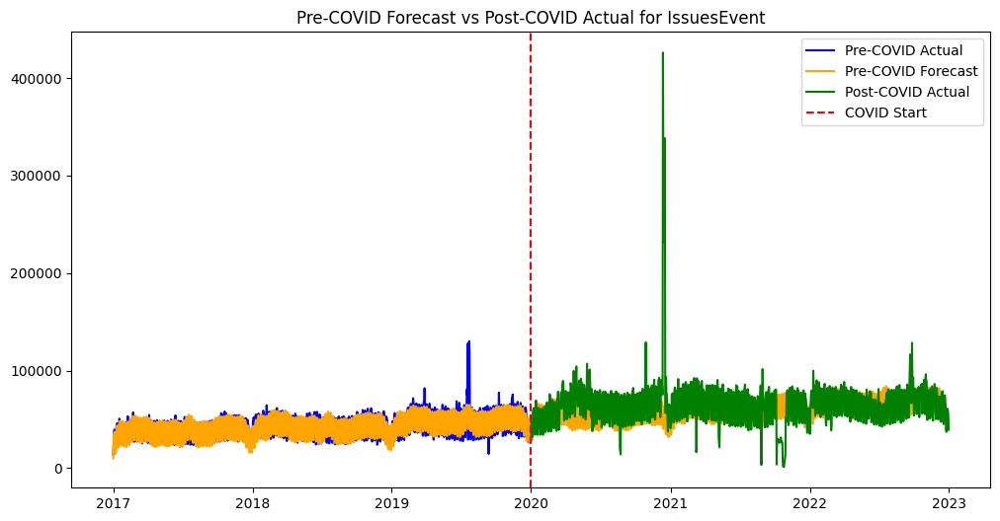

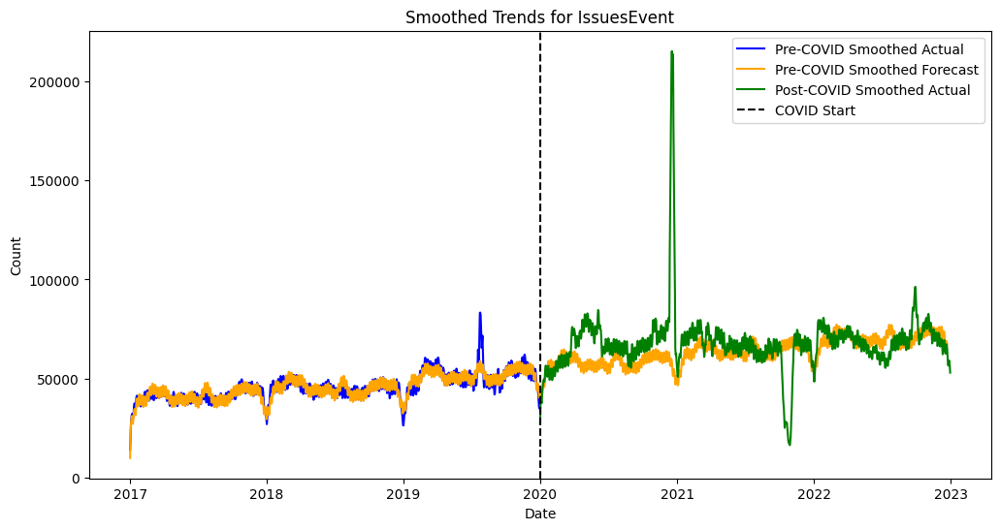

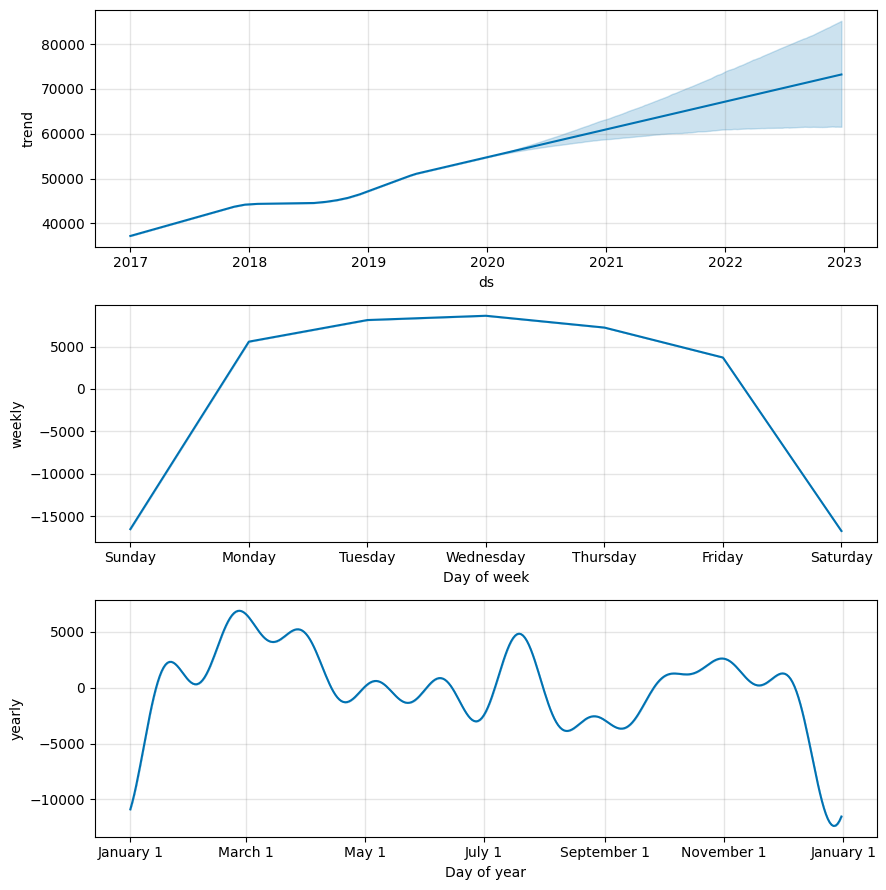

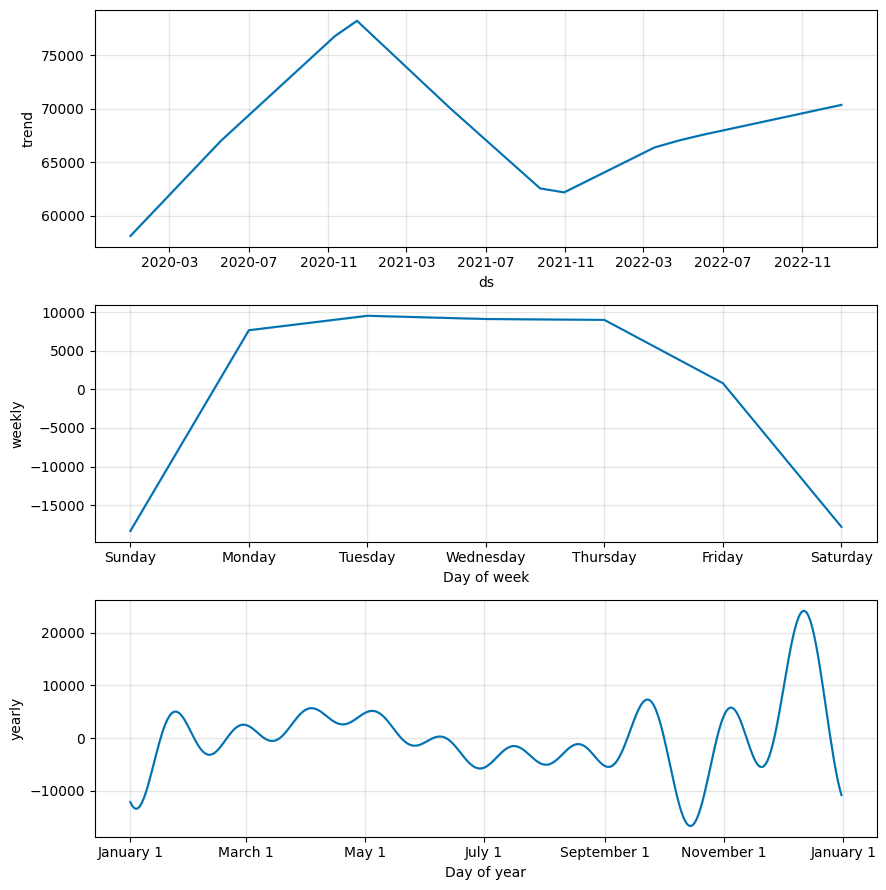

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient
INFO:prophet:Disabling daily seasonality. Run prophet with daily_se

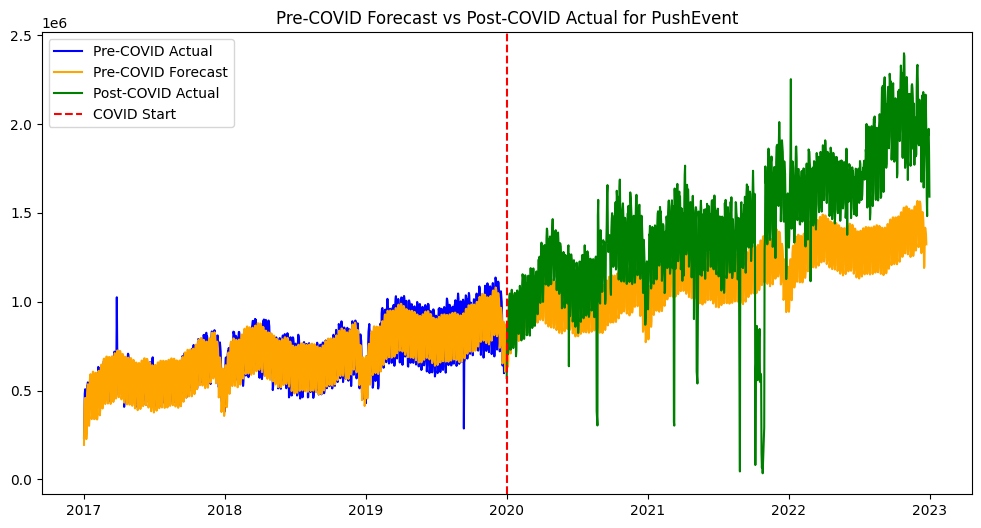

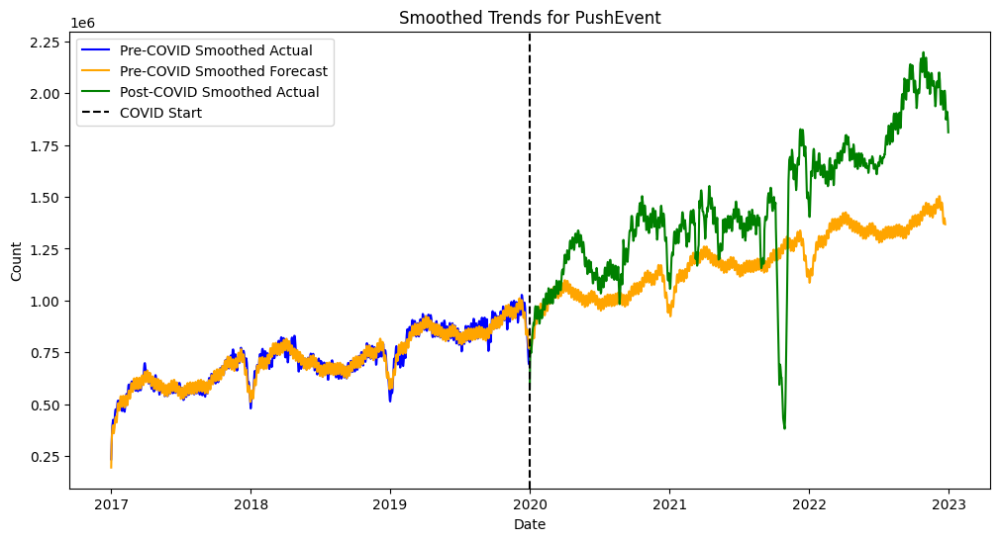

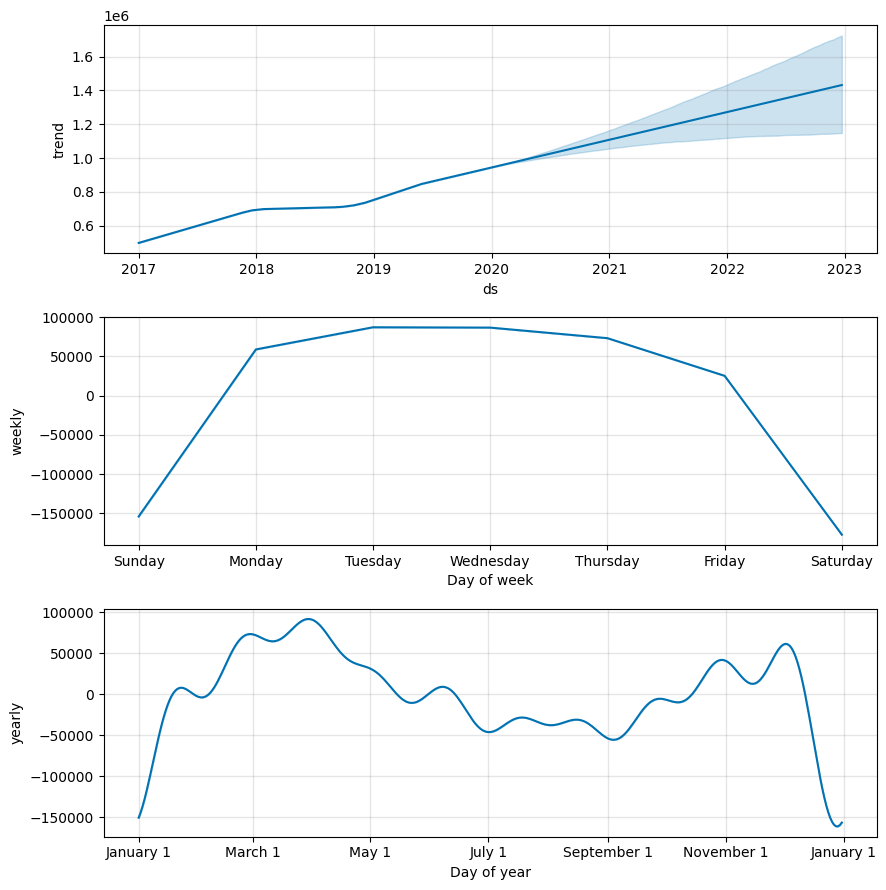

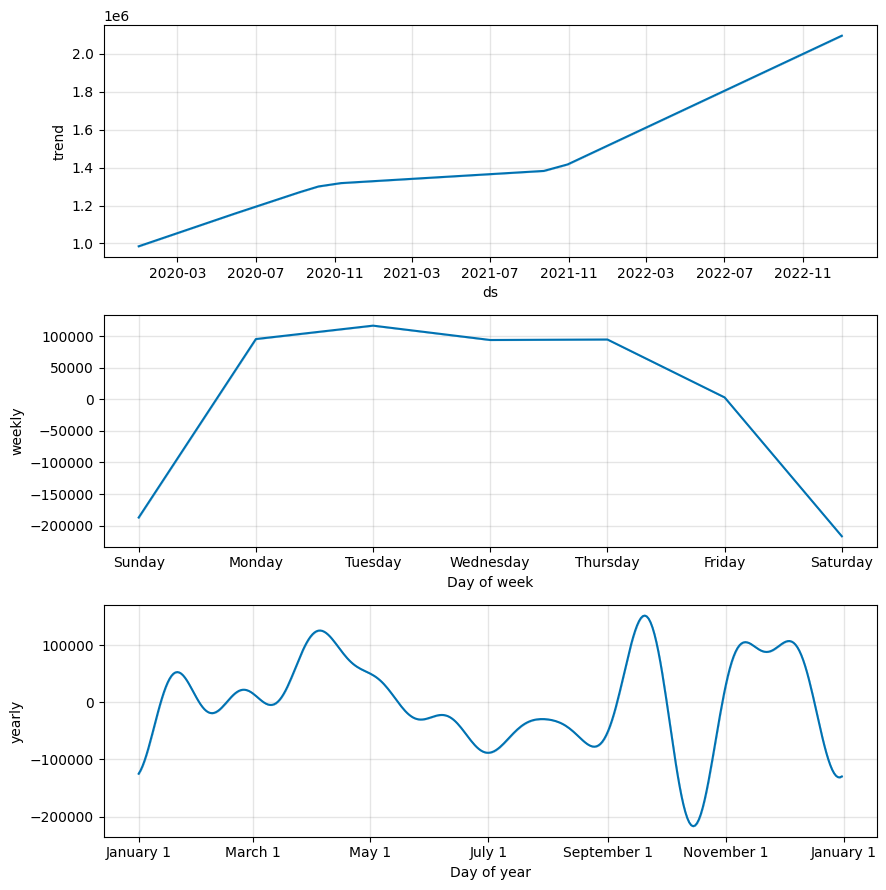

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient
INFO:prophet:Disabling daily seasonality. Run prophet with daily_se

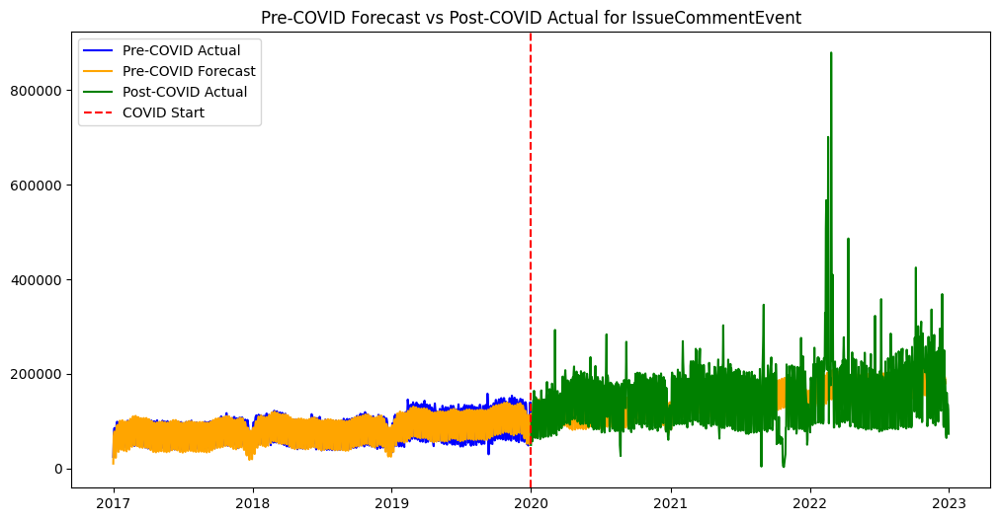

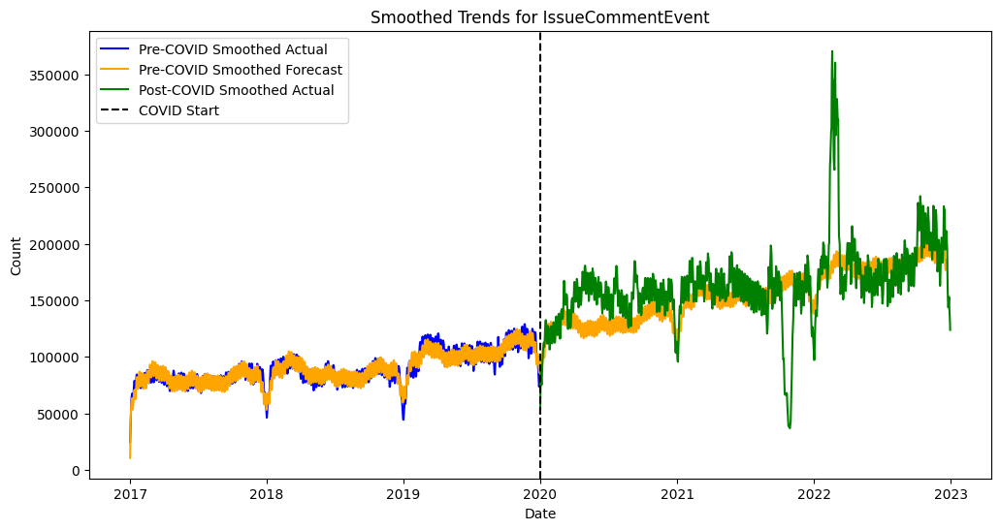

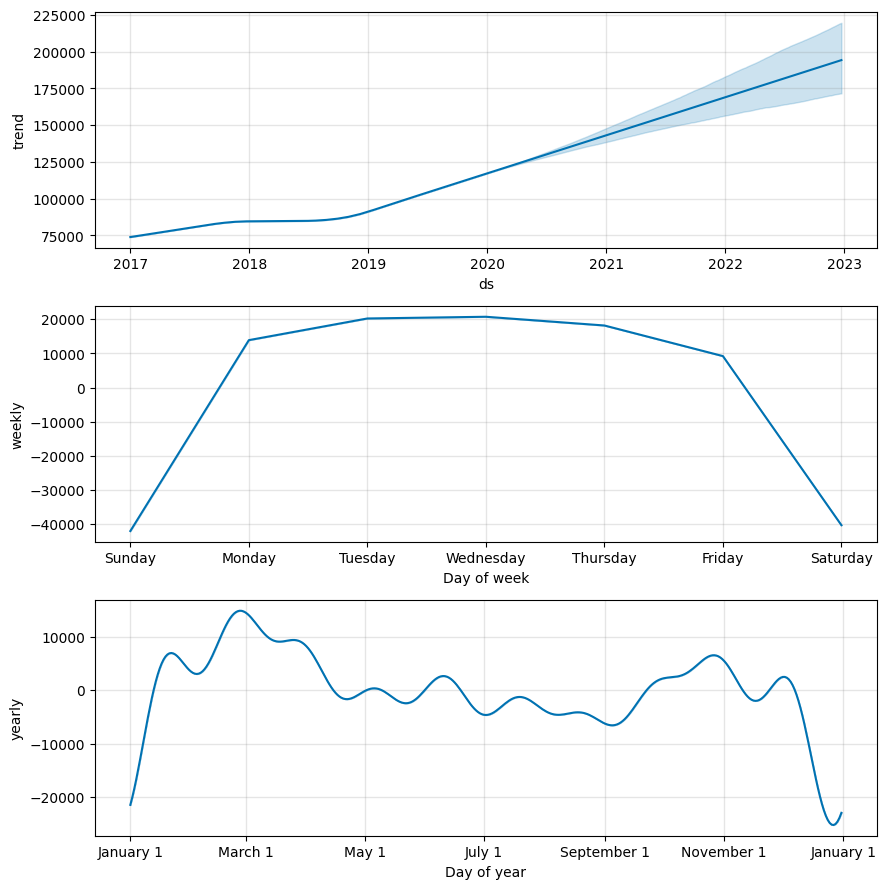

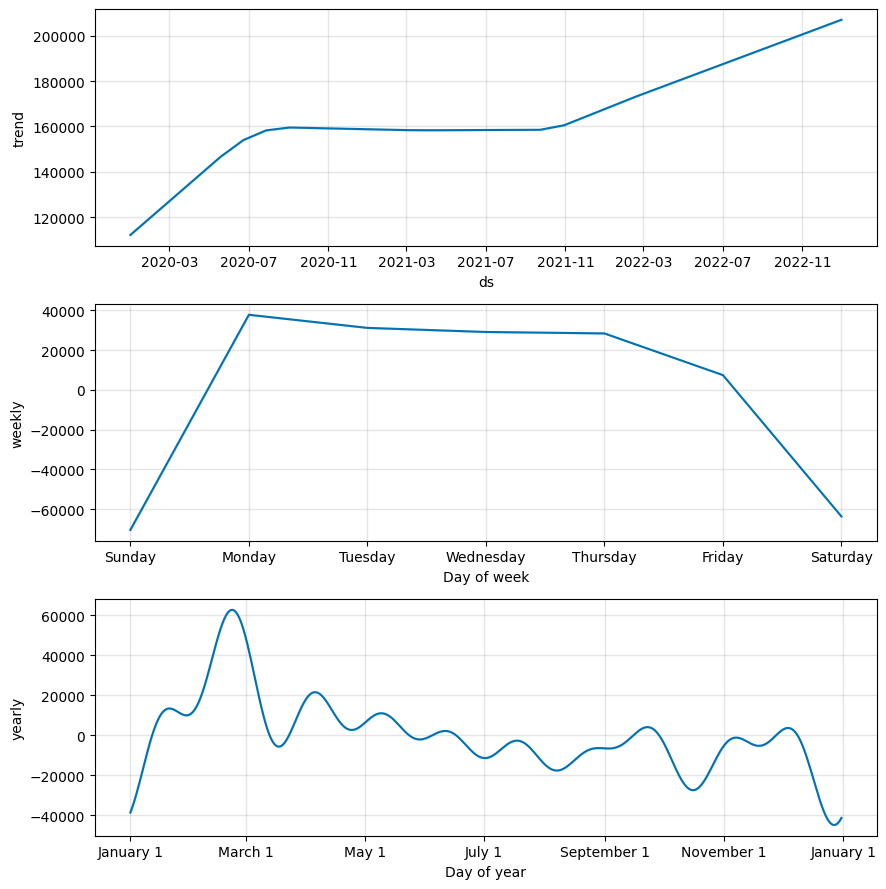

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient
INFO:prophet:Disabling daily seasonality. Run prophet with daily_se

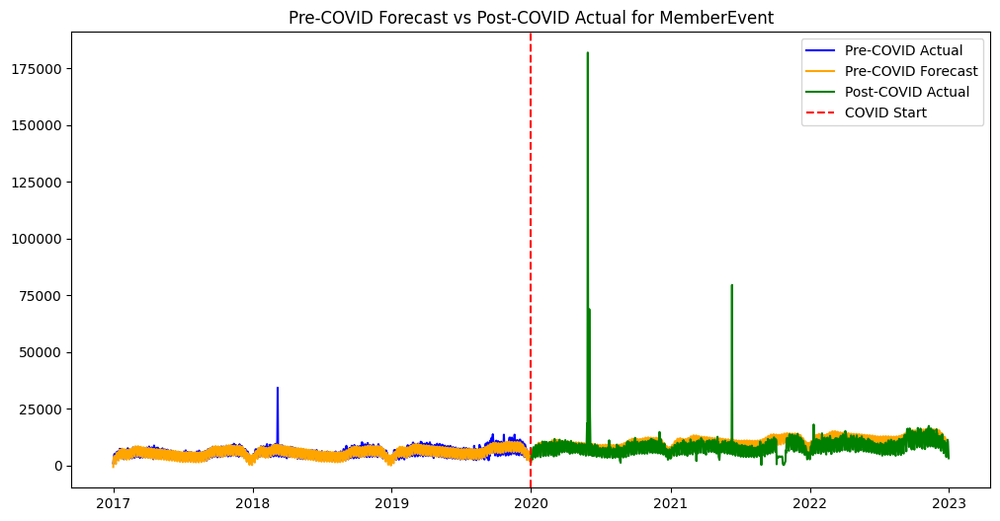

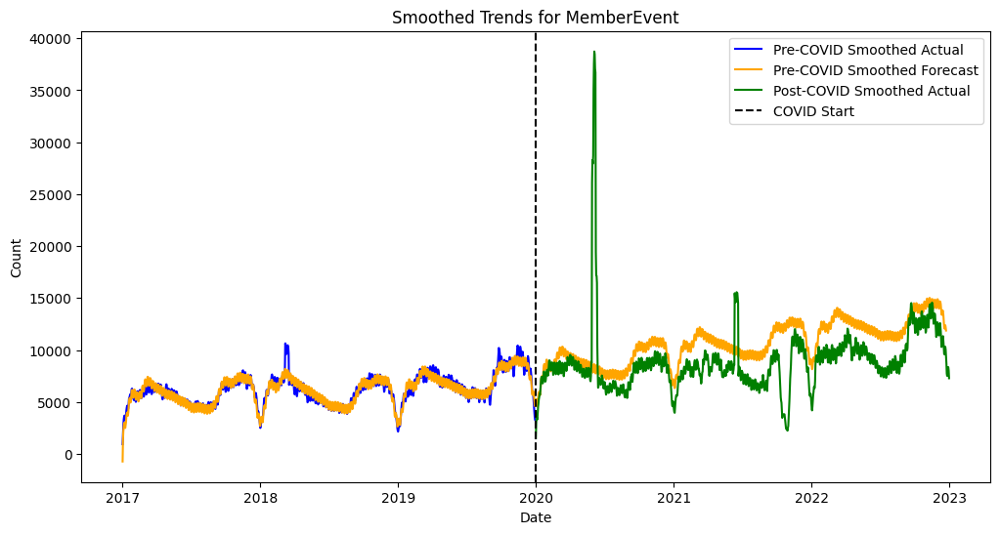

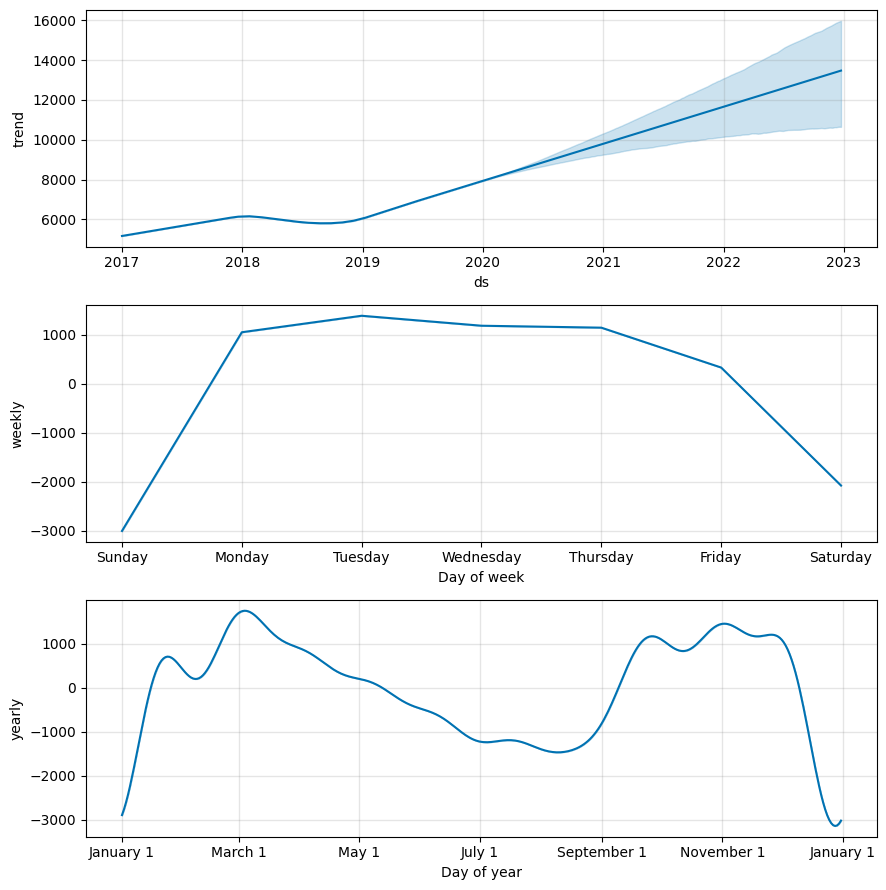

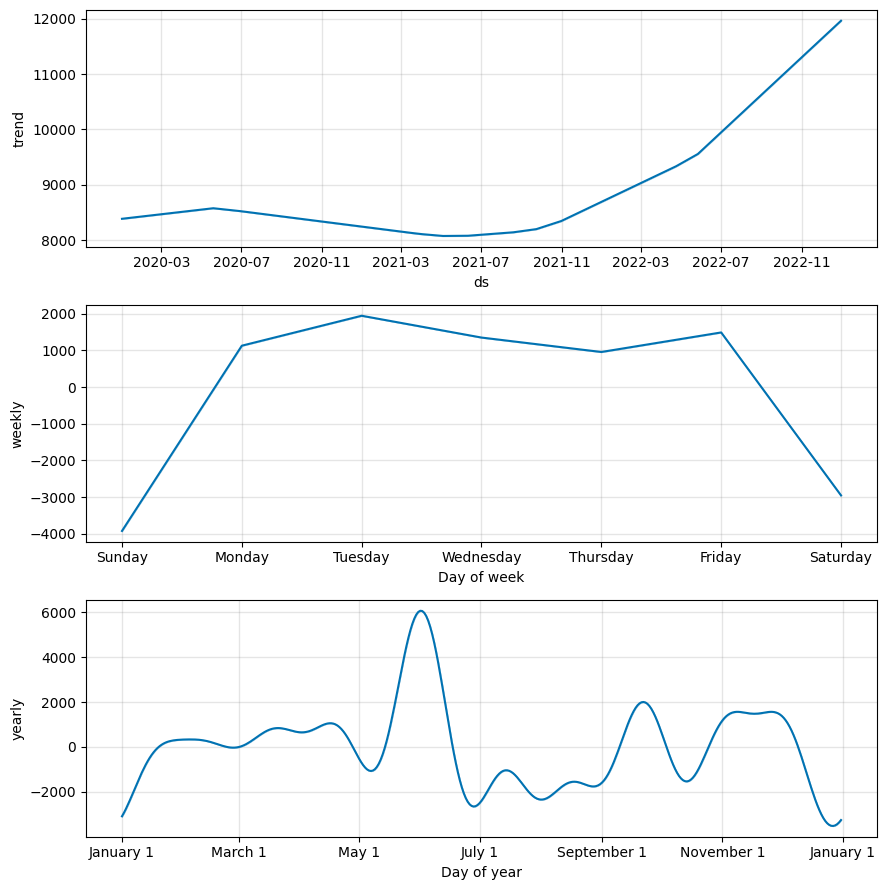

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient
INFO:prophet:Disabling daily seasonality. Run prophet with daily_se

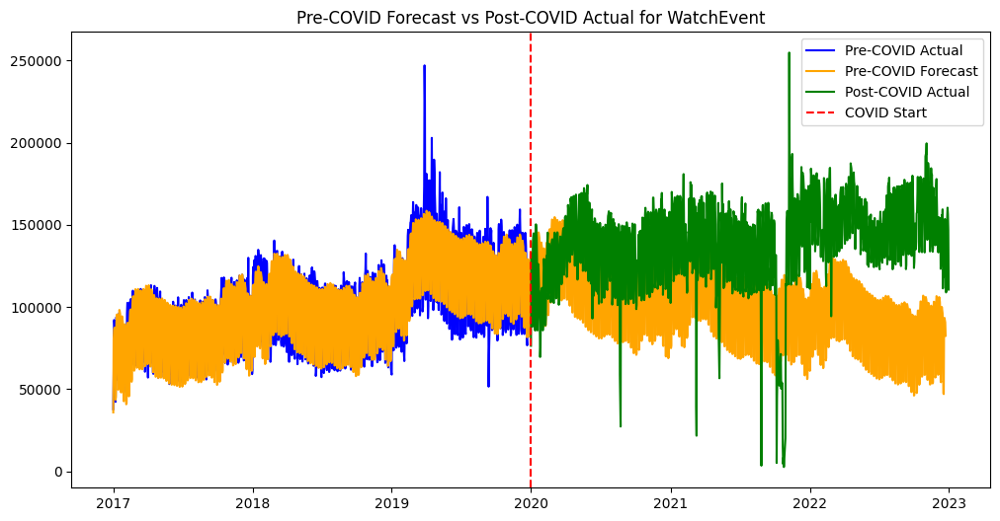

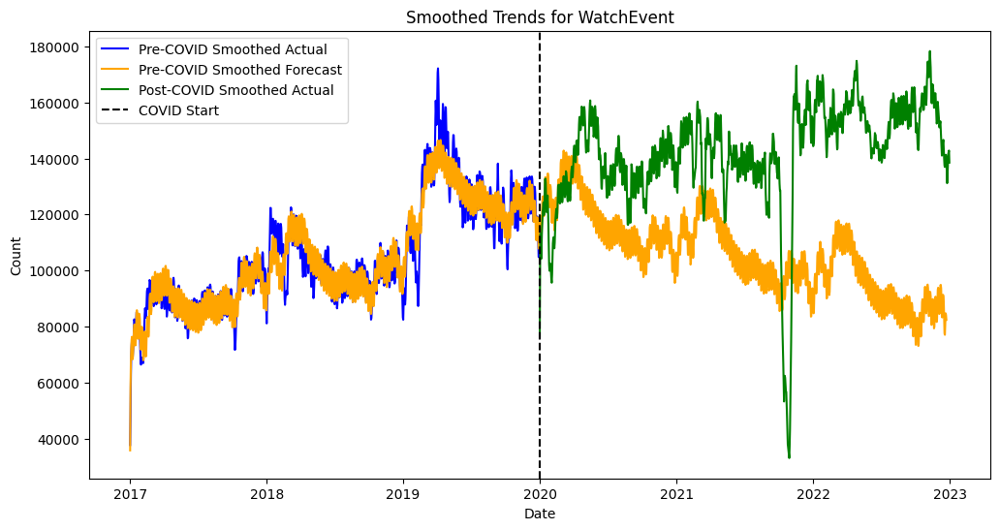

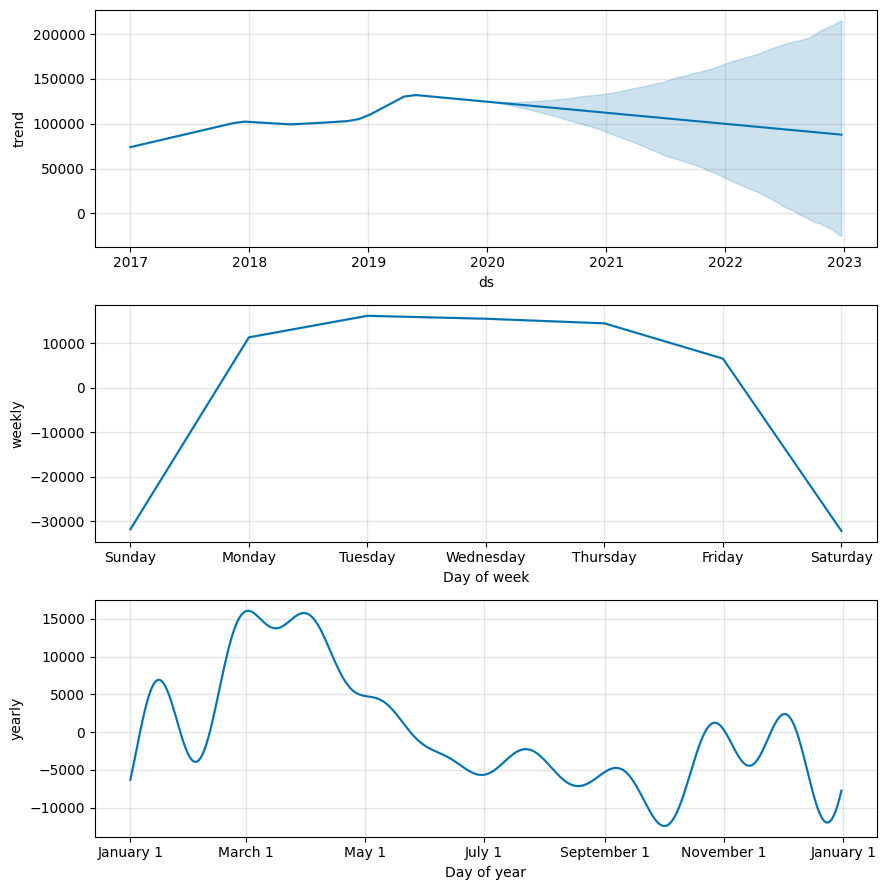

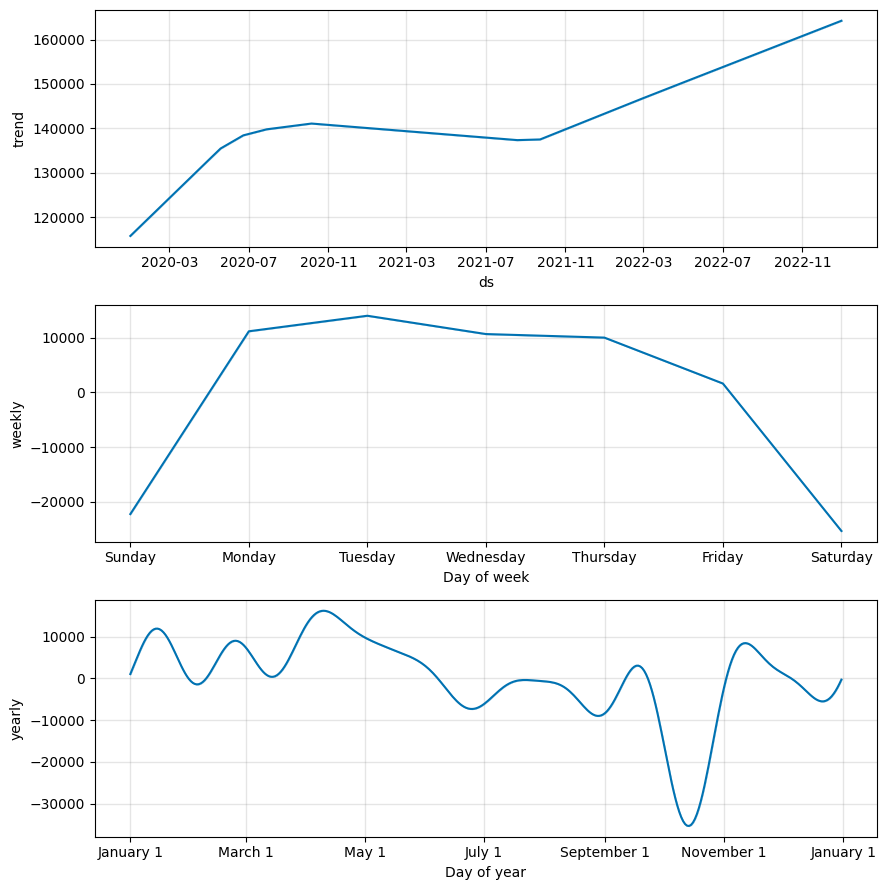

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient
INFO:prophet:Disabling daily seasonality. Run prophet with daily_se

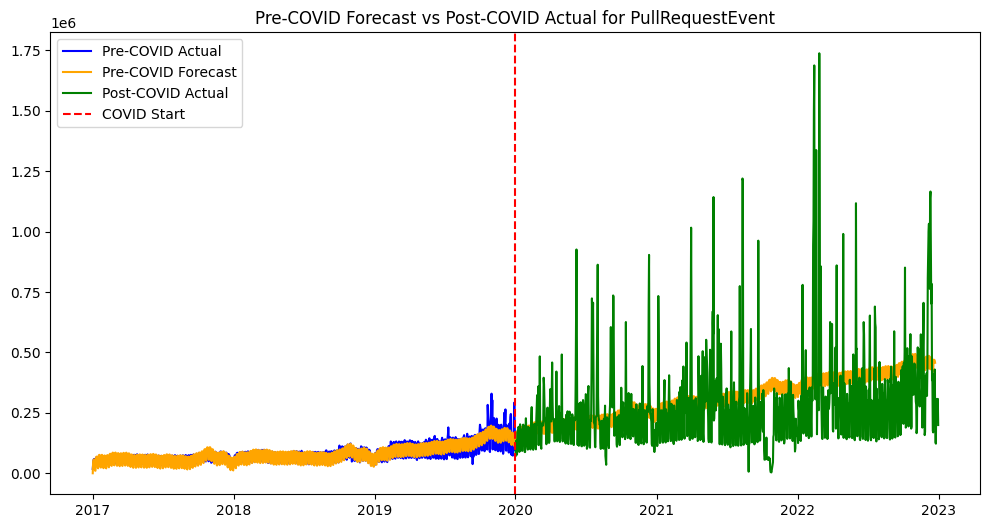

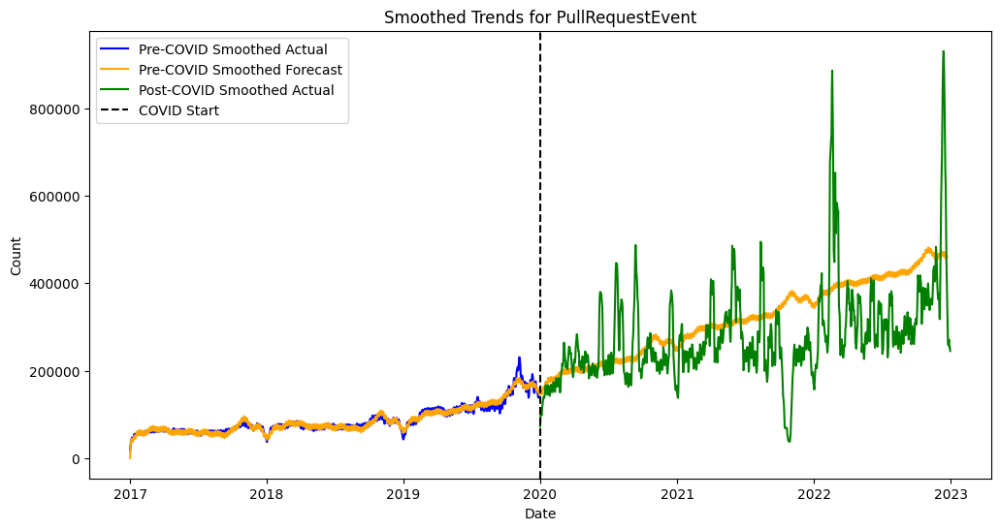

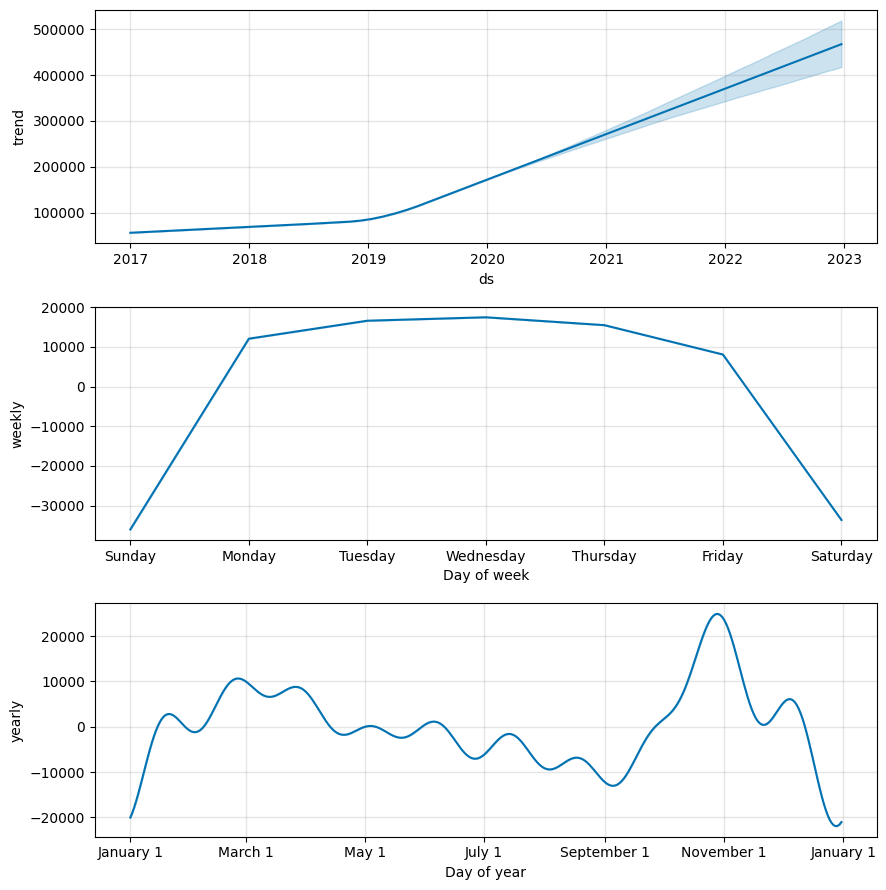

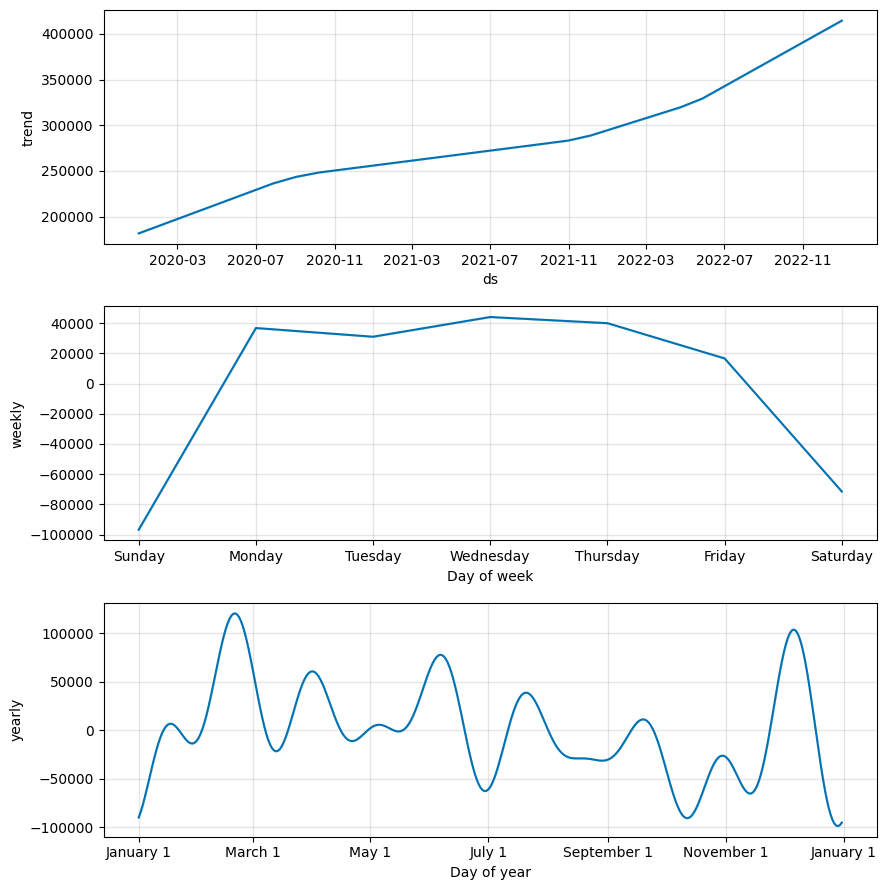

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient
INFO:prophet:Disabling daily seasonality. Run prophet with daily_se

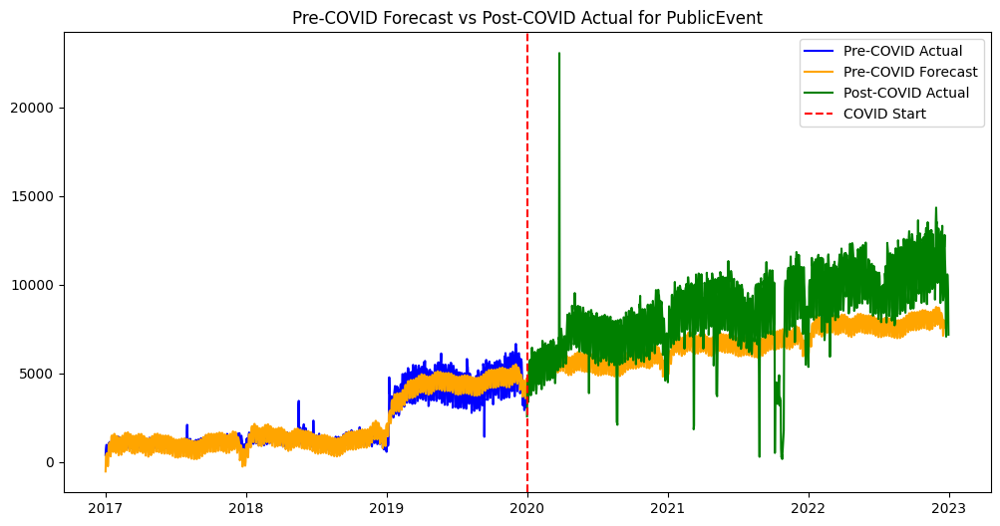

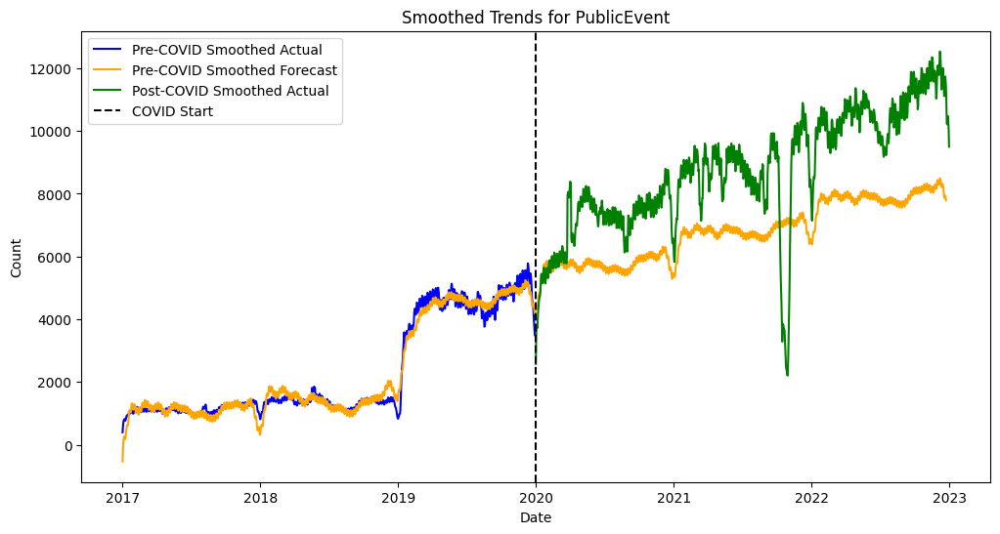

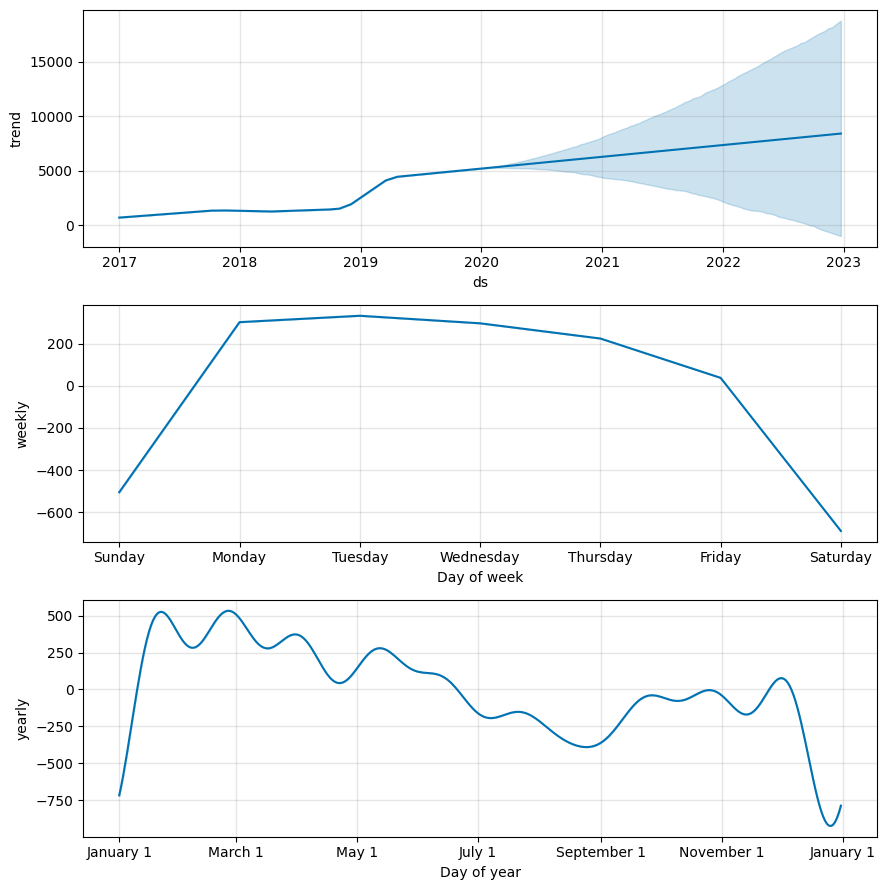

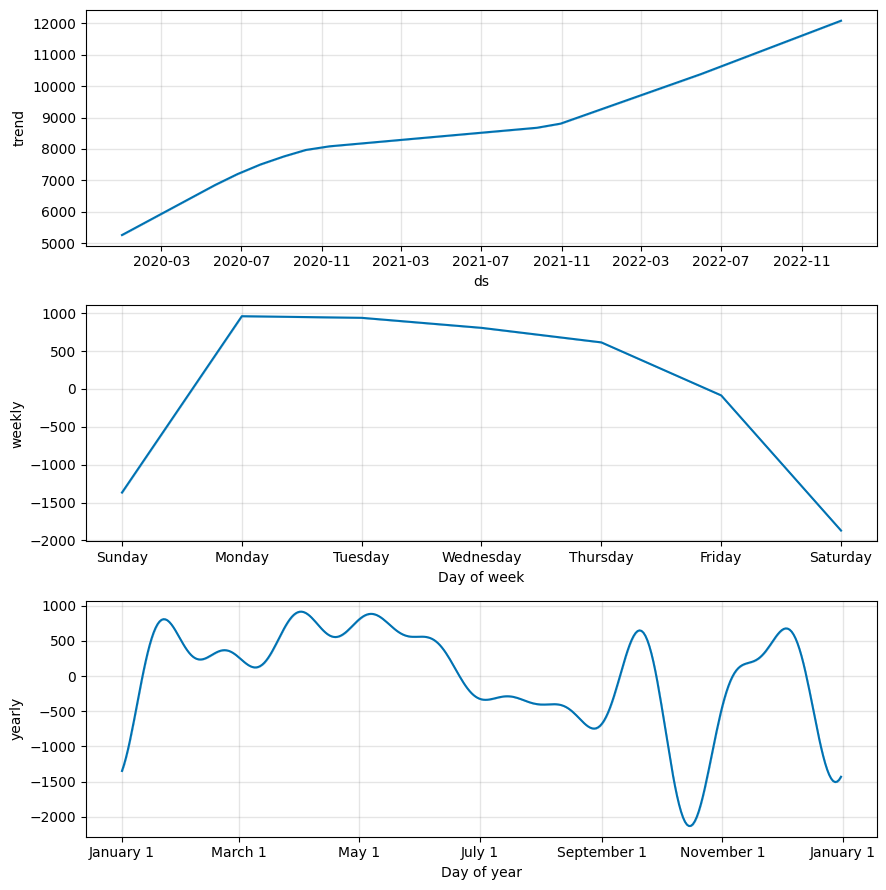

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient
INFO:prophet:Disabling daily seasonality. Run prophet with daily_se

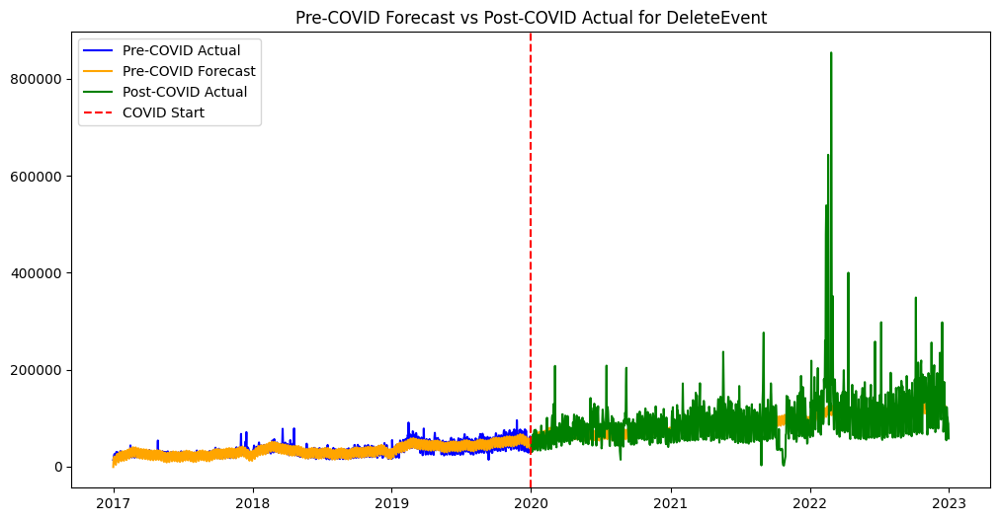

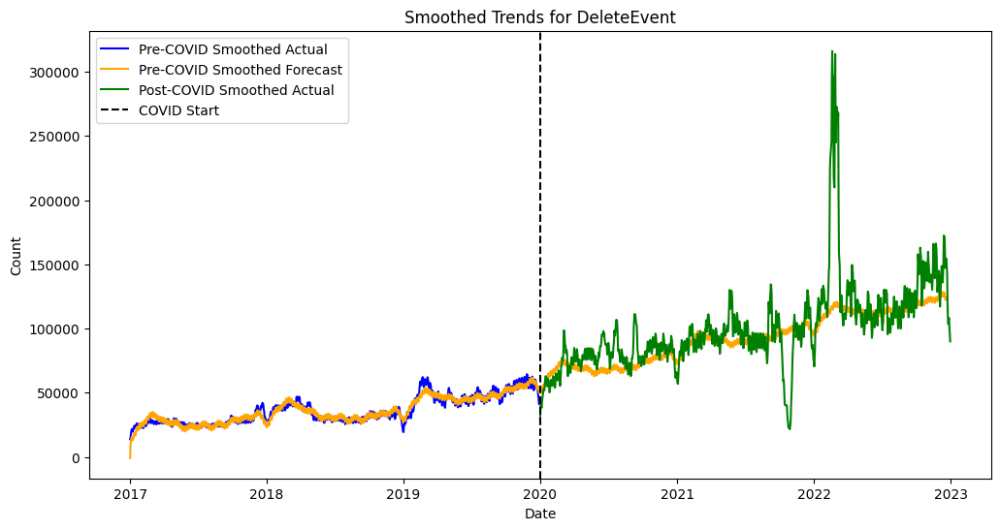

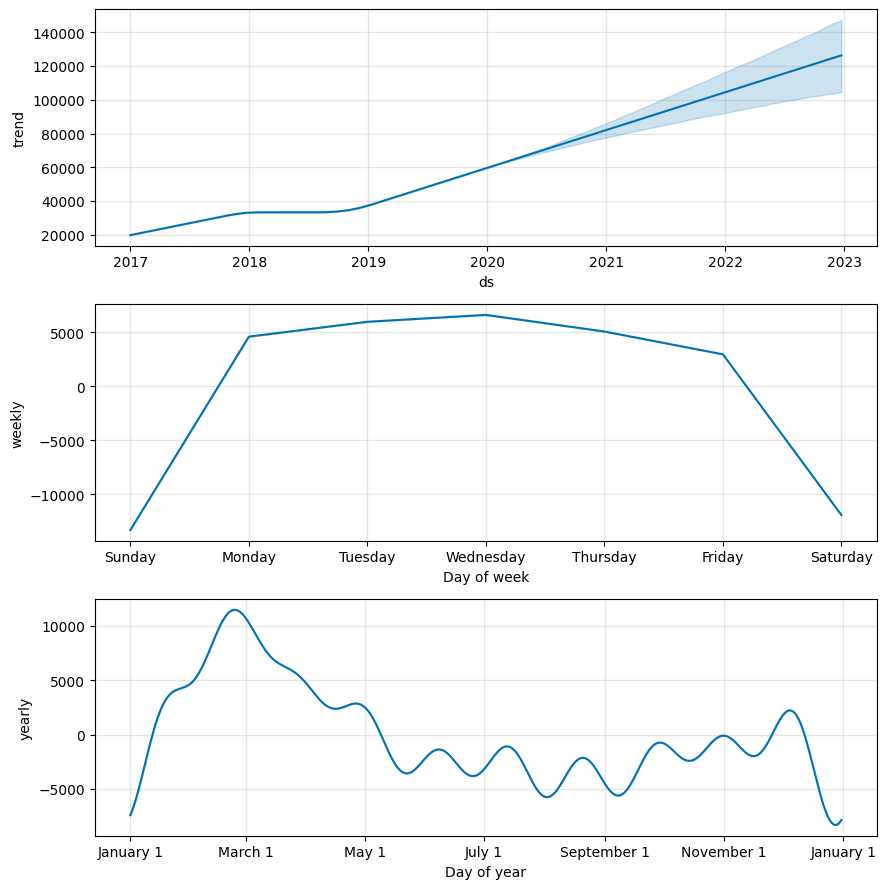

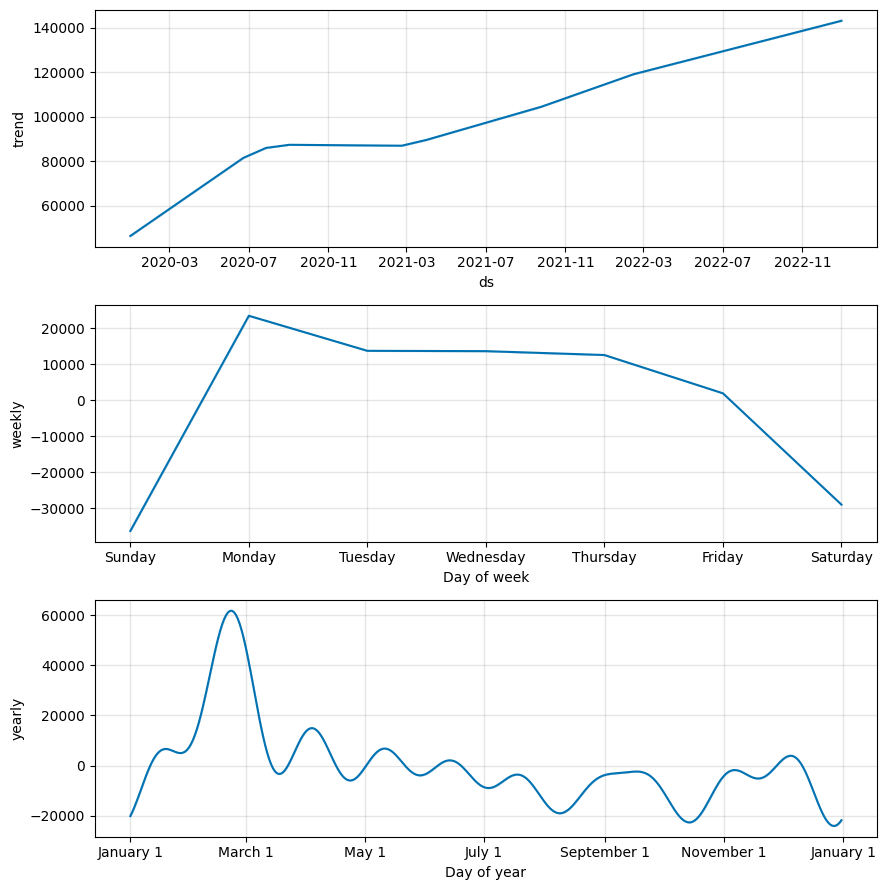

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
<ipython-input-16-e3610b3a959e>:152: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  arima_effect = arima_fit.params[1]  # Trend coefficient


In [16]:
# Set thresholds and p-value significance levels
T_TEST_PVALUE_THRESHOLD = 0.01
RELATIVE_CHANGE_THRESHOLD = 10  # Percent
DID_THRESHOLD = 0.1  # Arbitrary threshold for effect size
ITS_THRESHOLD = 0.1  # Arbitrary threshold for slope difference
ARIMA_EFFECT_THRESHOLD = 0.1  # Arbitrary threshold for ARIMA effect
window_size = 10

results = {
    'Event': [],
    'T-Test Statistic': [],
    'T-Test P-Value': [],
    'T-Test Conclusion': [],
    'Relative Change (%)': [],
    'Relative Change Conclusion': [],
    'DID Effect': [],
    'DID P-Value': [],
    'DID Conclusion': [],
    'ITS Effect': [],
    'ITS P-Value': [],
    'ITS Conclusion': [],
    'ARIMA Effect': [],
    'ARIMA Conclusion': [],
    'Overall Conclusion': [],
}

day_results = {
    'Event': [],
    'Day of Week': [],
    'Pre-COVID Average Traffic': [],
    'Post-COVID Average Traffic': [],
    'Relative Change': [],
    'P-Value': [],
    'Conclusion': []
}

df['day_of_week'] = df['date'].dt.day_name()

# Loop over each event type
event_types = df['type'].unique()

for event_type in event_types:
    # Filter data for the current event type
    df_event = df[df['type'] == event_type]

    # Aggregate by date
    df_daily = df_event.groupby(['date', 'day_of_week']).agg({'cnt': 'sum'}).reset_index()

    # Split data into pre- and post-COVID
    pre_covid = df_daily[df_daily['date'] < covid_start]
    post_covid = df_daily[df_daily['date'] >= covid_start]

    # Prepare data for Prophet
    pre_covid = pre_covid.rename(columns={'date': 'ds', 'cnt': 'y'})
    post_covid = post_covid.rename(columns={'date': 'ds', 'cnt': 'y'})

    # Skip if there is insufficient data
    if len(pre_covid) < 2 or len(post_covid) < 2:
        print(f"Not enough data for event type: {event_type}")
        continue

    # Train Prophet on pre-COVID data
    model_pre = Prophet()
    model_pre.fit(pre_covid)

    # Forecast using pre-COVID model
    future_pre = model_pre.make_future_dataframe(periods=len(post_covid), freq='D')
    forecast_pre = model_pre.predict(future_pre)

    # Train Prophet on post-COVID data
    model_post = Prophet()
    model_post.fit(post_covid)
    forecast_post = model_post.predict(post_covid[['ds']])

    # Visualize pre-COVID forecast vs actual post-COVID
    plt.figure(figsize=(12, 6))
    plt.plot(pre_covid['ds'], pre_covid['y'], label='Pre-COVID Actual', color='blue')
    plt.plot(forecast_pre['ds'], forecast_pre['yhat'], label='Pre-COVID Forecast', color='orange')
    plt.plot(post_covid['ds'], post_covid['y'], label='Post-COVID Actual', color='green')
    plt.axvline(x=covid_start, color='red', linestyle='--', label='COVID Start')
    plt.legend()
    plt.title(f'Pre-COVID Forecast vs Post-COVID Actual for {event_type}')
    plt.show()

    # Smooth the data
    pre_covid['y_smoothed'] = pre_covid['y'].rolling(window=window_size, min_periods=1).mean()
    post_covid['y_smoothed'] = post_covid['y'].rolling(window=window_size, min_periods=1).mean()
    forecast_pre['yhat_smoothed'] = forecast_pre['yhat'].rolling(window=window_size, min_periods=1).mean()

    # Visualize smoothed data
    plt.figure(figsize=(12, 6))
    plt.plot(pre_covid['ds'], pre_covid['y_smoothed'], label='Pre-COVID Smoothed Actual', color='blue')
    plt.plot(forecast_pre['ds'], forecast_pre['yhat_smoothed'], label='Pre-COVID Smoothed Forecast', color='orange')
    plt.plot(post_covid['ds'], post_covid['y_smoothed'], label='Post-COVID Smoothed Actual', color='green')
    plt.axvline(x=covid_start, color='black', linestyle='--', label='COVID Start')
    plt.legend()
    plt.title(f'Smoothed Trends for {event_type}')
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.show()

    # Plot components
    pre_components_fig = model_pre.plot_components(forecast_pre)
    plt.show()
    post_components_fig = model_post.plot_components(forecast_post)
    plt.show()

    # Perform a paired t-test between forecasted and actual values for post-COVID
    actual_values = post_covid['y'].values
    forecasted_values = forecast_pre['yhat'][-len(post_covid):].values
    t_stat, t_p_value = ttest_rel(actual_values, forecasted_values)
    t_test_conclusion = "Significant" if t_p_value < T_TEST_PVALUE_THRESHOLD else "Not Significant"

    # Calculate relative change for post-COVID data
    relative_changes = (actual_values - forecasted_values) / forecasted_values * 100
    mean_relative_change = np.mean(relative_changes)
    if mean_relative_change > RELATIVE_CHANGE_THRESHOLD:
        relative_change_conclusion = "Increase"
    elif mean_relative_change < -RELATIVE_CHANGE_THRESHOLD:
        relative_change_conclusion = "Decrease"
    else:
        relative_change_conclusion = "No Significant Change"

    # Add group and interaction terms for DID
    df_daily['group'] = (df_daily['date'] >= covid_start).astype(int)
    df_daily['time'] = (df_daily['date'] - df_daily['date'].min()).dt.days  # Time as numerical variable
    df_daily['time_group'] = df_daily['time'] * df_daily['group']

    # Fit DID model
    did_model = ols('cnt ~ time + group + time_group', data=df_daily).fit()
    did_effect = did_model.params['time_group']
    did_p_value = did_model.pvalues['time_group']
    did_conclusion = "Significant" if did_p_value < T_TEST_PVALUE_THRESHOLD else "Not Significant"

    # Add variables for ITS
    df_daily['post'] = (df_daily['date'] >= covid_start).astype(int)
    df_daily['time'] = (df_daily['date'] - df_daily['date'].min()).dt.days
    df_daily['time_post'] = df_daily['time'] * df_daily['post']

    # Fit ITS model
    its_model = ols('cnt ~ time + post + time_post', data=df_daily).fit()

    # Extract ITS effect and p-value
    its_effect = its_model.params['time_post']
    its_p_value = its_model.pvalues['time_post']
    its_conclusion = "Significant" if its_p_value < T_TEST_PVALUE_THRESHOLD else "Not Significant"

    # Perform ARIMA modeling
    series = pre_covid.set_index('ds')['y']
    arima_model = ARIMA(series, order=(1, 1, 0))
    arima_fit = arima_model.fit()
    arima_effect = arima_fit.params[1]  # Trend coefficient
    arima_conclusion = "Significant" if abs(arima_effect) > ARIMA_EFFECT_THRESHOLD else "Not Significant"

    # Add results to the dictionary
    results['Event'].append(event_type)
    results['T-Test Statistic'].append(round(t_stat, 2))
    results['T-Test P-Value'].append(round(t_p_value, 4))
    results['T-Test Conclusion'].append(t_test_conclusion)
    results['Relative Change (%)'].append(round(mean_relative_change, 2))
    results['Relative Change Conclusion'].append(relative_change_conclusion)
    results['DID Effect'].append(round(did_effect, 2))
    results['DID P-Value'].append(round(did_p_value, 4))
    results['DID Conclusion'].append(did_conclusion)
    results['ITS Effect'].append(round(its_effect, 2))
    results['ITS P-Value'].append(round(its_p_value, 4))
    results['ITS Conclusion'].append(its_conclusion)
    results['ARIMA Effect'].append(round(arima_effect, 2))
    results['ARIMA Conclusion'].append(arima_conclusion)
    results['Overall Conclusion'].append(
        f"T-Test: {t_test_conclusion}, Relative Change: {relative_change_conclusion}, "
        f"DID: {did_conclusion}, ITS: {its_conclusion}, ARIMA: {arima_conclusion}"
    )

    # Analyze traffic by day of the week
    for day in df['day_of_week'].unique():
        pre_day = pre_covid[pre_covid['day_of_week'] == day]['y']
        post_day = post_covid[post_covid['day_of_week'] == day]['y']

        if pre_day.empty or post_day.empty:
            continue

        pre_avg = pre_day.mean()
        post_avg = post_day.mean()
        relative_change = (post_avg - pre_avg) / pre_avg if pre_avg != 0 else None

        min_length = min(len(pre_day), len(post_day))
        pre_day = pre_day[:min_length]
        post_day = post_day[:min_length]
        _, p_val = ttest_rel(pre_day, post_day)

        day_results['Event'].append(event_type)
        day_results['Day of Week'].append(day)
        day_results['Pre-COVID Average Traffic'].append(round(pre_avg, 2))
        day_results['Post-COVID Average Traffic'].append(round(post_avg, 2))
        day_results['Relative Change'].append(f'{relative_change:.2f}%' if relative_change is not None else 'N/A')
        day_results['P-Value'].append(round(p_val, 4))
        day_results['Conclusion'].append('Significant' if p_val < 0.05 else 'Not Significant')

results_df = pd.DataFrame(results)
day_results_df = pd.DataFrame(day_results)
results_df.to_csv('results_analysis.csv', index=False)
day_results_df.to_csv('daily_results_analysis.csv', index=False)

In [17]:
results_df

,Event,T-Test Statistic,T-Test P-Value,T-Test Conclusion,Relative Change (%),Relative Change Conclusion,DID Effect,DID P-Value,DID Conclusion,ITS Effect,ITS P-Value,ITS Conclusion,ARIMA Effect,ARIMA Conclusion,Overall Conclusion
0,CommitCommentEvent,42.25,0.0000,Significant,130.36,Increase,18.59,0.0000,Significant,18.59,0.0000,Significant,5.068049e+05,Significant,"T-Test: Significant, Relative Change: Increase..."
1,PullRequestReviewCommentEvent,-5.23,0.0000,Significant,-3.66,No Significant Change,-9.14,0.0000,Significant,-9.14,0.0000,Significant,1.349044e+08,Significant,"T-Test: Significant, Relative Change: No Signi..."
2,CreateEvent,-5.16,0.0000,Significant,-4.13,No Significant Change,132.19,0.0000,Significant,132.19,0.0000,Significant,1.758342e+09,Significant,"T-Test: Significant, Relative Change: No Signi..."
3,GollumEvent,0.09,0.9286,Not Significant,2.71,No Significant Change,-1.14,0.0003,Significant,-1.14,0.0003,Significant,2.320007e+06,Significant,"T-Test: Not Significant, Relative Change: No S..."
4,ReleaseEvent,35.74,0.0000,Significant,58.39,Increase,7.08,0.0000,Significant,7.08,0.0000,Significant,1.977214e+06,Significant,"T-Test: Significant, Relative Change: Increase..."
5,ForkEvent,17.00,0.0000,Significant,15.84,Increase,-14.84,0.0000,Significant,-14.84,0.0000,Significant,7.610273e+07,Significant,"T-Test: Significant, Relative Change: Increase..."
6,IssuesEvent,5.32,0.0000,Significant,9.84,No Significant Change,-12.72,0.0000,Significant,-12.72,0.0000,Significant,1.669239e+08,Significant,"T-Test: Significant, Relative Change: No Signi..."
7,PushEvent,30.98,0.0000,Significant,22.28,Increase,517.59,0.0000,Significant,517.59,0.0000,Significant,1.511599e+10,Significant,"T-Test: Significant, Relative Change: Increase..."
8,IssueCommentEvent,4.26,0.0000,Significant,8.07,No Significant Change,17.26,0.0138,Not Significant,17.26,0.0138,Not Significant,9.007757e+08,Significant,"T-Test: Significant, Relative Change: No Signi..."
9,MemberEvent,-8.84,0.0000,Significant,-14.73,Decrease,0.41,0.5503,Not Significant,0.41,0.5503,Not Significant,5.306722e+06,Significant,"T-Test: Significant, Relative Change: Decrease..."


In [18]:
trend_adjusted_results = {
    'Event': [],
    'Day of Week': [],
    'Adjusted Pre-COVID Mean': [],
    'Post-COVID Mean': [],
    'Trend Ratio': [],
    'Relative Change': [],
    'P-Value': [],
    'Statistic': [],
    'n': [],
    'Conclusion': []
}

for event_type in day_results_df['Event'].unique():
    event_data = day_results_df[day_results_df['Event'] == event_type]

    for day in event_data['Day of Week'].unique():
        rest_days = event_data[event_data['Day of Week'] != day]

        # Calculate the trend ratio using only the rest of the days
        pre_covid_mean_rest = rest_days['Pre-COVID Average Traffic'].mean()
        post_covid_mean_rest = rest_days['Post-COVID Average Traffic'].mean()
        trend_ratio = post_covid_mean_rest / pre_covid_mean_rest if pre_covid_mean_rest != 0 else 0

        # Get original daily data for pre- and post-COVID periods
        pre_covid_data = df[(df['type'] == event_type) & (df['date'] < covid_start) & (df['day_of_week'] == day)]['cnt']
        post_covid_data = df[(df['type'] == event_type) & (df['date'] >= covid_start) & (df['day_of_week'] == day)]['cnt']

        # Adjust pre-COVID data using the trend ratio
        adjusted_pre_covid_data = pre_covid_data * trend_ratio

        # Skip if data is insufficient
        if len(adjusted_pre_covid_data) < 2 or len(post_covid_data) < 2:
            print(f"Not enough data for event type {event_type}, day {day}")
            continue

        # Ensure equal sample sizes
        min_length = min(len(adjusted_pre_covid_data), len(post_covid_data))
        adjusted_pre_covid_data = adjusted_pre_covid_data[:min_length]
        post_covid_data = post_covid_data[:min_length]

        # Perform the paired t-test
        stat, p_val = ttest_rel(adjusted_pre_covid_data, post_covid_data)
        conclusion = 'Significant' if p_val < 0.01 else 'Not Significant'

        adjusted_mean = adjusted_pre_covid_data.mean()
        post_mean = post_covid_data.mean()
        relative_change = (post_mean - adjusted_mean) / adjusted_mean if adjusted_mean != 0 else None

        trend_adjusted_results['Event'].append(event_type)
        trend_adjusted_results['Day of Week'].append(day)
        trend_adjusted_results['Adjusted Pre-COVID Mean'].append(adjusted_mean)
        trend_adjusted_results['Post-COVID Mean'].append(post_mean)
        trend_adjusted_results['Trend Ratio'].append(trend_ratio)
        trend_adjusted_results['Relative Change'].append(relative_change)
        trend_adjusted_results['P-Value'].append(p_val)
        trend_adjusted_results['Statistic'].append(stat)
        trend_adjusted_results['n'].append(min_length)
        trend_adjusted_results['Conclusion'].append(conclusion)

trend_adjusted_results_df = pd.DataFrame(trend_adjusted_results)
trend_adjusted_results_df.to_csv('trend_adjusted_day_analysis.csv', index=False)
trend_adjusted_results_df

,Event,Day of Week,Adjusted Pre-COVID Mean,Post-COVID Mean,Trend Ratio,Relative Change,P-Value,Statistic,n,Conclusion
0,CommitCommentEvent,Sunday,8769.670426,11790.339744,4.988472,0.344445,9.866772e-09,-6.061432,156,Significant
1,CommitCommentEvent,Monday,15175.480748,14408.316129,5.199104,-0.050553,1.691470e-01,1.381432,155,Not Significant
2,CommitCommentEvent,Tuesday,15843.075505,14173.974026,5.249336,-0.105352,1.071137e-03,3.334783,154,Significant
3,CommitCommentEvent,Wednesday,15701.339970,13929.416667,5.254067,-0.112852,6.095369e-04,3.499125,156,Significant
4,CommitCommentEvent,Thursday,15062.664551,13984.438710,5.215091,-0.071583,3.785395e-02,2.094488,155,Not Significant
...,...,...,...,...,...,...,...,...,...,...
93,DeleteEvent,Tuesday,117909.440394,115006.032468,2.788056,-0.024624,2.859282e-01,1.070839,154,Not Significant
94,DeleteEvent,Wednesday,120296.880453,114490.057692,2.798073,-0.048271,5.610771e-02,1.924628,156,Not Significant
95,DeleteEvent,Thursday,115501.516452,113530.464516,2.782868,-0.017065,5.612939e-01,0.582184,155,Not Significant
96,DeleteEvent,Friday,110557.018006,103018.096154,2.805227,-0.068190,5.408402e-02,1.940906,156,Not Significant


In [19]:
# Filter significant changes
significant_changes_df = trend_adjusted_results_df[trend_adjusted_results_df['Conclusion'] == 'Significant']
significant_changes_df.to_csv('significant_changes.csv', index=False)
print(len(significant_changes_df))
significant_changes_df

38


,Event,Day of Week,Adjusted Pre-COVID Mean,Post-COVID Mean,Trend Ratio,Relative Change,P-Value,Statistic,n,Conclusion
0,CommitCommentEvent,Sunday,8.769670e+03,1.179034e+04,4.988472,0.344445,9.866772e-09,-6.061432,156,Significant
2,CommitCommentEvent,Tuesday,1.584308e+04,1.417397e+04,5.249336,-0.105352,1.071137e-03,3.334783,154,Significant
3,CommitCommentEvent,Wednesday,1.570134e+04,1.392942e+04,5.254067,-0.112852,6.095369e-04,3.499125,156,Significant
6,CommitCommentEvent,Saturday,8.453039e+03,1.132978e+04,4.997468,0.340320,8.759435e-11,-6.969000,155,Significant
7,PullRequestReviewCommentEvent,Sunday,1.791501e+04,1.902167e+04,1.805454,0.061772,1.312128e-03,-3.273000,156,Significant
14,CreateEvent,Sunday,3.162562e+05,3.546701e+05,2.292236,0.121464,4.472056e-03,-2.885001,156,Significant
20,CreateEvent,Saturday,3.218926e+05,3.679471e+05,2.285698,0.143074,2.018802e-03,-3.141078,155,Significant
21,GollumEvent,Sunday,5.516079e+03,6.071346e+03,1.041493,0.100663,1.693497e-05,-4.441062,156,Significant
27,GollumEvent,Saturday,5.117835e+03,5.517665e+03,1.044684,0.078125,1.919326e-04,-3.821650,155,Significant
28,ReleaseEvent,Sunday,9.984533e+03,1.209837e+04,2.816868,0.211711,6.967759e-08,-5.664868,156,Significant


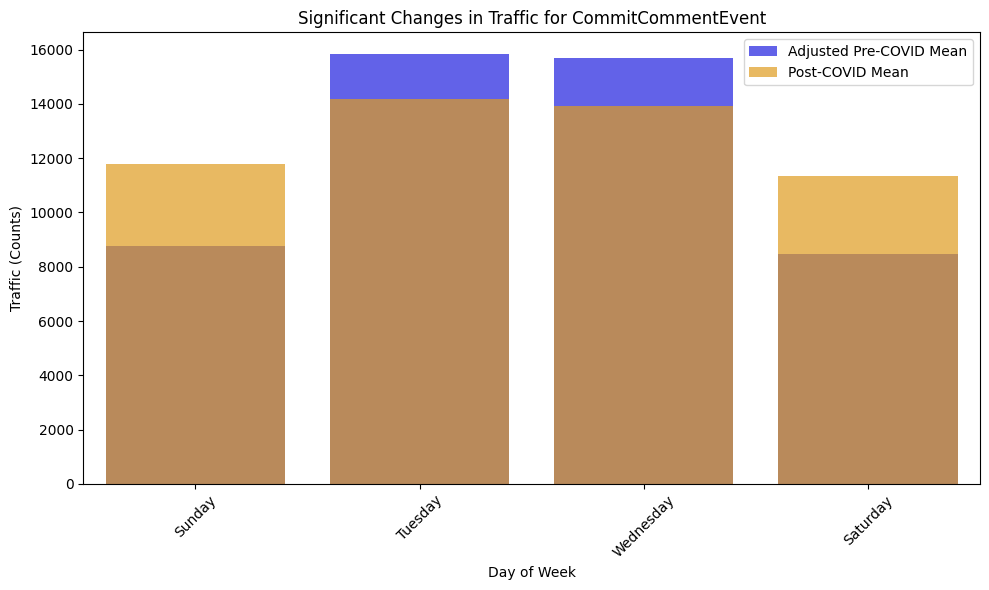

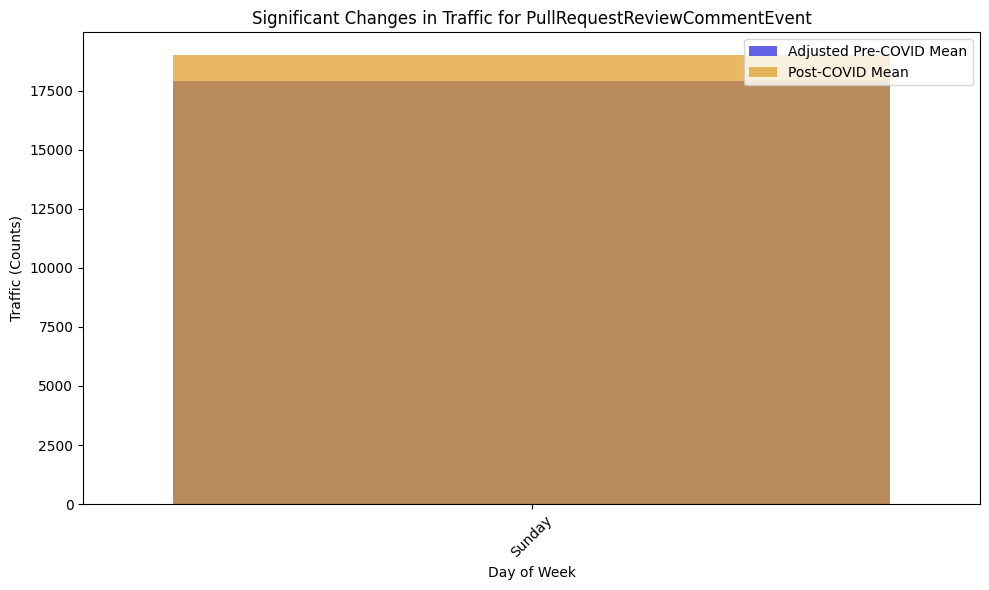

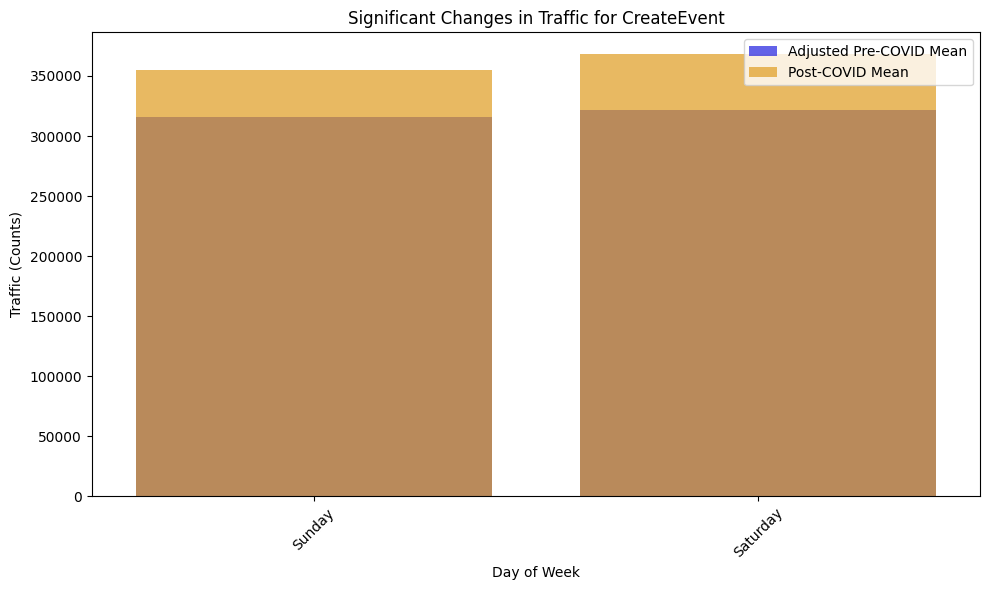

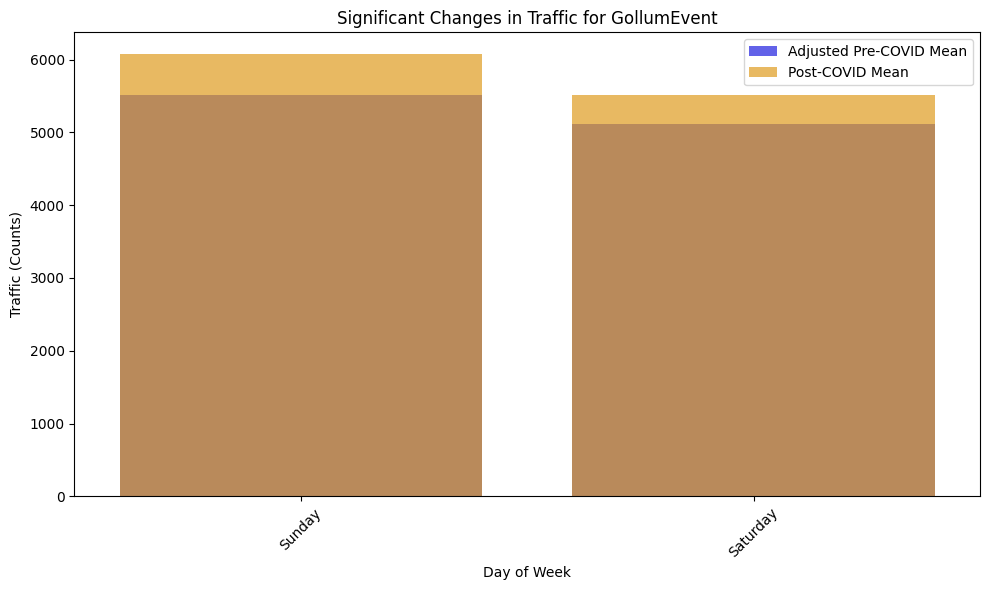

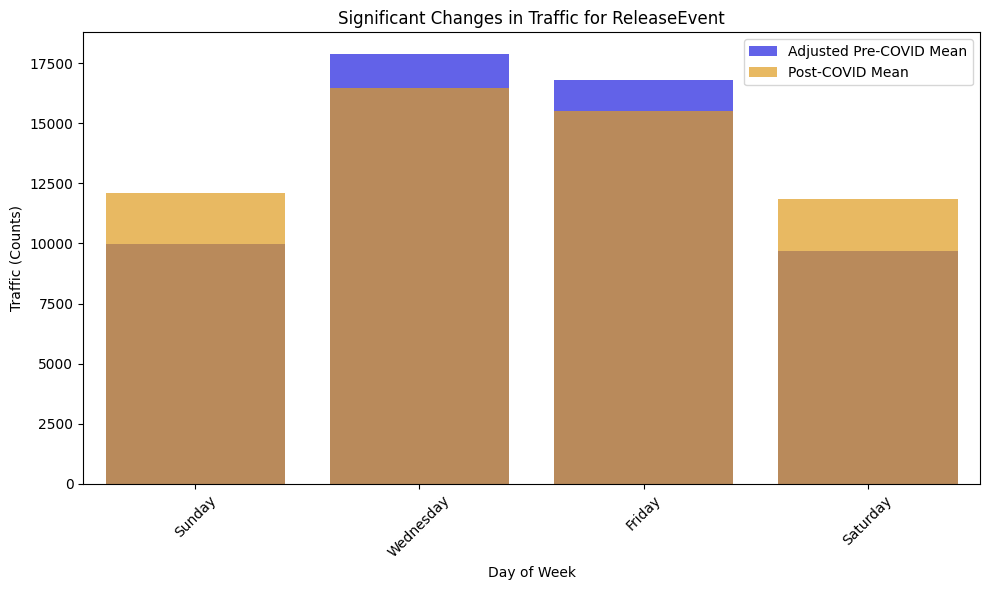

...

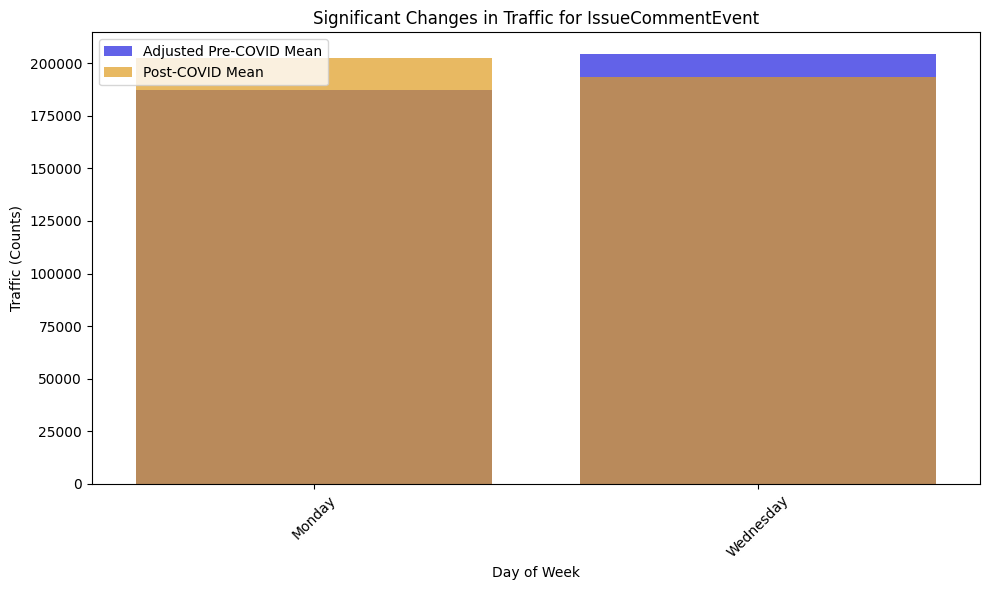

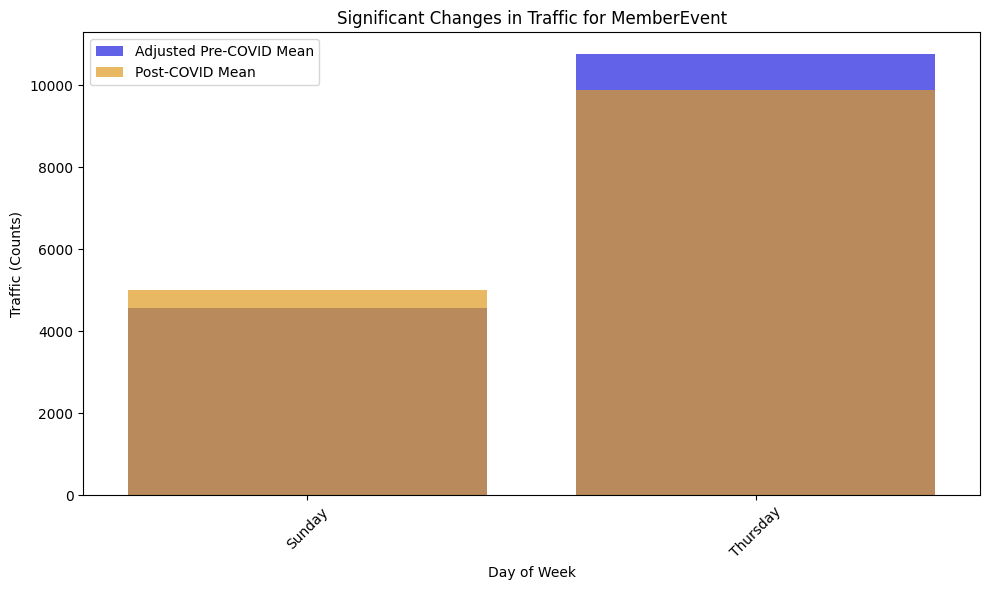

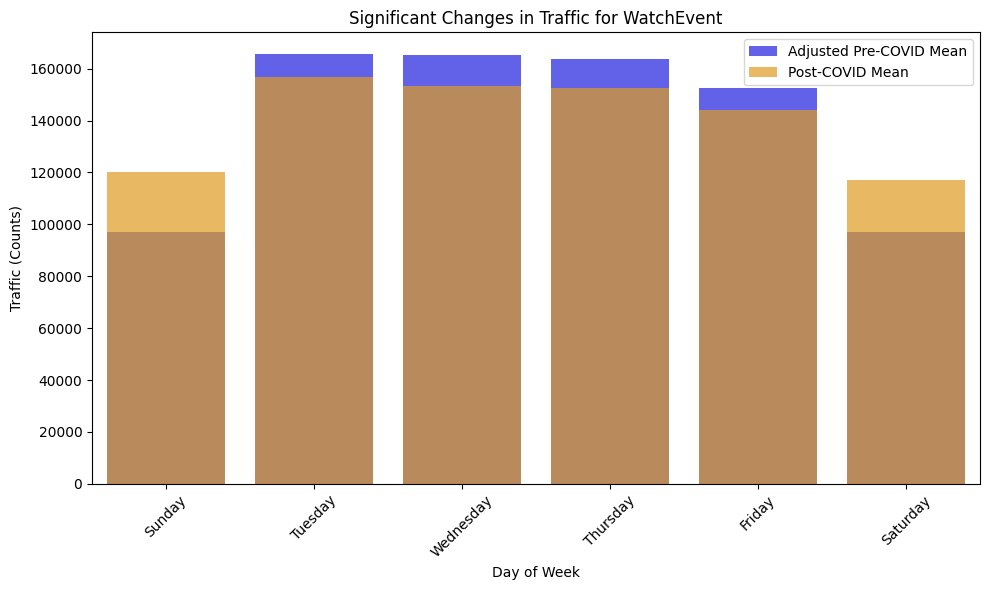

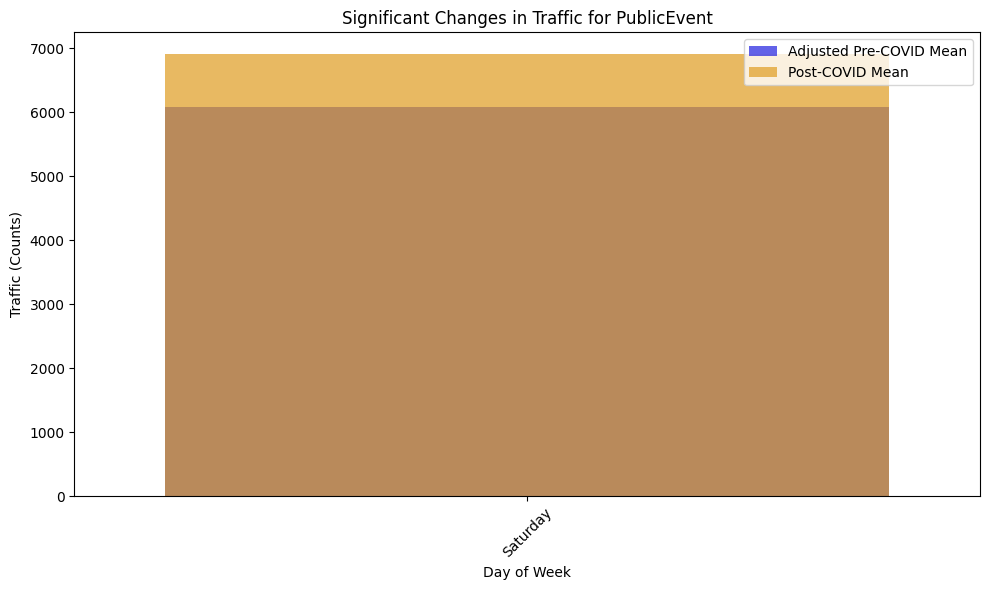

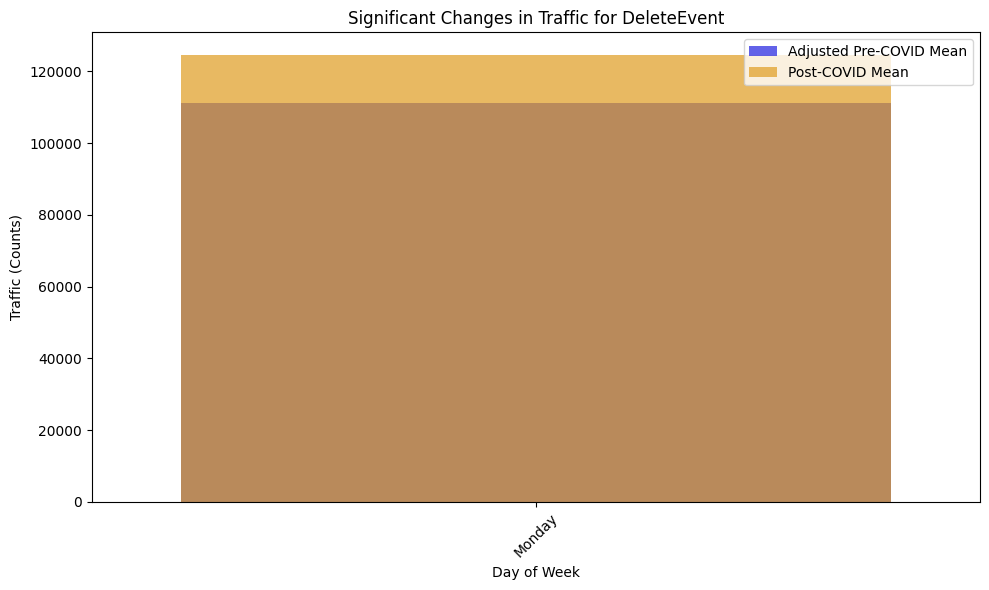

In [20]:
for event in significant_changes_df['Event'].unique():
    event_data = significant_changes_df[significant_changes_df['Event'] == event]

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=event_data,
        x='Day of Week',
        y='Adjusted Pre-COVID Mean',
        label='Adjusted Pre-COVID Mean',
        color='blue',
        alpha=0.7
    )
    sns.barplot(
        data=event_data,
        x='Day of Week',
        y='Post-COVID Mean',
        label='Post-COVID Mean',
        color='orange',
        alpha=0.7
    )
    plt.title(f'Significant Changes in Traffic for {event}')
    plt.ylabel('Traffic (Counts)')
    plt.xlabel('Day of Week')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(f'significant_changes_{event}.png')
    plt.show()

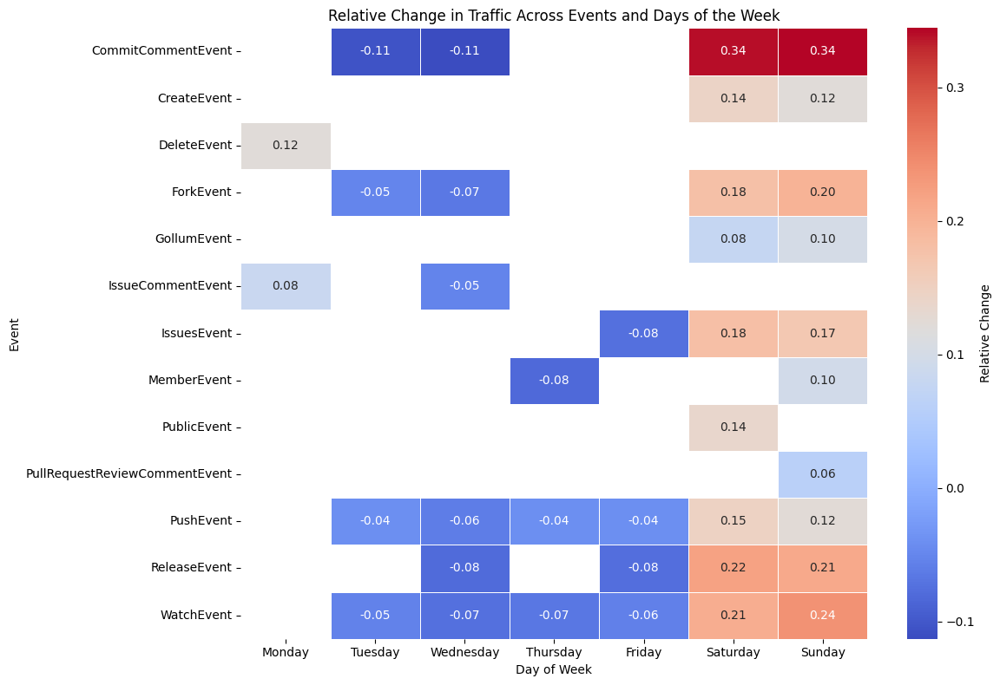

In [21]:
# Define the desired order for the days of the week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Pivot the significant changes dataframe for heatmap
heatmap_data = significant_changes_df.pivot(
    index="Event",
    columns="Day of Week",
    values="Relative Change"
)

# Reorder the columns (days of the week)
heatmap_data = heatmap_data[day_order]

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    heatmap_data,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    cbar_kws={'label': 'Relative Change'},
    linewidths=0.5
)
plt.title("Relative Change in Traffic Across Events and Days of the Week")
plt.xlabel("Day of Week")
plt.ylabel("Event")
plt.tight_layout()
plt.savefig("relative_change_heatmap.png")
plt.show()

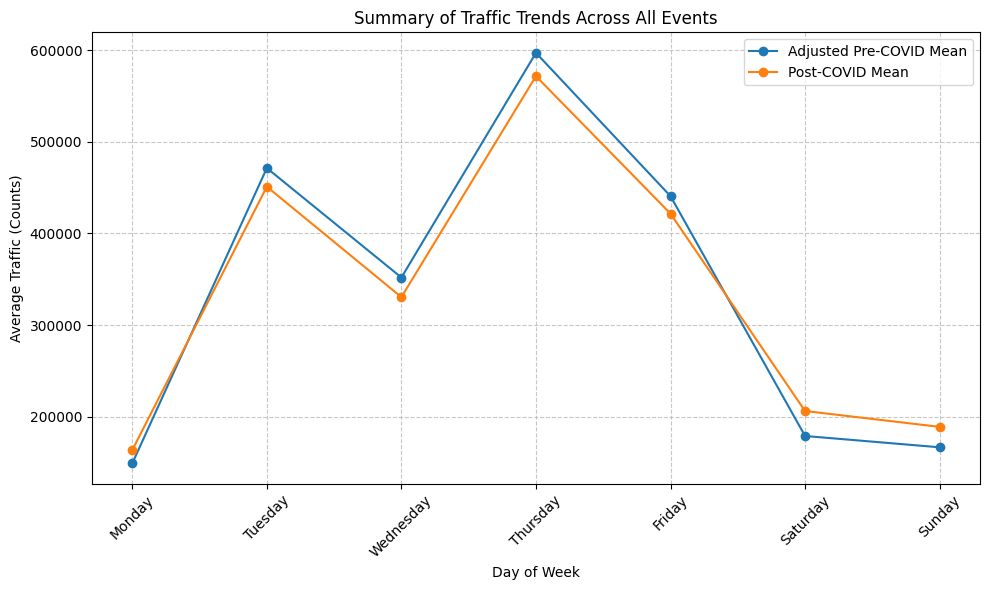

In [22]:
# Aggregate data across all events
summary_data = significant_changes_df.groupby('Day of Week').agg({
    'Adjusted Pre-COVID Mean': 'mean',
    'Post-COVID Mean': 'mean'
}).reset_index()

# Sort days of the week for a logical flow
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
summary_data['Day of Week'] = pd.Categorical(summary_data['Day of Week'], categories=day_order, ordered=True)
summary_data = summary_data.sort_values('Day of Week')

plt.figure(figsize=(10, 6))
plt.plot(summary_data['Day of Week'], summary_data['Adjusted Pre-COVID Mean'], marker='o', label='Adjusted Pre-COVID Mean')
plt.plot(summary_data['Day of Week'], summary_data['Post-COVID Mean'], marker='o', label='Post-COVID Mean')
plt.title("Summary of Traffic Trends Across All Events")
plt.ylabel("Average Traffic (Counts)")
plt.xlabel("Day of Week")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('traffic_trends_summary_all_events.png')
plt.show()

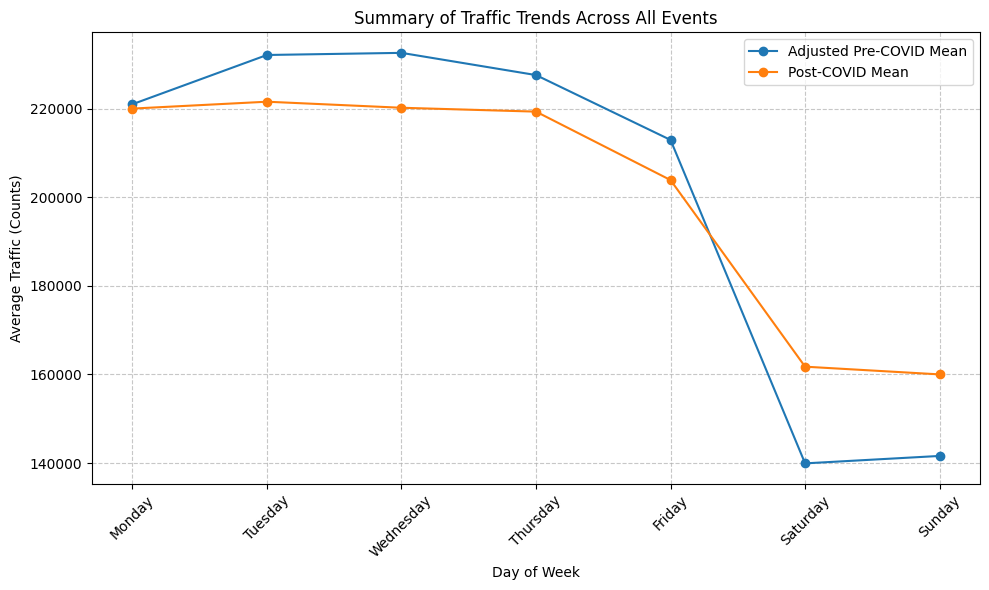

In [23]:
summary_data = trend_adjusted_results_df.groupby('Day of Week').agg({
    'Adjusted Pre-COVID Mean': 'mean',
    'Post-COVID Mean': 'mean'
}).reset_index()

day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
summary_data['Day of Week'] = pd.Categorical(summary_data['Day of Week'], categories=day_order, ordered=True)
summary_data = summary_data.sort_values('Day of Week')

plt.figure(figsize=(10, 6))
plt.plot(summary_data['Day of Week'], summary_data['Adjusted Pre-COVID Mean'], marker='o', label='Adjusted Pre-COVID Mean')
plt.plot(summary_data['Day of Week'], summary_data['Post-COVID Mean'], marker='o', label='Post-COVID Mean')
plt.title("Summary of Traffic Trends Across All Events")
plt.ylabel("Average Traffic (Counts)")
plt.xlabel("Day of Week")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('traffic_trends_summary_all_events.png')
plt.show()